In [64]:

import calendar #used to calculate N, number of days in a month#
import math
import datetime
import numpy as np
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt #to plot the maps
import cartopy.crs as crs
import csv

In [ ]:
"""
To assess the impact of extreme events on the deterioration of roads, we have considered two
main climatic events: (1) Flooding and (2) Extreme heat.

The extreme heat is assessed using:
(a) Extreme heat climatic factor TXx. A TXx extreme heat climatic factor where daily temperature exceeds 35 C
(b) Number of days daily temperature exceeds TXx. The number of days a year where the daily temperature exceeds 35 C

The flooding variable is assessed using:
(a) Flood events. Data from Dartmouth will indicate whether a flood ever occured in the location in the study years.
   This has been represented using a binary variable (1 or 0).
(b) TMI. The annual TMI changes will represent variations in climatic zones
(c) Potential evapotranspiration. The potential evapotranspiration (monthly) should indicate the level of wetness of the ground
"""

In [24]:
#conda install netCDF4
#import sys
#print(sys.executable)
#!conda list

# 1. DATA CLEANING AND PREPARATION

# 1.1 Input time values

In [66]:
#Read data
#roads_inventory = pd.read_csv("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_30_04_24_Flooding.csv")
#roads_inventory = pd.read_csv("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_02_05_24_trial.csv")
roads_inventory = pd.read_csv("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Road_data_310524.csv")

/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_70065/513961028.py:4: DtypeWarning: Columns (8,9,11,60) have mixed types. Specify dtype option on import or set low_memory=False.
  roads_inventory = pd.read_csv("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Road_data_310524.csv")


In [69]:
# Group the DataFrame by Road_name, GPS, and Year
road_copy = roads_inventory.copy()
grouped = road_copy.groupby(['SHRP_ID'])

# Define a function to reset time to 0 for the same Road_name and GPS and increment time for different years
def reset_time(group):
    time = 0
    prev_year = None
    for index, row in group.iterrows():
        if pd.notna(row['Maint']):
            time = 0
        elif prev_year is not None and prev_year != row['YEAR']:
            time += 1
        group.at[index, 'Time'] = time
        prev_year = row['Year']
        if pd.isna(prev_year):
            time += 1  # Increment time for NaN years
    return group

# Apply the function to each group
road_copy = grouped.apply(reset_time).reset_index(drop=True)

KeyError: 'Year'

## 1.2 Calculate TMI 

In [4]:
roads_inventory.head(10)

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,Rut,Surv_IRI,IRI,Layer_no,Layer,Thickness,Material,Extreme_heat,flooding,TMI
0,1978.0,0.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,Subgrade (untreated),NaN,215-Coarse-Grained Soil: Silty Sand with Gravel,0.0,1.0,NaN
1,1979.0,1.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,Unbound (granular) base,10.8,304-Crushed Gravel,0.0,1.0,NaN
2,1980.0,2.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,182.0,22.3,0.0,2,...,NaN,NaN,NaN,3.0,Asphalt concrete layer,3.6,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,(-63.250584745483124+0j)
3,1981.0,3.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,141.6,23.1,0.0,2,...,NaN,NaN,NaN,4.0,Asphalt concrete layer,0.0,"2-Hot Mixed, Hot Laid AC, Open Graded",0.0,1.0,(-63.68856030685768+0j)
4,1982.0,4.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,341.2,21.2,0.0,4,...,NaN,NaN,NaN,5.0,Asphalt concrete layer,0.0,73-Fog Seal,0.0,1.0,(-61.553179165107935+0j)
5,1983.0,5.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,344.9,21.2,0.0,4,...,NaN,NaN,NaN,6.0,Asphalt concrete layer,4.3,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,(-61.51580156519849+0j)
6,1984.0,6.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,259.1,21.7,0.0,4,...,NaN,NaN,NaN,7.0,Asphalt concrete layer,2.9,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,(-62.44051266381085+0j)
7,1985.0,7.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,174.9,21.7,0.0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-63.272271960249014+0j)
8,1986.0,8.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,187.8,22.3,0.0,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-63.19483414946005+0j)
9,1987.0,9.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,270.2,21.6,0.0,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-62.31880902884734+0j)


In [6]:
roads_inventory = roads_inventory.drop('TMI', axis=1)

In [7]:
#Use simplified formula since we have annual values

def calculate_thornthwaite_moisture_index(Temp, PRP):
    # Calculate the heat index (I)
    #Temp = row['Temp']
    I = (Temp / 5) ** 1.514
    
    # Determine the exponent (a)
    a = (0.000000675 * I**3) - (0.0000771 * I**2) + (0.01792 * I) + 0.49239
    
    # Assume average daylight hours factor (L) is about 12 hours
    L = 12
    
    # Estimate annual potential evapotranspiration (PET)
    #PET_annual = 16 * ((10 * T_annual / I) ** a) * L
    PET_annual = 16 * ((10 * (Temp*12) / I) ** a) * L
    
    # Calculate Thornthwaite Moisture Index (TMI)
    #TMI = (PRP - PET_annual) / PET_annual
    
    TMI = (75 * (PRP / PET_annual - 1)) + 10
    
    return TMI


In [8]:
# Calculate TMI for each row
roads_inventory['TMI'] = roads_inventory.apply(lambda row: calculate_thornthwaite_moisture_index(row['Temp'], row['PRP']), axis=1)

# Save the updated DataFrame back to the CSV file
#roads_inventory.to_csv("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_02_05_24_Updated.csv", index=False)

In [9]:
roads_inventory.head(20)

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,Rut,Surv_IRI,IRI,Layer_no,Layer,Thickness,Material,Extreme_heat,flooding,TMI
0,1978.0,0.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,Subgrade (untreated),NaN,215-Coarse-Grained Soil: Silty Sand with Gravel,0.0,1.0,NaN
1,1979.0,1.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,Unbound (granular) base,10.8,304-Crushed Gravel,0.0,1.0,NaN
2,1980.0,2.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,182.0,22.3,0.0,2,...,NaN,NaN,NaN,3.0,Asphalt concrete layer,3.6,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,-63.250585
3,1981.0,3.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,141.6,23.1,0.0,2,...,NaN,NaN,NaN,4.0,Asphalt concrete layer,0.0,"2-Hot Mixed, Hot Laid AC, Open Graded",0.0,1.0,-63.688560
4,1982.0,4.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,341.2,21.2,0.0,4,...,NaN,NaN,NaN,5.0,Asphalt concrete layer,0.0,73-Fog Seal,0.0,1.0,-61.553179
5,1983.0,5.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,344.9,21.2,0.0,4,...,NaN,NaN,NaN,6.0,Asphalt concrete layer,4.3,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,-61.515802
6,1984.0,6.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,259.1,21.7,0.0,4,...,NaN,NaN,NaN,7.0,Asphalt concrete layer,2.9,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,-62.440513
7,1985.0,7.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,174.9,21.7,0.0,2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,-63.272272
8,1986.0,8.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,187.8,22.3,0.0,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,-63.194834
9,1987.0,9.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,270.2,21.6,0.0,3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,-62.318809


In [10]:
roads_inventory = roads_inventory.drop('flooding', axis=1)

## 1.3 Flooding events

In [7]:
from shapely.geometry import Point

In [49]:
#Create a column for flood events
# Load your CSV data
#csv_file = '/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_02_05_24_Analyze.csv'  # Update this to the path of your CSV file
#fdf = pd.read_csv(csv_file)

# Convert DataFrame to GeoDataFrame
#gdf = gpd.GeoDataFrame(
    #fdf, geometry=gpd.points_from_xy(df.Longitude, df.Latitude),
    #crs="EPSG:4326"  # Make sure to use the correct CRS; EPSG:4326 is WGS 84
#)

In [230]:
# Load the shapefile with historical flood events
"""
The flood data was sourced from: https://floodobservatory.colorado.edu/Archives/index.html
Dartmouth Flood Observatory
"""
shapefile = '/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Historical Flood maps/FloodArchive_region.shp'  # Update this to the path of your shapefile
flood_data = gpd.read_file(shapefile)

# Ensure the shapefile has a 'year' field. If not, you might need to adjust this part.
# Assuming the flood events are recorded with a year field and they are point data


In [163]:
flood_data

,ID,GLIDENUMBE,COUNTRY,OTHERCOUNT,LONG,LAT,AREA,BEGAN,ENDED,VALIDATION,DEAD,DISPLACED,MAINCAUSE,SEVERITY,geometry
0,1,0,Algeria,0,5.230257,35.814242,92615.667857,1985-01-01,1985-01-05,News,26,3000,Heavy rain,1.0,"POLYGON ((1.99420 36.55729, 2.02735 36.57246, ..."
1,2,0,Brazil,0,-45.348871,-18.711052,678498.820856,1985-01-15,1985-02-02,News,229,80000,Heavy rain,2.0,"POLYGON ((-41.42766 -15.44157, -41.35541 -15.5..."
2,3,0,Phillipines,0,122.974280,10.020719,12846.028083,1985-01-20,1985-01-21,News,43,444,Torrential rain,1.0,"POLYGON ((123.33176 10.33395, 123.33387 10.309..."
3,4,0,Indonesia,0,124.606276,1.014892,16542.124840,1985-02-04,1985-02-18,News,21,300,Torrential rain,1.0,"POLYGON ((124.00846 0.36953, 123.99979 0.36974..."
4,5,0,Mozambique,0,32.349078,-25.869263,20082.210761,1985-02-09,1985-02-11,News,19,0,Heavy rain,2.0,"POLYGON ((32.01950 -24.85583, 33.85456 -25.050..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5126,5128,None,USA,None,-86.629070,32.490052,35416.484714,2021-10-06,2021-10-09,FloodList,4,0,Torrential Rain,1.5,"POLYGON ((-87.61881 33.33296, -85.88676 33.332..."
5127,5129,None,Mexico,None,-100.831838,19.950794,69141.859359,2021-10-01,2021-10-09,FloodList,4,2440,Heavy Rain,1.5,"POLYGON ((-99.00082 19.55364, -99.49569 18.760..."
5128,5130,None,India,None,87.961048,23.798370,42828.596577,2021-10-01,2021-10-09,FloodList,11,500000,Monsoonal Rain,1.5,"POLYGON ((88.50540 22.43461, 87.21874 22.53442..."
5129,5131,None,Italy,None,9.375700,44.639302,10408.227806,2021-10-04,2021-10-06,FloodList,0,0,Torrential Rain,1.5,"POLYGON ((10.11801 44.14328, 9.82108 44.06905,..."


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

In [248]:
# Function to check if point intersects with any polygon for a given year and calculate flood area
def check_flooding(row):
    point = Point(row['Longitude'], row['Latitude'])
    year = row['Year']
    if pd.isna(year):
        return 0, 0, None, None, 0  # Return 0 for flooding, 0 for flood duration, None for dates, 0 for flood area if year is NaN
    year = str(int(year))  # Convert year to string to match with the 'BEGAN' column format
    floods_in_year = flood_data[flood_data['BEGAN'].str.startswith(year)]
    for _, flood_polygon in floods_in_year.iterrows():
        if point.within(flood_polygon['geometry']):
            flood_area = flood_polygon['geometry'].area
            return 1, (pd.to_datetime(flood_polygon['ENDED']) - pd.to_datetime(flood_polygon['BEGAN'])).days, flood_polygon['BEGAN'], flood_polygon['ENDED'], flood_area
    return 0, 0, None, None, 0  # Return 0 for flooding, 0 for flood duration, None for dates, 0 for flood area if no flood event is found

# Apply function to each row in roads_inventory DataFrame
result = road_data.apply(check_flooding, axis=1, result_type='expand')

# Assign results to new columns
roads_inventory[['flooding', 'flood_duration', 'Flood_BEGAN', 'Flood_END', 'flood_area']] = result

In [249]:
roads_inventory[roads_inventory['flood_area']>0]

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,TMI,flooding,flood_duration,Flood_BEGAN,Flood_END,TX35,extreme_heat,PET,ETR,flood_area
18,1995,0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,155.3,22.4,0.0,3.0,...,-63.514080,1.0,92.0,1995-05-15,1995-08-15,0.0,0,126.925189,0.817290,153.231773
19,1995,0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,155.3,22.4,0.0,3.0,...,-63.514080,1.0,92.0,1995-05-15,1995-08-15,0.0,0,126.925189,0.817290,153.231773
20,1995,0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,155.3,22.4,0.0,3.0,...,-63.514080,1.0,92.0,1995-05-15,1995-08-15,0.0,0,126.925189,0.817290,153.231773
21,1995,0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,155.3,22.4,0.0,3.0,...,-63.514080,1.0,92.0,1995-05-15,1995-08-15,0.0,0,126.925189,0.817290,153.231773
32,2003,0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,195.8,22.9,0.0,3.0,...,-63.169520,1.0,80.0,2003-08-24,2003-11-12,0.0,0,128.151627,0.654503,46.209168
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1910,2003,13,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,220.7,19.3,0.0,3.0,...,-62.580532,1.0,80.0,2003-08-24,2003-11-12,6.0,1,120.159180,0.544446,46.209168
1915,2008,18,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,190.7,18.3,0.0,2.0,...,-62.822488,1.0,11.0,2008-07-28,2008-08-08,2.0,1,118.294479,0.620317,51.332325
1917,2010,20,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,320.4,18.1,2.0,3.0,...,-61.312332,1.0,11.0,2010-07-23,2010-08-03,18.0,1,117.940951,0.368105,99.260273
1918,2011,21,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,178.4,17.8,3.0,3.0,...,-62.922358,1.0,38.0,2011-08-01,2011-09-08,10.0,1,117.423033,0.658201,124.330235


In [250]:
column_names = roads_inventory.columns

column_names

Index(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 'PRP',
       'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'Road_class', 'Clim_zone',
       'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der',
       'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue', 'Longitudinal_WP',
       'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI', 'IRI', 'Layer_no',
       'Layer', 'Thickness', 'Material', 'TMI', 'flooding', 'flood_duration',
       'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat', 'PET', 'ETR',
       'flood_area'],
      dtype='object')

## 1.4  Extreme heat

In [ ]:
"""
Collect extreme heat conditions
The extreme heat is assessed using:
(a) Extreme heat climatic factor TXx. A TXx extreme heat climatic factor where daily temperature exceeds 35 C (TX35)
(b) Number of days daily temperature exceeds TXx. The number of days a year where the daily temperature exceeds 35 C (Tdays)
(c) The maximum daily temperature for that year (Tmax)
(d) If an extreme heat event has occured (Extreme_heat)
"""

In [2]:
#Use this csv as it has collected TMI ad flood data
roads_inventory = pd.read_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_06_05_24_Analyze.csv')

In [5]:
import ee
from datetime import datetime

In [9]:
# Initialize the Earth Engine module.
ee.Authenticate()
ee.Initialize()

Enter verification code:  4/1AdLIrYf-ba-ImF2nQS6lzzUCuuBEYeZ3qiWZ2qHiHMgqyGk5az8Sht2uy8E



Successfully saved authorization token.


In [10]:
def get_hot_days(year, latitude, longitude):
    # Convert year to integer to avoid formatting issues
    year = int(year)

    # Define the start and end dates
    start_date = ee.Date.fromYMD(year, 1, 1)
    end_date = start_date.advance(1, 'year')

    # Create a point
    point = ee.Geometry.Point(longitude, latitude)

    # Filter ERA5 Daily Dataset for the given year and location
    dataset = ee.ImageCollection('ECMWF/ERA5/DAILY')\
        .filterDate(start_date, end_date)\
        .filterBounds(point)

    # Select the temperature at 2 meters above surface, convert from Kelvin to Celsius
    temp = dataset.select('maximum_2m_air_temperature').map(lambda image: image.subtract(273.15))

    # Count days where temperature is above 35 degrees Celsius
    hot_days = temp.map(lambda image: image.gt(35).selfMask()).sum()

    # Get the information from the server to the client
    count = hot_days.reduceRegion(
        reducer=ee.Reducer.sum(), 
        geometry=point, 
        scale=1000  # Suitable scale based on dataset resolution
    ).getInfo()

    # Extract the number from the dictionary returned by getInfo
    hot_day_count = count.get('maximum_2m_air_temperature')
    
    return hot_day_count

# Load your DataFrame here, for example:
# roads_inventory = pd.read_csv('path_to_your_file.csv')

total_rows = len(roads_inventory)

def get_hot_days_with_progress(row):
    result = get_hot_days(row['Year'], row['Latitude'], row['Longitude'])
    get_hot_days_with_progress.counter += 1
    print(f"Completed {get_hot_days_with_progress.counter} of {total_rows} rows", end='\r')
    return result

# Initialize counter
get_hot_days_with_progress.counter = 0

# Usage within DataFrame
roads_inventory['TX35'] = roads_inventory.apply(get_hot_days_with_progress, axis=1)

# Ensure the last message stays on the screen by printing a newline at the end
print(f"Completed {get_hot_days_with_progress.counter} of {total_rows} rows")

Completed 2033 of 2033 rows


In [25]:
roads_inventory

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,Layer,Thickness,Material,TMI,flooding,flood_duration,Flood_BEGAN,Flood_END,TX35,extreme_heat
0,1978.0,0.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,Subgrade (untreated),NaN,215-Coarse-Grained Soil: Silty Sand with Gravel,NaN,0.0,0.0,NaN,NaN,NaN,0
1,1979.0,1.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,NaN,NaN,NaN,NaN,...,Unbound (granular) base,10.8,304-Crushed Gravel,NaN,0.0,0.0,NaN,NaN,1.0,1
2,1980.0,2.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,182.0,22.3,0.0,2,...,Asphalt concrete layer,3.6,"1-Hot Mixed, Hot Laid AC, Dense Graded",-63.250585,0.0,0.0,NaN,NaN,1.0,1
3,1981.0,3.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,141.6,23.1,0.0,2,...,Asphalt concrete layer,0.0,"2-Hot Mixed, Hot Laid AC, Open Graded",-63.688560,0.0,0.0,NaN,NaN,1.0,1
4,1982.0,4.0,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,341.2,21.2,0.0,4,...,Asphalt concrete layer,0.0,73-Fog Seal,-61.553179,0.0,0.0,NaN,NaN,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2028,2019.0,29.0,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,318.8,18.2,0.0,3,...,NaN,NaN,NaN,-61.345258,0.0,0.0,NaN,NaN,38.0,1
2029,2020.0,30.0,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,69.7,19.6,0.0,3,...,NaN,NaN,NaN,-64.245423,0.0,0.0,NaN,NaN,9.0,1
2030,2021.0,31.0,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,200.9,19.8,0.0,3,...,NaN,NaN,NaN,-62.843324,1.0,9.0,2021-07-20,2021-07-29,NaN,0
2031,2022.0,32.0,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,205.6,19.2,0.0,2,...,NaN,NaN,NaN,-62.736699,0.0,0.0,NaN,NaN,NaN,0


In [18]:
roads_inventory = roads_inventory.drop('Extreme_heat', axis=1)

In [24]:
roads_inventory['extreme_heat'] = roads_inventory['TX35'].apply(lambda x: 1 if x > 0 else 0)

In [ ]:
#Get the Maximum daily temperature for that year 


In [29]:
#roads_inventory = roads_inventory.drop(Clim_zone =['Wet, Freeze','2'])

roads_inventory = roads_inventory[~((roads_inventory['Clim_zone']=='Wet, Freeze')|(roads_inventory['Clim_zone']=='2'))]

In [251]:
# Save the updated DataFrame to a new CSV file
roads_inventory.to_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_30_05_24_Analyze.csv', index=False)

### Pavement properties

In [ ]:
# Calculate the structural number of the road pavements
def calc_SN(row):
    """
    param a: layer coefficient. Layer coefficients can be determined using 
        i. Predetermined values sourced from: https://www.cecalc.com/References/AASHTO%20Pavement%20Design.pdf
        ii. Empirical equations from field experiments or AASHTO https://wisconsindot.gov/documents2/research/97-02layercoefficients.pdf: 
            - Granular base (AASHTO): a2 = 0.249 log E2 - 0.977
            - Granular subbase (AASHTO): a3=0.227 log E3 - 0.839
            - Asphalt concrete (Mustaque et al., 1997): a1 = 0.4 log(E/3000MPa)+ 0.44 (ranges between 0.2&0.44)
            - Bituminous base (Mustaque et al., 1997): a2 = 0.3 log(E/3000MPa)+ 0.15 (ranges between 0.1&0.3)
            - Granular subbase (Mustaque et al., 1997): a3 = 0.23 log(E/160MPa)+ 0.15 (ranges between 0.06&0.2)
            where E is the resilient modulus for the layer
    param D: thickness of the pavement layer (i = 1 to N). Units: inches
    param M2: drainage coefficient for the base 
    param M3: drainage coefficient for the subbase
    """
   E = row[]



# 2. DIAGNOSTIC TESTS

In [ ]:
"""
Diagnostic tests include:
1. Check for normality of dependent variables (IRI, Rut, Cracking)
2. Check for multi-collinearity between the independent variables (scatter &  pearsons correlated coeeficient, VIF for categorical data). 
Separate them by traffic data, environmental data, external (maintenance), pavement conditions
"""

In [15]:
from scipy.stats import shapiro

## 2.1 Normality

## 2.1.1 IRI

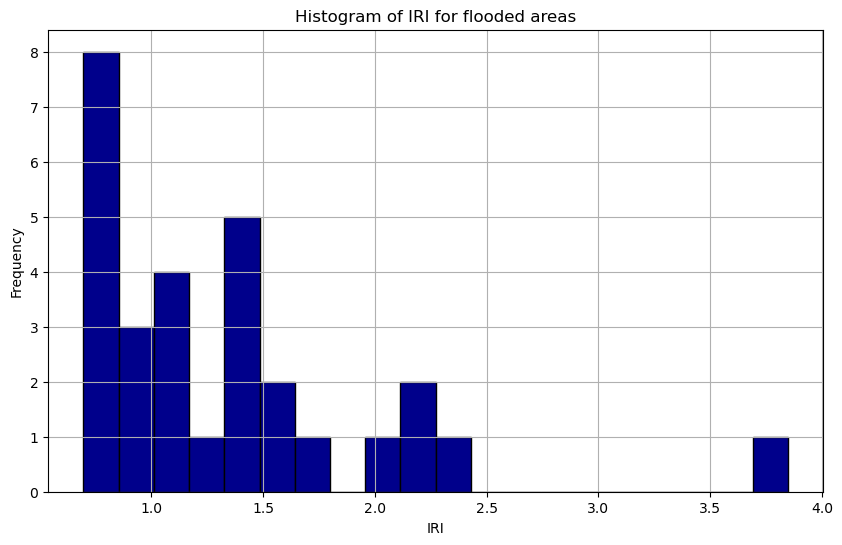

Shapiro-Wilk test results:
Statistic: 0.804938554763794
p-value: 0.00010254497465211898


In [137]:

# Filter road segments with flooding values of 1
flooded_segments = roads_inventory[roads_inventory['flooding'] == 1]

# Drop rows with NaN values in the 'IRI' column
flooded_segments = flooded_segments.dropna(subset=['IRI'])
#flooded_segments = flooded_segments.dropna(subset=['Rut'])

# Plot histogram of IRI
plt.figure(figsize=(10, 6))
plt.hist(flooded_segments['IRI'], bins=20, color='darkblue', edgecolor='black')
plt.xlabel('IRI')
plt.ylabel('Frequency')
plt.title('Histogram of IRI for flooded areas')
plt.grid(True)
plt.show()

# Perform Shapiro-Wilk test for normality
shapiro_stat, shapiro_pvalue = shapiro(flooded_segments['IRI'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

"""
Shapiro-Wilk test results:
Statistic: 0.804938554763794 # between 0 and 1 and measures how well the ordered and standardized sample quantiles fit the standard normal quantiles.
p-value: 0.00010254497465211898 p<0.05 implying it is NOT a Normal distribution. The data significantly deviates from a normal distribution
"""

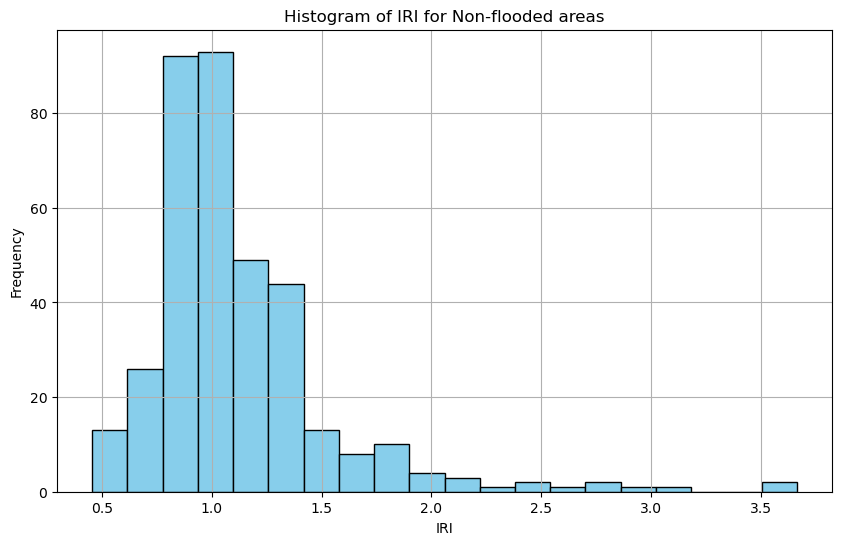

Shapiro-Wilk test results:
Statistic: 0.7969983220100403
p-value: 4.88362021434409e-21


In [138]:
# Filter road segments with flooding values of 1
nonflooded_segments = roads_inventory[roads_inventory['flooding'] == 0]

# Drop rows with NaN values in the 'IRI' column
nonflooded_segments = nonflooded_segments.dropna(subset=['IRI'])

# Plot histogram of IRI
plt.figure(figsize=(10, 6))
plt.hist(nonflooded_segments['IRI'], bins=20, color='blue', edgecolor='black')
plt.xlabel('IRI')
plt.ylabel('Frequency')
plt.title('Histogram of IRI for Non-flooded areas')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(nonflooded_segments['IRI'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

In [46]:
from scipy.stats import gaussian_kde
from matplotlib.ticker import PercentFormatter

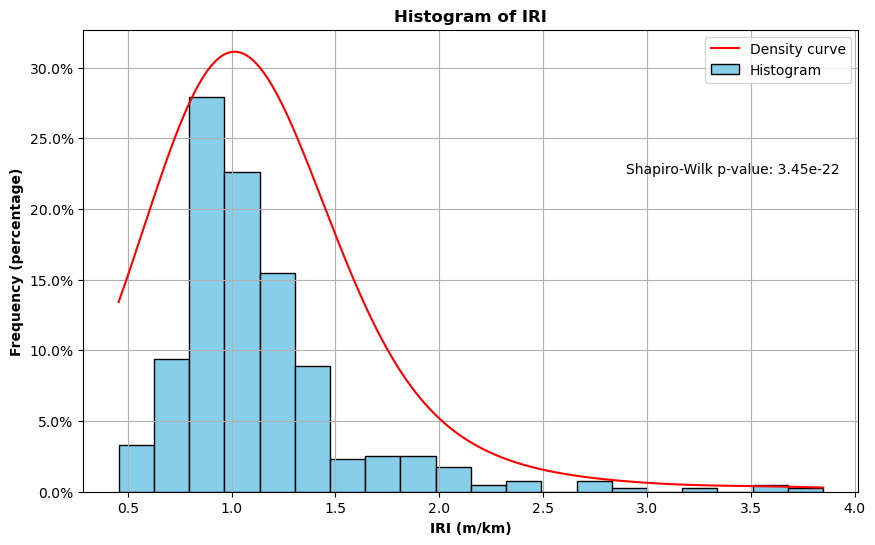

Shapiro-Wilk test results:
Statistic: 0.789979153934576
p-value: 3.44726339353135e-22


In [97]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['IRI'])

# Calculate Shapiro-Wilk test on data
data = inventory['IRI']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=0.8)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('IRI (m/km)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of IRI', fontweight='bold')
plt.grid(True)
plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_IRI')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)



### Rutting

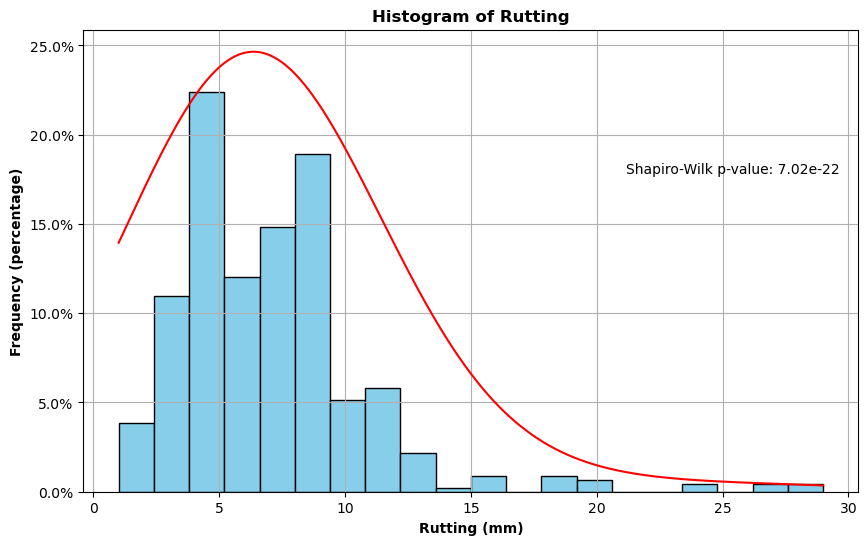

Shapiro-Wilk test results:
Statistic: 0.8297604458743639
p-value: 7.024531316665158e-22


In [98]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['Rut'])

# Calculate Shapiro-Wilk test on data
data = inventory['Rut']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=1.1)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('Rutting (mm)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of Rutting', fontweight='bold')
plt.grid(True)
#plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_Rut')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)


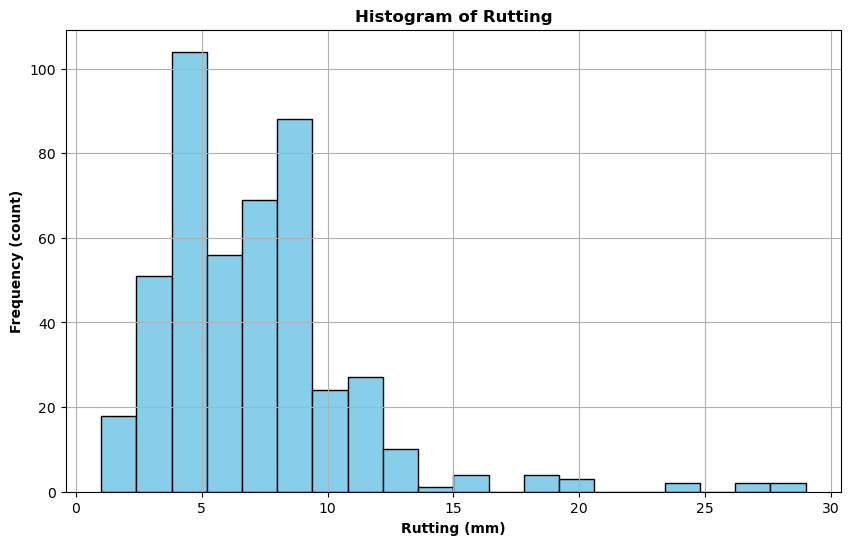

Shapiro-Wilk test results:
Statistic: 0.8297604458743639
p-value: 7.024531316665158e-22


<Figure size 640x480 with 0 Axes>

In [35]:
# Hisogram for rutting
inventory = roads_inventory.dropna(subset=['Rut'])
# Plot histogram of IRI
plt.figure(figsize=(10, 6))
plt.hist(inventory['Rut'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Rutting (mm)', fontweight='bold')
plt.ylabel('Frequency (count)', fontweight='bold')
plt.title('Histogram of Rutting', fontweight='bold')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(inventory['Rut'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_Rut')

### Fatigue Cracking

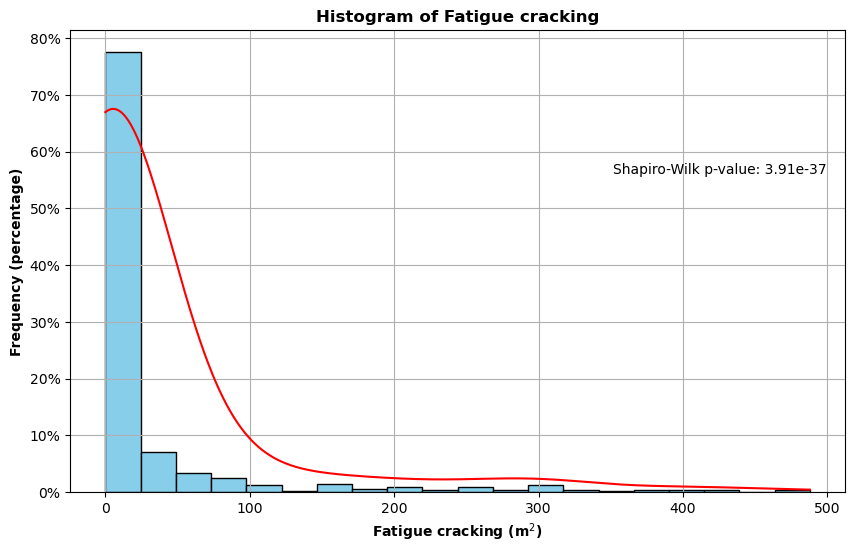

Shapiro-Wilk test results:
Statistic: 0.46152524587692734
p-value: 3.909501991849183e-37


In [99]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['Fatigue'])

# Calculate Shapiro-Wilk test on data
data = inventory['Fatigue']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=0.5)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('Fatigue cracking (m$^2$)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of Fatigue cracking', fontweight='bold')
plt.grid(True)
#plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_Fatigue')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)


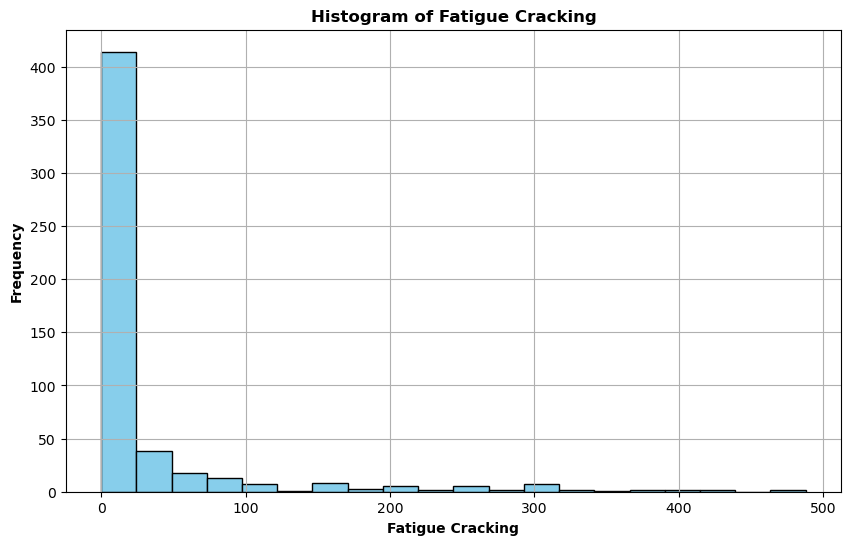

Shapiro-Wilk test results:
Statistic: 0.46152524587692734
p-value: 3.909501991849183e-37


In [20]:
# Histogram of cracking and normality test
inventory = roads_inventory.dropna(subset=['Fatigue'])
# Plot histogram 
plt.figure(figsize=(10, 6))
plt.hist(inventory['Fatigue'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Fatigue Cracking', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.title('Histogram of Fatigue Cracking', fontweight='bold')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(inventory['Fatigue'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

### Wheel-Path Longitudinal cracking

/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/1686406966.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory['Longitudinal_WP'].str.split(',', expand = True)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/1686406966.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].astype(float)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/16864

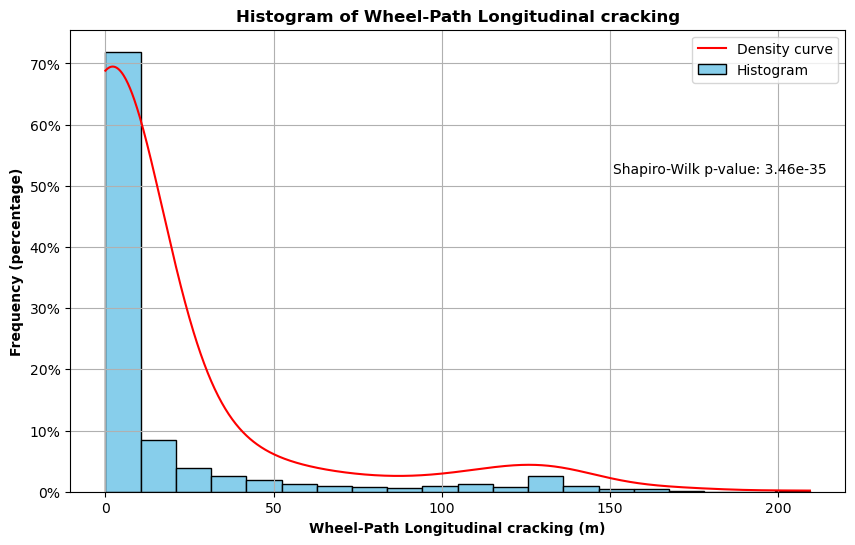

Shapiro-Wilk test results:
Statistic: 0.5355095068227884
p-value: 3.457594349231721e-35


In [100]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['Longitudinal_WP'])
#Fix the error with a particular data point
inventory[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory['Longitudinal_WP'].str.split(',', expand = True)
inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].astype(float)
inventory['Longitudinal_NWP'] = inventory['Longitudinal_NWP'].astype(float)

# Calculate Shapiro-Wilk test on data
data = inventory['Longitudinal_WP']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=0.4)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('Wheel-Path Longitudinal cracking (m)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of Wheel-Path Longitudinal cracking', fontweight='bold')
plt.grid(True)
plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_LongitudinalWP')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2520963531.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory['Longitudinal_WP'].str.split(',', expand = True)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2520963531.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].astype(float)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/25209

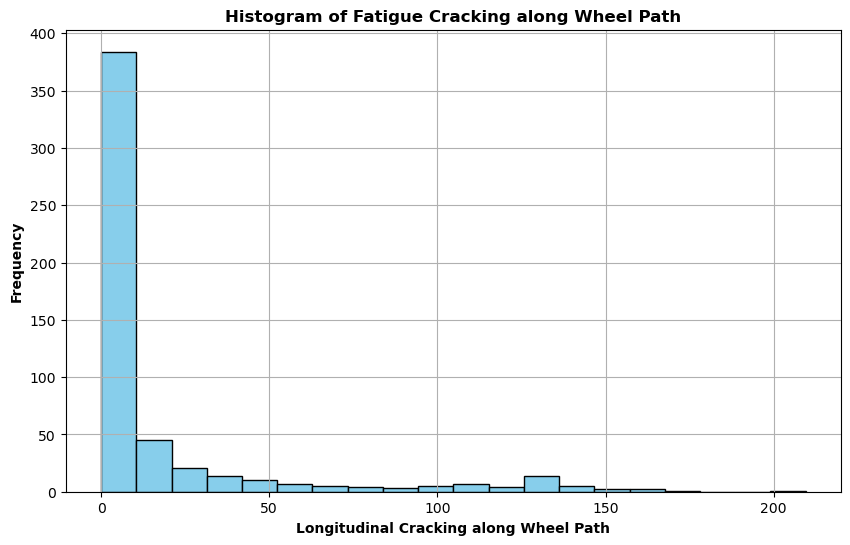

Shapiro-Wilk test results:
Statistic: 0.5355095068227884
p-value: 3.457594349231721e-35


In [26]:
# Histogram of cracking and normality test
inventory = roads_inventory.dropna(subset=['Longitudinal_WP'])

#Fix the error with a particular data point
inventory[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory['Longitudinal_WP'].str.split(',', expand = True)
inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].astype(float)
inventory['Longitudinal_NWP'] = inventory['Longitudinal_NWP'].astype(float)
#row_index =inventory[inventory['Longitudinal_WP'] == '51,206.50'].index[0]
#inventory.loc[row_index+1, 'Longitudinal_NWP'] = inventory.loc[row_index, 'Longitudinal_WP'].split(',')[0]
#inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].replace('', pd.NA)
#inventory['Longitudinal_WP'] = inventory['Longitudinal_WP'].astype(float)
# Plot histogram 
plt.figure(figsize=(10, 6))
plt.hist(inventory['Longitudinal_WP'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Longitudinal Cracking along Wheel Path', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.title('Histogram of Fatigue Cracking along Wheel Path', fontweight='bold')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(inventory['Longitudinal_WP'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

### Longitudinal cracking along Non-Wheel Path

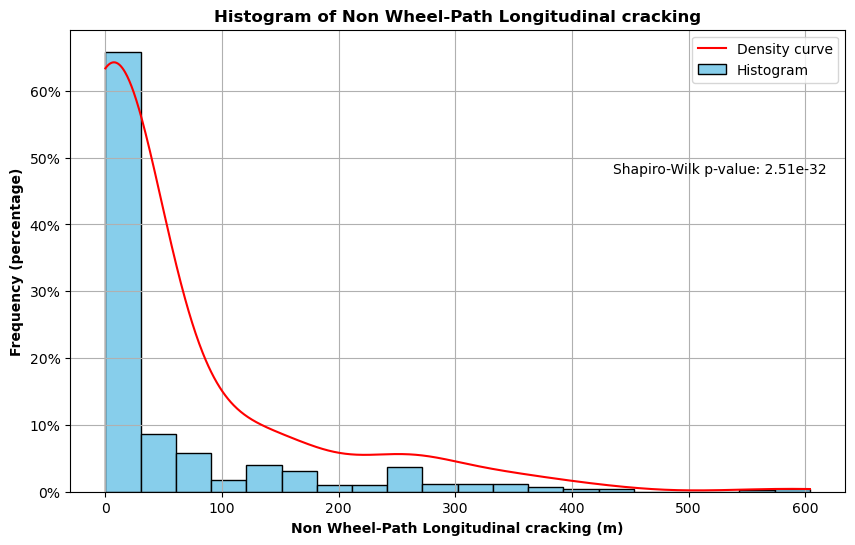

Shapiro-Wilk test results:
Statistic: 0.6212268144306654
p-value: 2.507999032971297e-32


In [101]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['Longitudinal_NWP'])

# Calculate Shapiro-Wilk test on data
data = inventory['Longitudinal_NWP']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=0.4)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('Non Wheel-Path Longitudinal cracking (m)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of Non Wheel-Path Longitudinal cracking', fontweight='bold')
plt.grid(True)
plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_LongitudinalNWP')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

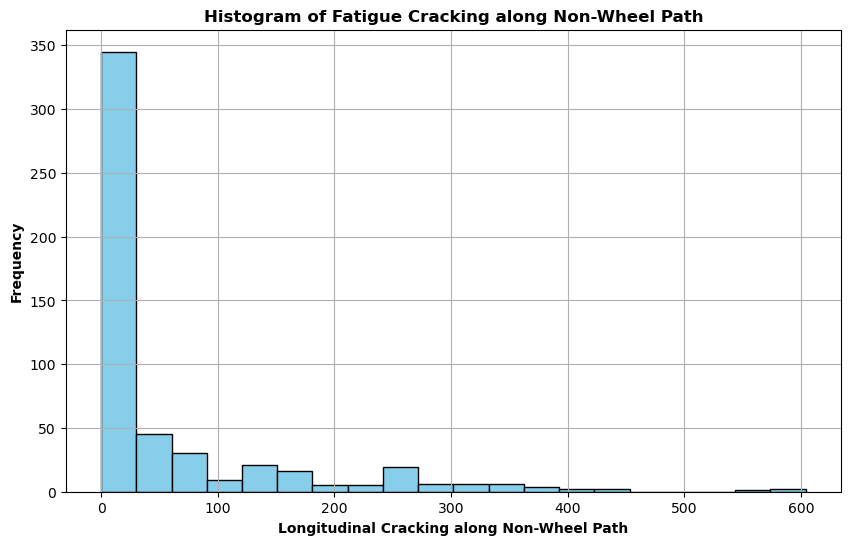

Shapiro-Wilk test results:
Statistic: nan
p-value: 1.0


In [27]:
# Histogram of cracking and normality test
inventory = roads_inventory.dropna(subset=['Longitudinal_WP'])

# Plot histogram 
plt.figure(figsize=(10, 6))
plt.hist(inventory['Longitudinal_NWP'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Longitudinal Cracking along Non-Wheel Path', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.title('Histogram of Fatigue Cracking along Non-Wheel Path', fontweight='bold')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(inventory['Longitudinal_NWP'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)

### Transverse Cracking

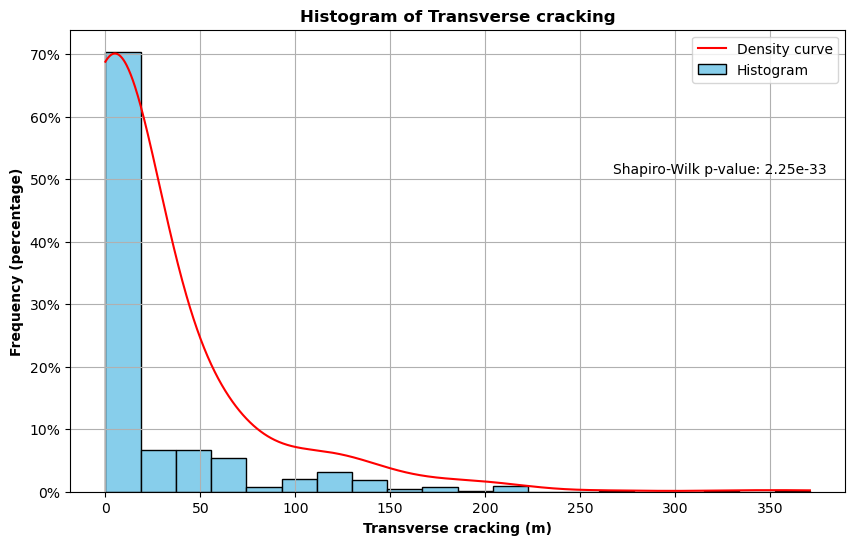

Shapiro-Wilk test results:
Statistic: 0.5968033321959565
p-value: 2.245560206918044e-33


In [102]:
# Histogram of IRI to assess normality
inventory = roads_inventory.dropna(subset=['Transverse'])

# Calculate Shapiro-Wilk test on data
data = inventory['Transverse']
shapiro_stat, shapiro_pvalue = shapiro(data)

# Plot histogram of Rutting
plt.figure(figsize=(10, 6))
density = gaussian_kde(data, bw_method=0.5)  # Adjust bw_method as needed

# Generate values for density line
x = np.linspace(min(data), max(data), 1000)
y = density(x)

# Compute the histogram
counts, bin_edges = np.histogram(data, bins=20, density=True)
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])
total_count = sum(counts)

# Plot histogram
plt.bar(bin_centers, counts / total_count, width=np.diff(bin_edges), align='center', color='skyblue', edgecolor='black', label='Histogram')

# Plot density curve
plt.plot(x, y*100 / y.sum(), 'r-', label='Density curve')

# Adding text for Shapiro-Wilk p-value
plt.text(0.70, 0.70, f'Shapiro-Wilk p-value: {shapiro_pvalue:.2e}',
         transform=plt.gca().transAxes, fontsize=10, verticalalignment='center_baseline')

# Formatter to convert y-axis ticks to percentage
plt.gca().yaxis.set_major_formatter(PercentFormatter(1))

plt.xlabel('Transverse cracking (m)', fontweight='bold')
plt.ylabel('Frequency (percentage)', fontweight='bold')
plt.title('Histogram of Transverse cracking', fontweight='bold')
plt.grid(True)
plt.legend()

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Histogram_Transverse')

plt.show()

print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)
print("p-value:", shapiro_pvalue)


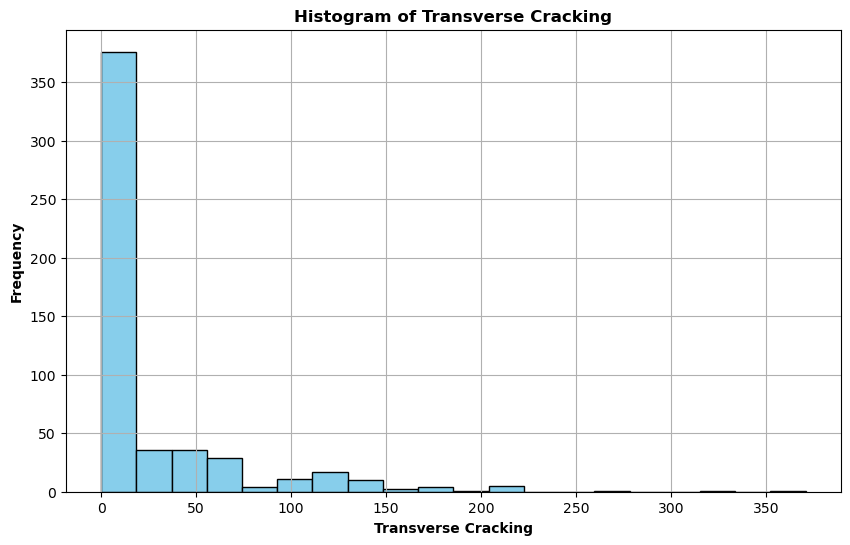

Shapiro-Wilk test results:
Statistic: 0.5968033321959565


In [30]:
# Histogram of cracking and normality test
inventory = roads_inventory.dropna(subset=['Transverse'])

# Plot histogram 
plt.figure(figsize=(10, 6))
plt.hist(inventory['Transverse'], bins=20, color='skyblue', edgecolor='black')
plt.xlabel('Transverse Cracking', fontweight='bold')
plt.ylabel('Frequency', fontweight='bold')
plt.title('Histogram of Transverse Cracking', fontweight='bold')
plt.grid(True)
plt.show()

shapiro_stat, shapiro_pvalue = shapiro(inventory['Transverse'])
print("Shapiro-Wilk test results:")
print("Statistic:", shapiro_stat)


## 2.2 Homogeneity

In [282]:
import scipy.stats as stats

In [308]:
# Brown-Forsythe Test for equal variances across different Road Classes
# 'IRI' across different 'Road_class'
grouped_data = {
    group: data.dropna()
    for group, data in roads_inventory.groupby('Clim_zone')['Rut']
}

stat, p_value = stats.levene(*grouped_data.values(), center='median')
print(f'Brown-Forsythe Test - Statistic: {stat}, p-value: {p_value}')


Brown-Forsythe Test - Statistic: 5.779834942785752, p-value: 0.0006935618486403351


In [284]:
import seaborn as sns
import matplotlib.pyplot as plt

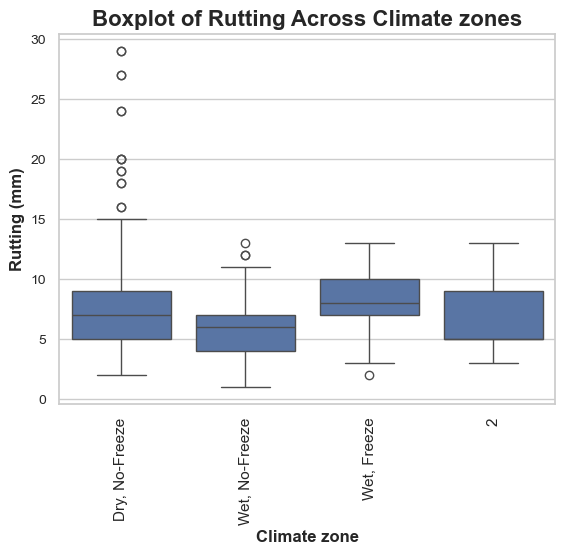

In [305]:
# Boxplot to visualize variances across groups
sns.boxplot(x='Clim_zone', y='Rut', data=roads_inventory)
plt.xlabel('Climate zone', fontweight='bold', fontsize=12)
plt.ylabel('Rutting (mm)', fontweight='bold', fontsize=12)
plt.title('Boxplot of Rutting Across Climate zones', fontweight='bold', fontsize=16)
# Improve legibility by tweaking the ticks and labels
plt.xticks(rotation=90)  # Rotate x labels for better readability if needed
plt.yticks(fontsize=10)
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Box_Rut_Clim')
plt.show()


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2790998560.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  box = sns.boxplot(x='Road_class', y='IRI', data=roads_inventory,


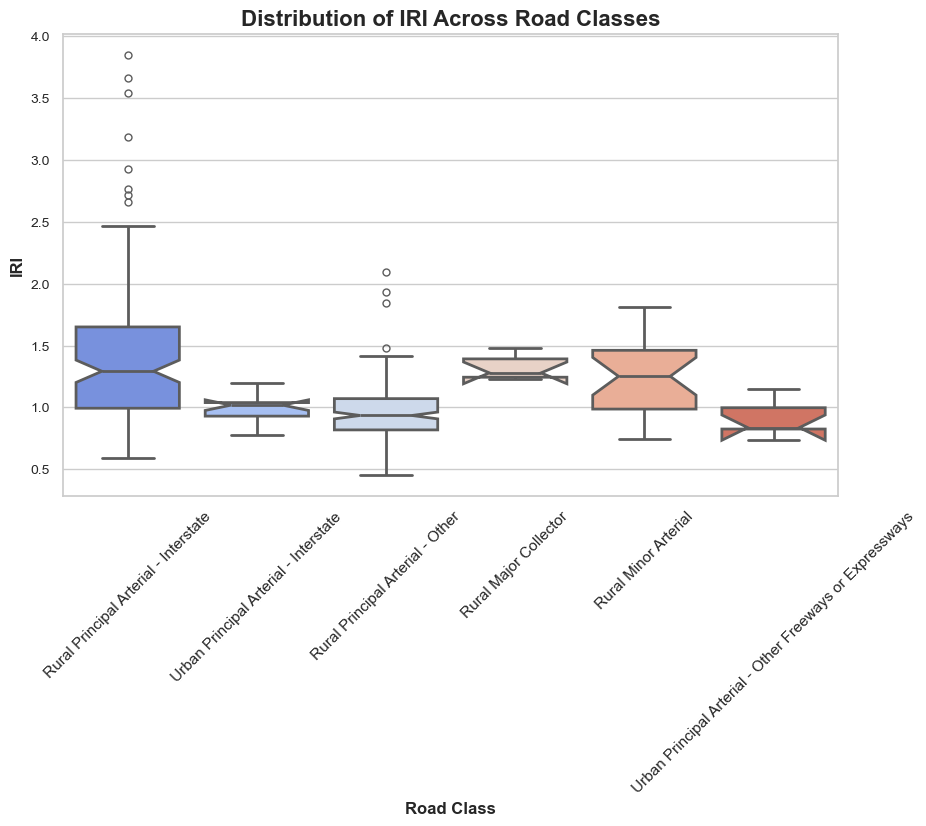

In [286]:
# Set a style
sns.set(style="whitegrid")  # Provides a nice background grid for contrast

# Create a larger figure size to better accommodate the plot
plt.figure(figsize=(10, 6))

# Create a boxplot with enhanced aesthetics
box = sns.boxplot(x='Road_class', y='IRI', data=roads_inventory,
                  palette="coolwarm",  # Color palette for visual appeal
                  fliersize=5,  # Size of the outliers markers
                  linewidth=2,  # Width of the lines of the boxes
                  notch=True)  # Adds a notch to indicate the confidence interval around the median

# Adding labels and title with custom font sizes
plt.xlabel('Road Class', fontweight='bold', fontsize=12)
plt.ylabel('IRI', fontweight='bold', fontsize=12)
plt.title('Distribution of IRI Across Road Classes', fontweight='bold', fontsize=16)

# Optional: Add annotations or specific data labels if necessary
# for patch in box.artists:
#     r, g, b, a = patch.get_facecolor()
#     patch.set_facecolor((r, g, b, .9))  # Adjust transparency

# Improve legibility by tweaking the ticks and labels
plt.xticks(rotation=45)  # Rotate x labels for better readability if needed
plt.yticks(fontsize=10)

# Show the plot
plt.show()


## 2.4 Linearity

In [ ]:
# Check linearity between 'IRI' and 'TMI' using Spearman's correlation
spearman_corr, p_value = stats.spearmanr(roads_inventory['TMI'].dropna(), roads_inventory['IRI'].dropna())
print(f"Spearman's Rank Correlation - Correlation: {spearman_corr}, p-value: {p_value}")

### Unit change in defects

In [262]:
# Function to calculate IRI_diff
roads = roads_inventory.copy()
def calculate_iri_diff(group):
    group = group.sort_values('Year')
    group['IRI'] = group['IRI'].interpolate(method='linear')
    group['IRI_diff'] = group['IRI'].diff() / group['Year'].diff()
    return group

# Apply the function to each GPS group
roads = roads.groupby('GPS').apply(calculate_iri_diff).reset_index(drop=True)


,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,flooding,flood_duration,Flood_BEGAN,Flood_END,TX35,extreme_heat,PET,ETR,flood_area,IRI_diff
0,1976,0,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,0.0,NaN
1,1977,1,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,0.0,NaN
2,1978,2,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,NaN,NaN,0,NaN,NaN,0.0,NaN
3,1979,3,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0.0,0.0,NaN,NaN,0.0,0,NaN,NaN,0.0,NaN
4,1980,4,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,877.9,18.4,4.8,19.0,...,0.0,0.0,NaN,NaN,0.0,0,118.473697,0.134951,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1926,2019,4,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1660.9,10.9,106.0,43.0,...,0.0,0.0,NaN,NaN,0.0,0,110.340092,0.066434,0.0,0.0
1927,2020,5,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1483.7,11.9,27.0,40.0,...,0.0,0.0,NaN,NaN,0.0,0,110.682224,0.074599,0.0,0.0
1928,2021,6,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1236.1,11.9,61.0,43.0,...,0.0,0.0,NaN,NaN,NaN,0,110.682224,0.089541,0.0,0.0
1929,2022,7,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1396.8,12.0,90.0,39.0,...,0.0,0.0,NaN,NaN,NaN,0,110.732031,0.079276,0.0,0.0


In [265]:
roads_inventory.columns

Index(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 'PRP',
       'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'Road_class', 'Clim_zone',
       'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der',
       'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue', 'Longitudinal_WP',
       'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI', 'IRI', 'Layer_no',
       'Layer', 'Thickness', 'Material', 'TMI', 'flooding', 'flood_duration',
       'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat', 'PET', 'ETR',
       'flood_area'],
      dtype='object')

In [6]:
 """
    Data on defects. Fetch data on the different defects collected during road condition surveys.
    :param SURVEY_WIDTH: Width of pavement surveyed for distress measurements. Units: m
    :param BLK_CRACK_A: Total area of block cracking. Units: sq.m
    :param EDGE_CRACK_L: Total length of edge cracking. Units: m
    :param LONG_CRACK_WP_SEAL_L: Total well sealed longitudinal cracking length in wheel path. Units: m
    :param LONG_CRACK_NWP_SEAL_L: Total well sealed non-wheel longitudinal cracking length in wheel path. Units: m 
    :param PATCH_A: Total area of patching. Units: sq.m
    :param POTHOLES_A: Total pothole area. Units: sq.m
    :param SHOVING_A: Area of shoving, localized longitudinal displacement of the pavement surface. Units: sq.m
    :param BLEEDING: Presence of excess asphalt on the pavement surface which may create a shiny, glass-like reflective surface. 
        Units: sq.m
    :param RAVELING: Wearing away of the pavement surface caused by the dislodging of aggregate particles and loss of asphalt binder.
        Units: sq.m 
    """
def calculate_iri_diff(group):
    """
    Calculate normalized annual change in IRI.
    param IRI: IRI recorded on survey data. Units: m/km
    param IRI_diff: Annual normalized change in IRI. Units: m/km/year
    """
    group = group.sort_values('Year')
    group['IRI'] = group['IRI'].interpolate(method='linear')
    group['IRI_diff'] = group['IRI'].diff() / group['Year'].diff()
    return group

def calculate_fatigue_diff(group):
    """
    :param Fatigue: Total alligator (fatigue) cracking area. Units: sq.m
    :param MEPDG_CRACKING_PERCENT_AC: The total area of alligator cracking summed across all levels of severity, divided 
        by the total area of the test section, in accordance with MEPDG definitions. Note that LTPP alligator cracking 
        interpretations are not restricted to the wheel path. Units: %
    :param GATOR_CRACK_A: Total alligator (fatigue) cracking area. Units: sq.m
    """
    group = group.sort_values('Year')
    group['Fatigue'] = group['Fatigue'].interpolate(method='linear')
    group['Fatigue_diff'] = group['Fatigue'].diff() / group['Year'].diff()
    return group

def calculate_longWP_diff(group):
    """
    :param Longitudinal_WP/ LONG_CRACK_WP_L: Total longitudinal cracking length in wheel path. Units: m
    :param MEPDG_LONG_CRACK_LENGTH_AC: Total length of sealed and unsealed longitudinal cracks in the wheel path at all 
        severity levels divided by test section length. Units: m/km
    """
    group = group.sort_values('Year')
    group['Longitudinal_WP'] = group['Longitudinal_WP'].interpolate(method='linear')
    group['LongWP_diff'] = group['Longitudinal_WP'].diff() / group['Year'].diff()
    return group

def calculate_longNWP_diff(group):
    """
    :param Longitudinal_NWP/ LONG_CRACK_NWP_L: Total length of non-wheel path longitudinal cracking. Units: m
    """
    group = group.sort_values('Year')
    group['Longitudinal_NWP'] = group['Longitudinal_NWP'].interpolate(method='linear')
    group['LongNWP_diff'] = group['Longitudinal_NWP'].diff() / group['Year'].diff()
    return group

def calculate_transverse_diff(group):
    """
    :param Transverse/ TRANS_CRACK_L: Total transverse cracking length. Units: m
    :param TRANS_CRACK_SEAL_L:Total length of well sealed transverse cracking. Units: m
    :param MEPDG_TRANS_CRACK_LENGTH_AC: Total length of sealed and unsealed transverse cracks at all levels of severity, 
        divided by test section length in accordance with current pavement MEPDG distress definitions.
        Units: m/km
    """
    group = group.sort_values('Year')
    group['Transverse'] = group['Transverse'].interpolate(method='linear')
    group['transverse_diff'] = group['Transverse'].diff() / group['Year'].diff()
    return group

def calculate_rut_diff(group):
    """
    :param rut: 
    """
    group = group.sort_values('Year')
    group['Rut'] = group['Rut'].interpolate(method='linear')
    group['Rut_diff'] = group['Rut'].diff() / group['Year'].diff()
    return group

# Apply the function to each GPS group
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_iri_diff).reset_index(drop=True)
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_fatigue_diff).reset_index(drop=True)
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_longWP_diff).reset_index(drop=True)
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_longNWP_diff).reset_index(drop=True)
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_transverse_diff).reset_index(drop=True)
roads_inventory = roads_inventory.groupby('GPS').apply(calculate_rut_diff).reset_index(drop=True)

In [375]:
roads_inventory

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,extreme_heat,PET,ETR,flood_area,IRI_diff,Fatigue_diff,LongWP_diff,LongNWP_diff,transverse_diff,Rut_diff
0,1976,0,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,1977,1,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,1978,2,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
3,1979,3,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,NaN,NaN,NaN,NaN,...,0,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,1980,4,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,877.9,18.4,4.8,19.0,...,0,118.473697,0.134951,0.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1926,2019,4,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1660.9,10.9,106.0,43.0,...,0,110.340092,0.066434,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1927,2020,5,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1483.7,11.9,27.0,40.0,...,0,110.682224,0.074599,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1928,2021,6,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1236.1,11.9,61.0,43.0,...,0,110.682224,0.089541,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1929,2022,7,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1396.8,12.0,90.0,39.0,...,0,110.732031,0.079276,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
# Create the Maint_no column
roads_inventory['Maint_no'] = roads_inventory['Maint'].notnull().astype(int)

In [272]:
roads_inventory[roads_inventory['Maint_no'] ==1]

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,PET,ETR,flood_area,IRI_diff,Fatigue_diff,LongWP_diff,LongNWP_diff,transverse_diff,Rut_diff,Maint_no
16,1991,0,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1523.6,18.7,0.0,18.0,...,119.021091,0.078118,0.0,NaN,-inf,NaN,NaN,NaN,NaN,1
70,1991,0,"U. S.-84 , Eastbound",31.24191 - -85.61339,31.24191,85.61339,1523.6,18.7,0.0,18.0,...,119.021091,0.078118,0.0,NaN,-inf,NaN,NaN,NaN,NaN,1
136,1991,0,"U. S.-84 , Eastbound",31.24198 - -85.61624,31.24198,85.61624,1523.6,18.7,0.0,18.0,...,119.021091,0.078118,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1
138,1991,0,"U. S.-84 , Eastbound",31.24198 - -85.61624,31.24198,85.61624,1523.6,18.7,0.0,18.0,...,119.021091,0.078118,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1
225,1990,0,"U. S.-84 , Eastbound",31.24275 - -85.56616,31.24275,85.56616,695.1,19.9,0.0,12.0,...,121.354057,0.174585,0.0,NaN,-inf,-inf,-inf,-inf,-inf,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1864,2012,0,"State-0362 , Southbound",38.53352 - -118.61907,38.53352,118.61907,202.5,11.5,114.0,3.0,...,110.510558,0.545731,0.0,0.0310,-inf,0.000000,-inf,7.000000,NaN,1
1867,2015,0,"State-0362 , Southbound",38.53352 - -118.61907,38.53352,118.61907,491.6,11.6,105.0,3.0,...,110.549265,0.224876,0.0,0.0110,0.00,0.000000,0.000000,0.000000,0.250000,1
1904,2001,0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1184.5,11.2,46.0,38.0,...,110.411830,0.093214,0.0,0.0140,0.00,-0.366667,-89.466667,-7.666667,-2.666667,1
1908,2002,0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1579.3,11.3,13.0,35.0,...,110.441799,0.069931,0.0,-inf,NaN,NaN,NaN,NaN,-inf,1


In [10]:

roads_inventory.to_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_31_05_24_Analyze.csv')

In [273]:
num_col = ['Rut_diff', 'transverse_diff', 'LongNWP_diff', 'LongWP_diff', 'Fatigue_diff', 'IRI_diff']
roads_clean = roads_inventory.dropna(subset=num_col)
roads_clean

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,PET,ETR,flood_area,IRI_diff,Fatigue_diff,LongWP_diff,LongNWP_diff,transverse_diff,Rut_diff,Maint_no
18,1993,2,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1172.2,18.4,0.0,20.0,...,118.473697,0.101070,0.0,0.021000,0.0,0.0,0.0,0.0,1.5,0
19,1994,3,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1675.7,18.2,1.0,36.0,...,118.116895,0.070488,0.0,0.021000,0.0,0.0,0.0,0.0,1.5,0
20,1995,4,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1235.6,18.6,0.5,26.0,...,118.837009,0.096178,0.0,-0.002000,0.0,0.0,0.0,0.0,0.0,0
21,1996,5,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1393.6,17.9,15.0,31.0,...,117.594013,0.084381,0.0,-0.002000,0.0,0.0,0.0,1.0,0.0,0
22,1997,6,"U. S.-84 , Eastbound",31.24191 - -85.61059,31.24191,85.61059,1169.4,18.5,1.6,19.0,...,118.654543,0.101466,0.0,-0.016667,0.0,0.0,0.0,-0.5,0.5,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1926,2019,4,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1660.9,10.9,106.0,43.0,...,110.340092,0.066434,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0
1927,2020,5,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1483.7,11.9,27.0,40.0,...,110.682224,0.074599,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0
1928,2021,6,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1236.1,11.9,61.0,43.0,...,110.682224,0.089541,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0
1929,2022,7,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,1396.8,12.0,90.0,39.0,...,110.732031,0.079276,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0


In [301]:
roads_clean[roads_clean['Maint_no'] ==1]

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,PET,ETR,flood_area,IRI_diff,Fatigue_diff,LongWP_diff,LongNWP_diff,transverse_diff,Rut_diff,Maint_no
428,1993,0,"Interstate-19 , Northbound",31.77613 - -111.03015,31.77613,111.03015,288.6,18.7,0.0,3.0,...,119.021091,0.412408,0.000000,0.070000,0.300000,0.000000,5.520000,0.600000,0.250000,1
477,1993,0,"U. S.-431 , Northbound",32.53467 - -85.08147,32.53467,85.08147,1280.4,17.0,4.0,12.0,...,116.115932,0.090687,0.000000,-inf,-inf,-inf,-inf,-inf,-inf,1
540,1998,0,"Interstate-8 , Eastbound",32.82861 - -111.98935,32.82861,111.98935,265.0,20.9,0.0,4.0,...,123.469139,0.465921,0.000000,inf,72.600000,inf,-4.375000,inf,0.333333,1
545,2001,0,"Interstate-8 , Eastbound",32.82861 - -111.98935,32.82861,111.98935,238.1,22.5,0.0,3.0,...,127.167518,0.534093,0.000000,0.078333,-147.750000,63.900000,94.200000,67.500000,1.500000,1
548,2002,0,"Interstate-8 , Eastbound",32.82861 - -111.98935,32.82861,111.98935,93.2,22.5,0.0,2.0,...,127.167518,1.364458,0.000000,0.050000,-0.850000,0.000000,0.000000,0.000000,0.000000,1
550,2003,0,"Interstate-8 , Eastbound",32.82861 - -111.98935,32.82861,111.98935,191.6,22.7,0.0,3.0,...,127.656616,0.666266,46.209168,0.040000,-145.500000,0.000000,0.000000,0.000000,-5.000000,1
614,2002,0,"Interstate-8 , Eastbound",32.82891 - -111.99691,32.82891,111.99691,93.2,22.5,0.0,2.0,...,127.167518,1.364458,0.000000,0.010667,0.000000,-1.650000,13.300000,5.000000,0.000000,1
616,2003,0,"Interstate-8 , Eastbound",32.82891 - -111.99691,32.82891,111.99691,191.6,22.7,0.0,3.0,...,127.656616,0.666266,46.209168,0.012000,0.000000,-0.200000,101.500000,3.000000,-1.500000,1
674,1998,0,"Interstate-8 , Eastbound",32.82909 - -112.00134,32.82909,112.00134,265.0,20.9,0.0,4.0,...,123.469139,0.465921,0.000000,0.020500,0.133333,12.200000,0.466667,8.000000,0.000000,1
681,2002,0,"Interstate-8 , Eastbound",32.82909 - -112.00134,32.82909,112.00134,93.2,22.5,0.0,2.0,...,127.167518,1.364458,0.000000,-0.018000,0.000000,9.000000,9.500000,-1.000000,0.000000,1


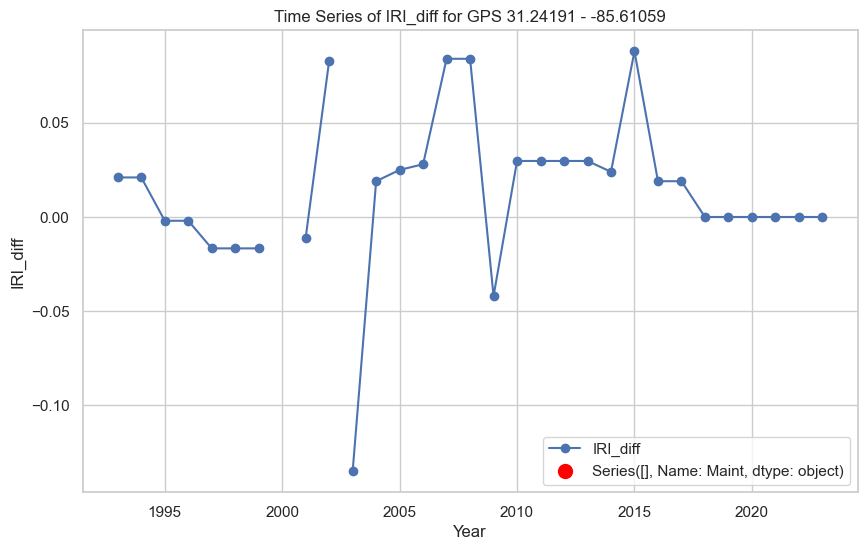

In [298]:
# Filter data for a specific GPS
gps = '31.24191 - -85.61059'
df_gps = roads_clean[roads_clean['GPS'] == gps]

# Plotting the time series
plt.figure(figsize=(10, 6))
plt.plot(df_gps['Year'], df_gps['IRI_diff'], marker='o', label='IRI_diff')

# Add red dots where Maint event occurred
maint_events = df_gps[df_gps['Maint_no'] == 1]
plt.scatter(maint_events['Year'], maint_events['IRI_diff'], color='red', s=100, zorder=5, label=maint_events['Maint'])

plt.xlabel('Year')
plt.ylabel('IRI_diff')
plt.title(f'Time Series of IRI_diff for GPS {gps}')
plt.legend()
plt.grid(True)
plt.show()


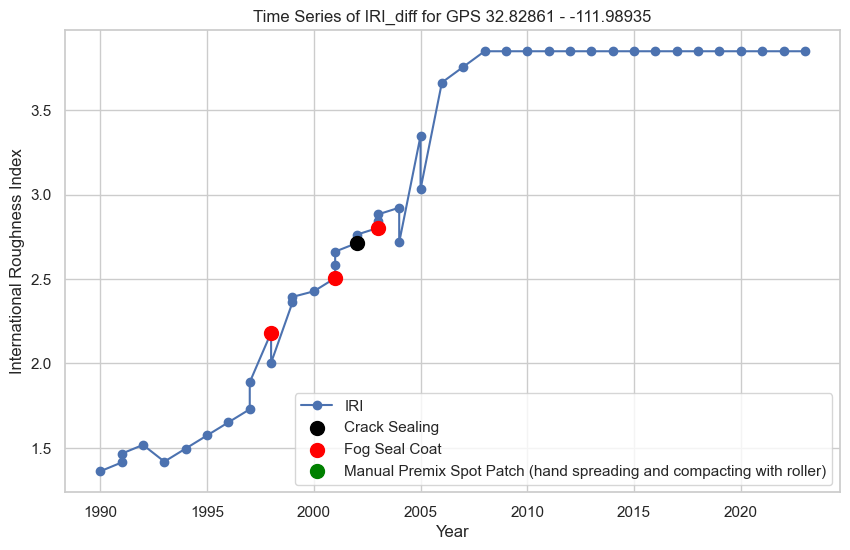

In [303]:
# Filter data for a specific GPS
gps = '32.82861 - -111.98935'
df_gps = roads_inventory[roads_inventory['GPS'] == gps]

# Define color mapping for maintenance types
color_mapping = {
    'Crack Sealing': 'black',
    'Fog Seal Coat': 'red',
    'Manual Premix Spot Patch (hand spreading and compacting with roller)': 'green'
}

# Plotting the time series
plt.figure(figsize=(10, 6))
plt.plot(df_gps['Year'], df_gps['IRI'], marker='o', label='IRI')

# Plot maintenance events with different colors
for maint_type, color in color_mapping.items():
    maint_events = df_gps[df_gps['Maint'] == maint_type]
    plt.scatter(maint_events['Year'], maint_events['IRI'], color=color, s=100, zorder=5, label=maint_type)

# Add legend for maintenance types
plt.xlabel('Year')
plt.ylabel('International Roughness Index')
plt.title(f'Time Series of IRI for GPS {gps}')
plt.legend()
plt.grid(True)
plt.show()


## 2.5 Multi-collinearity

### 2.5.1 Traffic-related variables

In [ ]:
"""
Previous deterioration models indicate that traffic is the most important indicator for deterioration. Most models are sensitive to traffic.
Average traffic loading affects time-dependent deterioration of roads while heavy traffic loading excaberate the deterioration process. For 
this study, average traffic shall be assessed as:
1. Annual average daily traffic (AADT)

while heavy traffic loading shall be assessed as:
2. Annual average daily truck traffic (AADTT)
3. Annual average cumulative single axle load (KESAL)
4. Total percentage of overweight axles(exceeds Federal truck’s weight limits :Single Axle:20 Kips, Tandem Axle:34) (%OA)

Note: Combine KESAL_SHA with KESAL_Comp, take KESAL_SHA as the main component and KESAL_Comp used to fill in missind data.
"""

In [199]:
roads_inventory = pd.read_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_18_05_24_Analyze.csv')

In [44]:
print(roads_inventory.columns)

Index(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 'PRP',
       'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'Road_class', 'Clim_zone',
       'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der',
       'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue', 'Longitudinal_WP',
       'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI', 'IRI', 'Layer_no',
       'Layer', 'Thickness', 'Material', 'TMI', 'flooding', 'flood_duration',
       'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat'],
      dtype='object')


In [43]:
import pandas as pd
import numpy as np
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [50]:
# Selecting numerical columns for multicollinearity assessment
#numerical_columns = ['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp']
numerical_columns = ['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'KESAL_Comp']

# Drop rows with missing values in the selected numerical columns
df_clean = roads_inventory.dropna(subset=numerical_columns)

# Adding a constant column for statsmodels
df_clean['constant'] = 1

# Calculate VIF for each numerical variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numerical_columns
vif_data['VIF'] = [variance_inflation_factor(df_clean[numerical_columns + ['constant']].values, i)
                   for i in range(len(numerical_columns))]

# Display the VIF values
print(vif_data)
#    Variable       VIF
#0    AADT_SHA  4.408272
#1   AADTT_SHA  4.620657
#2   KESAL_SHA  2.671260
#3  KESAL_Comp  1.969164

     Variable       VIF
0    AADT_SHA  4.408272
1   AADTT_SHA  4.620657
2   KESAL_SHA  2.671260
3  KESAL_Comp  1.969164


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_71824/3145522139.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean['constant'] = 1


In [ ]:
#Correlation analysis
import seaborn as sns

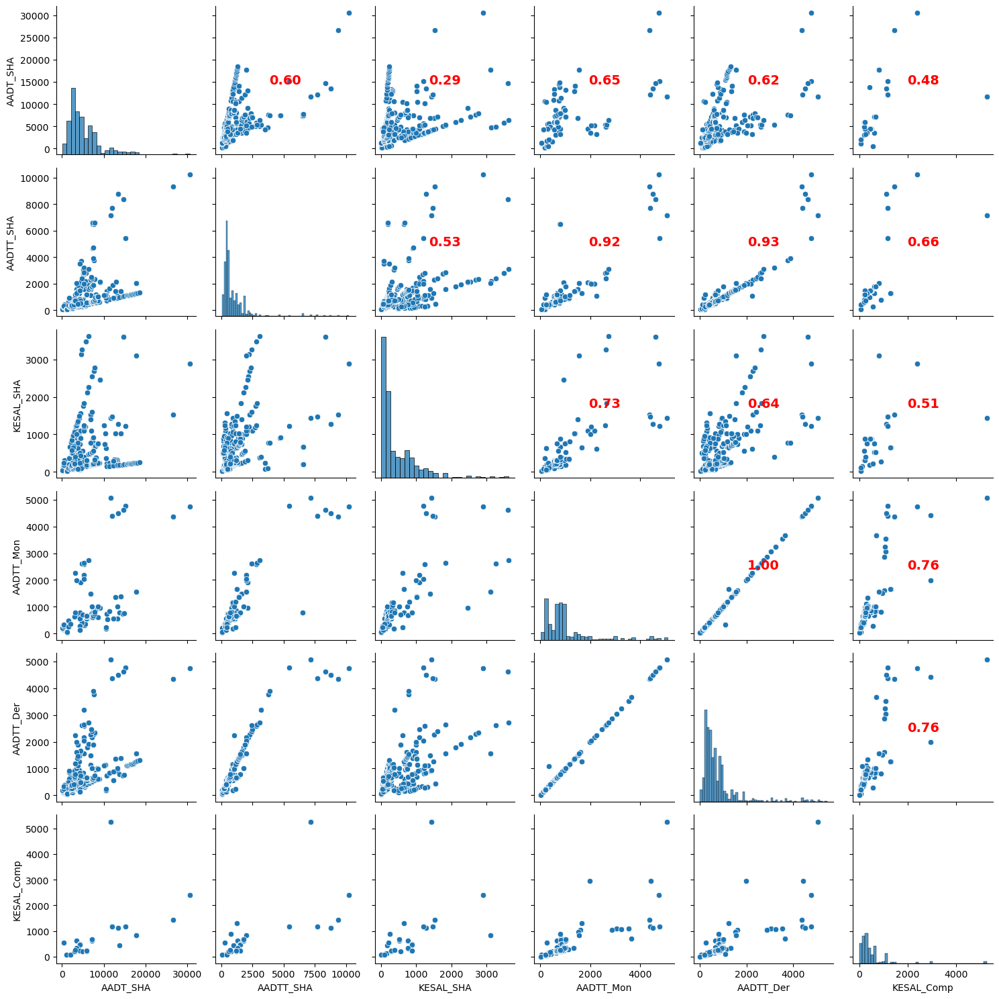

In [74]:
# Selecting numerical columns for correlation analysis
numerical_columns = ['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp']
df_corr = roads_inventory[numerical_columns]

# Calculate the correlation matrix
corr_matrix = df_corr.corr()

# Function to add correlation coefficients
def annotate_corr(x, y, **kwargs):
    ax = plt.gca()
    corr = np.corrcoef(x, y)[0, 1]
    ax.annotate(f'{corr:.2f}', xy=(0.5, 0.5), xycoords=ax.transAxes,
                ha='center', va='center', fontsize=10, color='red')

# Create a pairplot
pairplot = sns.pairplot(df_corr)

# Add correlation coefficients to the upper triangle
for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
    pairplot.axes[i, j].annotate(format(corr_matrix.iloc[i, j], '.2f'),
                                 xy=(0.5, 0.5), xycoords='axes fraction',
                                 ha='center', va='center', color='red', fontsize=14, fontweight='bold')

# Adjust plot to make space for annotations
plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Corr_traffic.png')
plt.show()


AttributeError: module 'seaborn' has no attribute 'corr'

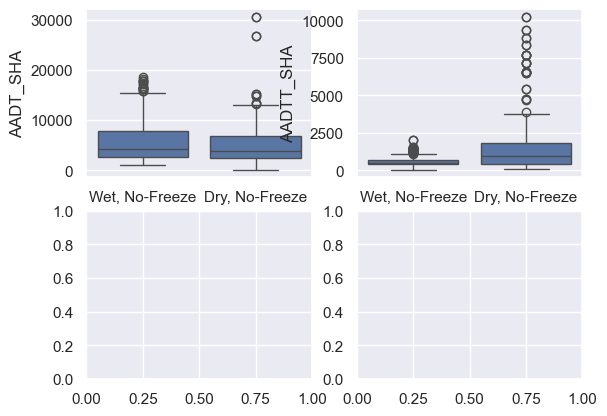

In [314]:
numerical_columns = ['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Clim_zone']
df = roads_inventory[numerical_columns]

#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2)

#create boxplot in each subplot
sns.boxplot(data=df, x='Clim_zone', y='AADT_SHA', ax=axes[0,0])
sns.boxplot(data=df, x='Clim_zone', y='AADTT_SHA', ax=axes[0,1])
#sns.boxplot(data=df, x='Clim_zone', y='KESAL_SHA', ax=axes[1,0])
#sns.boxplot(data=df, x='Clim_zone', y='AADTT_Mon', ax=axes[1,1])
sns.corr(data=df, x='Clim_zone', y='AADT_SHA', ax=axes[1,0])
sns.corr(data=df, x='Clim_zone', y='AADTT_SHA', ax=axes[1,1])

<Axes: xlabel='Clim_zone', ylabel='AADTT_Mon'>

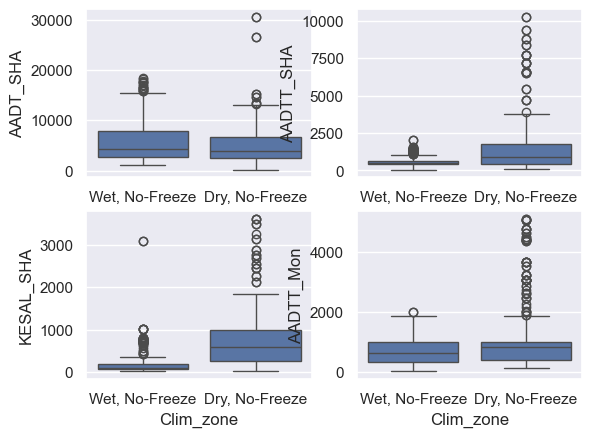

In [312]:
numerical_columns = ['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Clim_zone']
df = roads_inventory[numerical_columns]

#set seaborn plotting aesthetics as default
sns.set()

#define plotting region (2 rows, 2 columns)
fig, axes = plt.subplots(2, 2)

#create boxplot in each subplot
sns.scatter(data=df, x='Clim_zone', y='AADT_SHA', ax=axes[0,0])
sns.scatter(data=df, x='Clim_zone', y='AADTT_SHA', ax=axes[0,1])
sns.scatter(data=df, x='Clim_zone', y='KESAL_SHA', ax=axes[1,0])
sns.scatter(data=df, x='Clim_zone', y='AADTT_Mon', ax=axes[1,1])

### 2.5.2 Climate-related variables

In [ ]:
"""
This will cover both average and extreme weather and climatic conditions.
1. Annual average precipitation (PRP)
2. Annual average temperature (Temp)
3. Average Freezing Indices (FI)
4. Average total annual snowfall (SF)
5. Extreme heat incidents (TX35)
6. Annual extreme heat duration (Tdays)
7. Maximum daily temperature (Tmax)
6. Fluvial, Pluvial and Coastal flooding incidents
7. Flood duration (Flood_days)
8. Flood depth (if made available)
9. Humidity (Maximum and Minimum)
10. Thornthwaite Moisture Index (recalculate this using daily rainfall from ERA5 as there is multicollinearity with the precipitation)
"""

In [121]:
# Selecting numerical columns for multicollinearity assessment
#numerical_columns = ['PRP','Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'flooding', 'flood_duration', 'TX35', 'extreme_heat']
numerical_columns = ['PRP','Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'flooding', 'flood_duration', 'TX35']

# Drop rows with missing values in the selected numerical columns
df_clean2 = roads_inventory.dropna(subset=numerical_columns)

# Adding a constant column for statsmodels
df_clean2['constant'] = 1

# Calculate VIF for each numerical variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numerical_columns
vif_data['VIF'] = [variance_inflation_factor(df_clean2[numerical_columns + ['constant']].values, i)
                   for i in range(len(numerical_columns))]

# Display the VIF values
print(vif_data)

         Variable       VIF
0             PRP  6.229269
1            Temp  2.355502
2    Freeze_Index  2.098758
3         Hum_min  5.041157
4         Hum_max  1.662715
5        flooding  2.615049
6  flood_duration  2.573008
7            TX35  1.185793


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_71824/2376204651.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean2['constant'] = 1


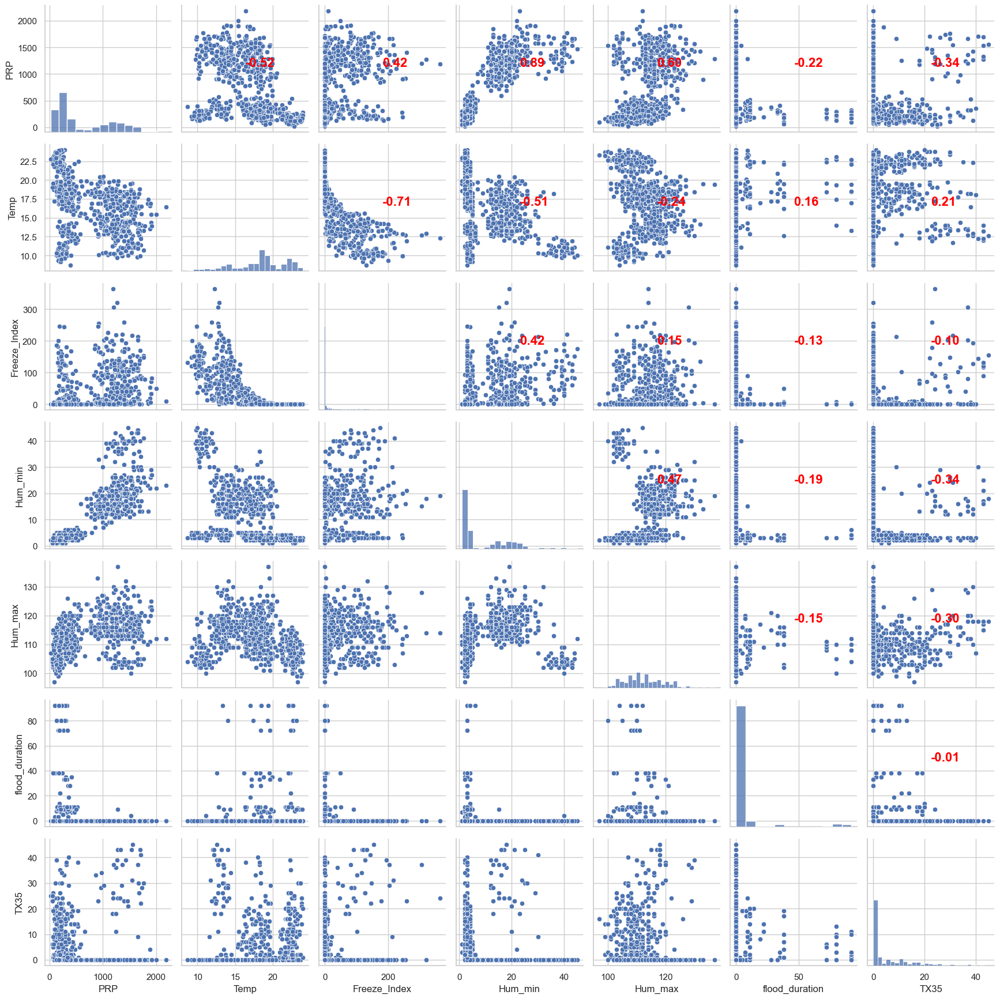

In [127]:
# Calculate the correlation matrix
# Selecting numerical columns for correlation analysis
roads_inventory_clim = roads_inventory.copy()
# Filter out rows where 'flood_duration' and 'TX35' are zero
#roads_inventory_clim = roads_inventory_clim[(roads_inventory_clim['flood_duration'] != 0) & (roads_inventory_clim['TX35'] != 0)]
numerical_columns = ['PRP','Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'flood_duration', 'TX35']

df_clim = roads_inventory_clim[numerical_columns]

# Calculate the correlation matrix
corr_matrix = df_clim.corr()

# Function to add correlation coefficients
def annotate_corr(x, y, **kwargs):
    ax = plt.gca()
    corr = np.corrcoef(x, y)[0, 1]
    ax.annotate(f'{corr:.2f}', xy=(0.5, 0.5), xycoords=ax.transAxes,
                ha='center', va='center', fontsize=10, color='red')

# Create a pairplot
pairplot = sns.pairplot(df_clim)

# Add correlation coefficients to the upper triangle
for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
    pairplot.axes[i, j].annotate(format(corr_matrix.iloc[i, j], '.2f'),
                                 xy=(0.5, 0.5), xycoords='axes fraction',
                                 ha='left', va='bottom', color='red', fontsize=16, fontweight='bold')

# Adjust plot to make space for annotations
plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Corr_climate.png')
plt.show()

### 2.5.3 Pavement conditions

In [ ]:
"""
The pavement properties determine the strength of the pavement to resist the traffic loads and other external factors. For this study, focus
shall be placed on:
1. Asphalt (Wearing course) layer thickness
2. Base layer thickness
3. Subbbase layer thickness
4. Subgrade material resilient modulus
5. Structural number of highway pavement
"""

In [ ]:
# Selecting numerical columns for multicollinearity assessment
#numerical_columns = ['PRP','Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'flooding', 'flood_duration', 'TX35', 'extreme_heat']
numerical_columns = ['WC_thick','Base_thick', 'SubB_thick', 'SG_MRM']

# Drop rows with missing values in the selected numerical columns
df_pav = roads_inventory.dropna(subset=numerical_columns)

# Adding a constant column for statsmodels
df_pav['constant'] = 1

# Calculate VIF for each numerical variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numerical_columns
vif_data['VIF'] = [variance_inflation_factor(df_pav[numerical_columns + ['constant']].values, i)
                   for i in range(len(numerical_columns))]

# Display the VIF values
print(vif_data)

In [ ]:
# Calculate the correlation matrix
# Selecting numerical columns for correlation analysis
roads_inventory_pav = roads_inventory.copy()

numerical_columns = ['WC_thick','Base_thick', 'SubB_thick', 'SG_MRM']

df_pav = roads_inventory_pav[numerical_columns]

# Calculate the correlation matrix
corr_matrix = df_pav.corr()

# Function to add correlation coefficients
def annotate_corr(x, y, **kwargs):
    ax = plt.gca()
    corr = np.corrcoef(x, y)[0, 1]
    ax.annotate(f'{corr:.2f}', xy=(0.5, 0.5), xycoords=ax.transAxes,
                ha='center', va='center', fontsize=10, color='red')

# Create a pairplot
pairplot = sns.pairplot(df_pav)

# Add correlation coefficients to the upper triangle
for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
    pairplot.axes[i, j].annotate(format(corr_matrix.iloc[i, j], '.2f'),
                                 xy=(0.5, 0.5), xycoords='axes fraction',
                                 ha='left', va='bottom', color='red', fontsize=16, fontweight='bold')

# Adjust plot to make space for annotations
plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Corr_Pavement.png')
plt.show()

### 2.5.4 Drainage-related variables

In [ ]:
"""
Drainage performance and properties are one of the most important factors affecting pavement performance. The old-age saying, "A road is 
only as good as it's drainage." Defining and quantifying drainage properties can be rather difficult. The important state of a soil surface
is the water content at the time of loading. If the soil has completely dried prior to loading, the effects on pavement strength are 
much lower than a loading situation when the soil is saturated. For this study, drainage has been defined as:
1. Saturation duration. The time it takes for a flood to drain from a raod surface. Dependent on the flood depth and drainage
    diameter. Units: hrs
2. Drainage factor. Quality of drainage structures (Poor, Fair, Very good, Excellent) . Adopt HDM4 method of calculating this. 
    A drainage factor adopted from Table B2-5 on page B2-6 is adopted. Also look at drainage coefficient (concrete pavements)
    is determined considering the quality of the drainage and the percentage of time that  the pavement is exposed to moisture 
    levels approaching saturation. Look at Volume 6, HDM4, Page A2-10. 
    The Drainage factor changes based on the Drain Life, drain maintenance. Do not have the information on drain maintenance
    and quality from LTTP
    Use flooding to provide an indication of the drain quality.
2. Drain life. Model deterioration of drainage. Drain life = a0(1 + a1 RF) from HDM4- Vol.6, Page B2-7. RF is rise and fall
    in m/km while a0 and a1 are coefficients based on type of drain and climate zone.
2. Actual evapotranspiration (calculates drying rate of pavement layers when wetted)/ Relative wetness of road surface
    - Penman-Monteith Potential evapotranspiration
    - Thornthwaite moisture potential evapotranspiration (annual? monthly?)
3. Road wetness index. Apply Topographic Wetness Index and discount for evaporation.
"""

In [ ]:
def calculate_drain_capacity(row):
    """
    Calculate Drainage capacity. Units: cubic metres/s
    :param drain_diameter: diameter of drainage structure. Unit: mm
    :param roughness: coefficient of roughness dependent on the material of drainage
        structure. Refer to excel sheet with acceptable roughness coefficients.
    :param slope: slope of the pipe.
    :param drain_capacity: the capacity of the drainage structure. Unit: cubic metres/s
    :param drain_time: Time it takes to drain flood water. Unit: hrs
    """
    drain_diameter = row['DRAINPIPE_DIAMETER']
    S = row['slope'] 
    n = row['roughness']

    if drain_diameter = None:
        drain_capacity = None
    else:
        A = math.pi * (drain_diameter*1000/2)**2 
        P = math.pi * drain_diameter*1000 #pipe assumed to be full because of flooding
        R = A/P
        drain_capacity = A * (1/n) * R **(2/3) * S**(1/2)

def calculate_saturation_rate(row):
    """
    Calculate Saturation time as a result of a flood.
    :param flood_depth: depth of flood. Unit: m
    :param drain_diameter: diameter of drainage structure. Unit: mm
    :param flood_area: total area of flooding. Assumed that all flood waters in the
        catchment area should flow through drainage structure. Units: sq.m
    :param drain_time: Time it takes to drain flood water. Unit: hrs
    """

    # Extract the required values from the row
    drain_diameter = row['DRAINPIPE_DIAMETER']
    flood_depth = row['flood_depth'] 
    flood_area = row['flood_area]
    
    # Check if Temperature is zero and handle it
    if flood_depth = None: 
        saturation_time = None
    else:
        # Convert to hours by dividing by 3600
        Sat_time =  ((flood_depth*flood_area)/ (drain_capacity))/3600 
    
    return Sat_time

roads_inventory['drain_time'] = roads_inventory.apply(calculate_saturation_rate, axis=1)

In [211]:
def calculate_PET(row):
    """
    Calculate potential evapotranspiration using annual data. See updated equations 
        from: https://www.mdpi.com/1996-1073/14/20/6760 accessed 31/10/23.
        Different methods to calculate PE are in: https://etcalc.hydrotools.tech/pageMain.php
    :param I: annual heat index, calculated as sum(temperature/5)^1.514
    :param temp: annual average temperature in should be in degrees Celsius
    :param ETR: potential evapotranspiration rate, expressed as a decimal fraction between 0 and 1. ET = PET/P
    :param PRP: annual total precipitation (mm)
    """

    # Extract the required values from the row
    temp = row['Temp']
    Year = row['Year'] 
    
    # Check if Temperature is zero and handle it
    if temp <= 0: #Thornthwaite and Mather, 1957
        PET = 0
    else:
        # Calculate the coefficient 'a' in the PE equation
        I =  (0.2 * temp) ** 1.514
        a = ((6.75e-7 * (I ** 3)) - (7.711e-5 * I ** 2) + (0.01792 * I) + 0.49239) #Should range 0<a<4.25

        # Convert 'Year' and 'Month' columns to integers
        #year = int(Year)

        # Calculate the adjustment factor in the PE  #Refer to: https://www.researchgate.net/publication/308114644_Review_of_calculation_procedures_of_thornthwaite_moisture_index_and_its_impact_on_footing_design
        #N = calendar.monthrange(year, month)[1] #Number of days in calendar month
        #N = 28
        #f1 = d / 12  #Day length correction factor
        #f2 = N / 30.0 #Adjustment factor for number of days per month

        # Calculate PE
        #PET = (f1 * f2 * 1.6 * ((10 * Temperature / I) ** a))
        PET = 16 * ((10 * temp/I)**a)
    
    return PET

roads_inventory['PET'] = roads_inventory.apply(calculate_PET, axis=1) #the unit of PE returned from this equation is mm
roads_inventory['ETR'] = roads_inventory['PET']/roads_inventory['PRP']

In [259]:
# Apply the filter conditions
roads_inventory[(roads_inventory['flooding'] == 0) & (roads_inventory['ETR'] <= 0.5)]

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,TMI,flooding,flood_duration,Flood_BEGAN,Flood_END,TX35,extreme_heat,PET,ETR,flood_area
4,1982,4,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,341.2,21.2,0.0,4.0,...,-61.553179,0.0,0.0,NaN,NaN,0.0,0,124.133353,0.363814,0.0
5,1983,5,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,344.9,21.2,0.0,4.0,...,-61.515802,0.0,0.0,NaN,NaN,0.0,0,124.133353,0.359911,0.0
6,1984,6,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,259.1,21.7,0.0,4.0,...,-62.440513,0.0,0.0,NaN,NaN,0.0,0,125.270478,0.483483,0.0
9,1987,9,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,270.2,21.6,0.0,3.0,...,-62.318809,0.0,0.0,NaN,NaN,0.0,0,125.040055,0.462769,0.0
13,1991,1,"Interstate-10 , Westbound",33.43665 - -112.58182,33.43665,112.58182,297.7,21.3,0.0,4.0,...,-62.005972,0.0,0.0,NaN,NaN,0.0,0,124.357775,0.417729,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1912,2005,15,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,415.4,18.3,0.0,4.0,...,-60.256747,0.0,0.0,NaN,NaN,21.0,1,118.294479,0.284772,0.0
1920,2013,23,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,292.0,18.2,9.0,2.0,...,-61.652495,0.0,0.0,NaN,NaN,16.0,1,118.116895,0.404510,0.0
1923,2016,26,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,296.2,19.4,0.0,4.0,...,-61.766344,0.0,0.0,NaN,NaN,11.0,1,120.354411,0.406328,0.0
1924,2017,27,"U. S.-93 , Northbound",35.7277 - -114.48936,35.72770,114.48936,357.7,19.7,0.0,3.0,...,-61.143795,0.0,0.0,NaN,NaN,29.0,1,120.949519,0.338131,0.0


In [ ]:
import richdem as rd

In [ ]:
"""
Calculate topographic flow index
    :param TWI: Topographic Wetness Index calculated as TWI = ln {a/tan b}. Usually ranging between -3 and 30.
        Incorporate evaporation and evapotranspiration in this equation; TWI = ln {a * (1-PET)/tan b}. 
    :param a: upslope contributing area per unit width of contour. Units: sq.m
    :param b: local slope angle in radians.
    :param ETR: potential evapotranspiration rate, expressed as a decimal fraction between 0 and 1. ET = PET/P
    :param P: annual total precipitation (mm)
"""
# Load your DEM
dem = rd.LoadGDAL("/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/DEM/USGS_13_n25w081_20220406.tif") #get tiff for USA
# Calculate slope in radians
slope = rd.TerrainAttribute(dem, attrib='slope_radians')
# Calculate flow accumulation
acc = rd.FlowAccumulation(dem, method='D8')  # D8 flow method
# Calculate specific catchment area (assume cellsize is in meters)
cellsize = 30  # DEM's cell size
specific_catchment_area = acc * (cellsize ** 2) / cellsize  # Area per unit contour length
# Calculate TWI
twi = np.log((np.maximum(specific_catchment_area, 1) / np.tan(np.maximum(slope, 0.001)))
#twi = np.log((np.maximum(specific_catchment_area, 1)*(1-np.ETR)) / np.tan(np.maximum(slope, 0.001)))
output = '/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/Landslides/Data/Slope&Aspect/TFI061223.tif'

# Save the TWI raster
rd.SaveGDAL(output, twi)

In [222]:
numerical_columns = ['PET', 'ETR', 'TMI']

# Drop rows with missing values in the selected numerical columns
df_clean2 = roads_inventory.dropna(subset=numerical_columns)

# Adding a constant column for statsmodels
df_clean2['constant'] = 1

# Calculate VIF for each numerical variable
vif_data = pd.DataFrame()
vif_data['Variable'] = numerical_columns
vif_data['VIF'] = [variance_inflation_factor(df_clean2[numerical_columns + ['constant']].values, i)
                   for i in range(len(numerical_columns))]

# Display the VIF values
print(vif_data)

  Variable       VIF
0      PET  1.689548
1      ETR  1.802066
2      TMI  2.123602


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_71824/745872577.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_clean2['constant'] = 1


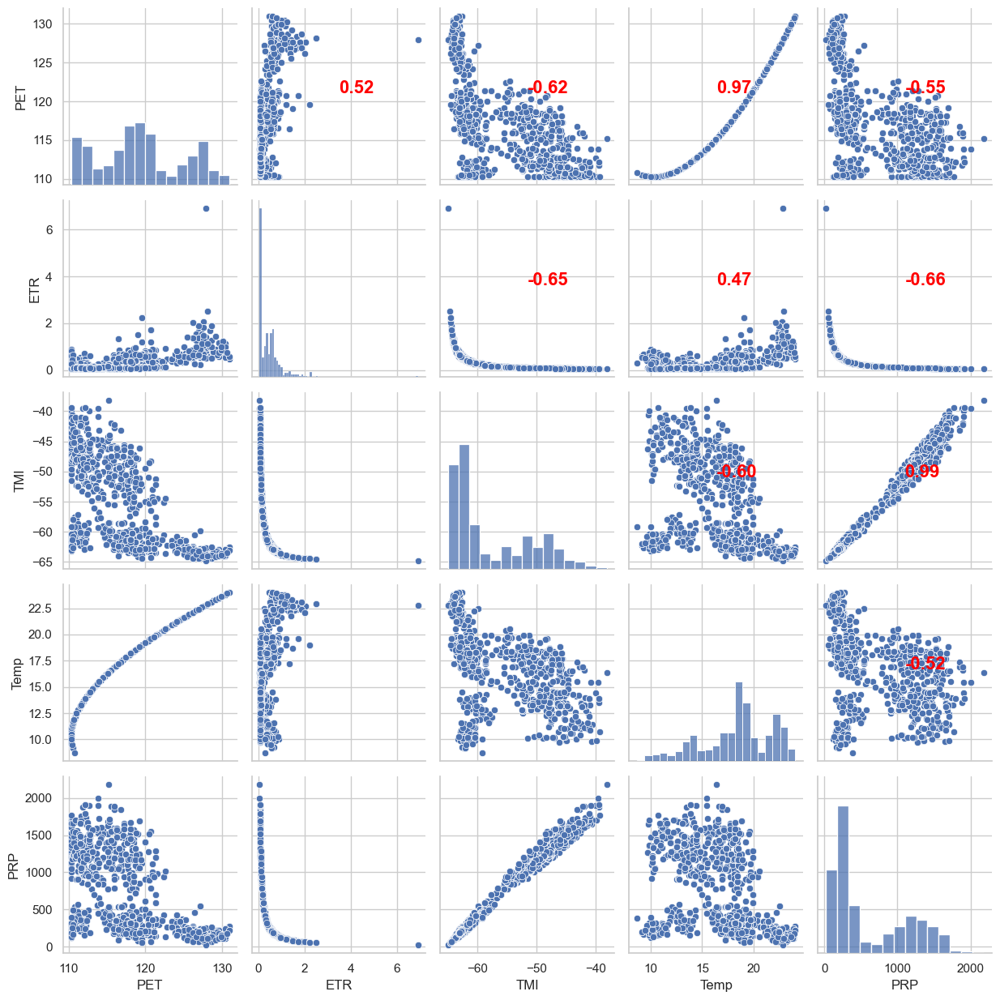

In [225]:
# Calculate the correlation matrix
# Selecting numerical columns for correlation analysis
roads_inventory_drain = roads_inventory.copy()
numerical_columns = ['PET', 'ETR', 'TMI', 'Temp', 'PRP']

df_drain = roads_inventory_drain[numerical_columns]

# Calculate the correlation matrix
corr_matrix = df_drain.corr()

# Function to add correlation coefficients
def annotate_corr(x, y, **kwargs):
    ax = plt.gca()
    corr = np.corrcoef(x, y)[0, 1]
    ax.annotate(f'{corr:.2f}', xy=(0.5, 0.5), xycoords=ax.transAxes,
                ha='center', va='center', fontsize=10, color='red')

# Create a pairplot
pairplot = sns.pairplot(df_drain)

# Add correlation coefficients to the upper triangle
for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
    pairplot.axes[i, j].annotate(format(corr_matrix.iloc[i, j], '.2f'),
                                 xy=(0.5, 0.5), xycoords='axes fraction',
                                 ha='left', va='bottom', color='red', fontsize=16, fontweight='bold')

# Adjust plot to make space for annotations
plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Corr_drainage.png')
plt.show()

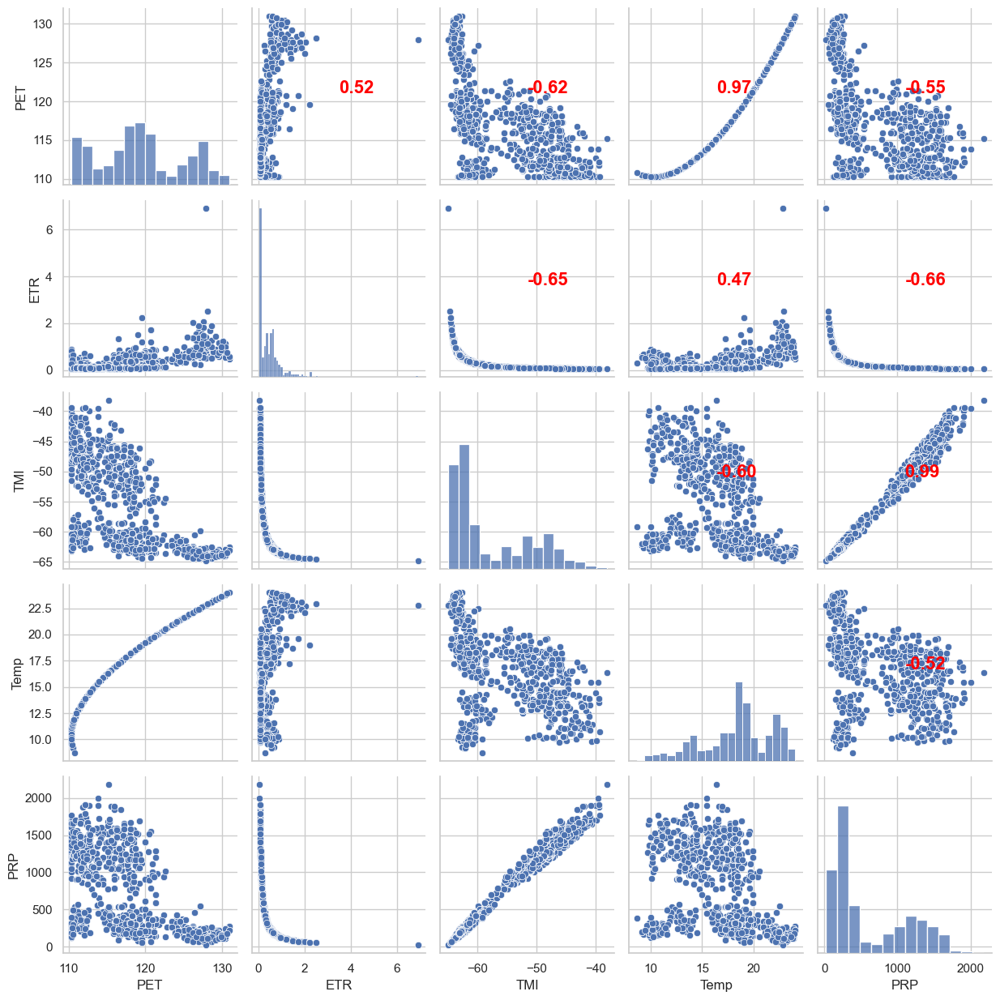

In [225]:
# Calculate the correlation matrix
# Selecting numerical columns for correlation analysis
roads_inventory_drain = roads_inventory.copy()
numerical_columns = ['PET', 'ETR', 'TMI', 'Temp', 'PRP']

df_drain = roads_inventory_drain[numerical_columns]

# Calculate the correlation matrix
corr_matrix = df_drain.corr()

# Function to add correlation coefficients
def annotate_corr(x, y, **kwargs):
    ax = plt.gca()
    corr = np.corrcoef(x, y)[0, 1]
    ax.annotate(f'{corr:.2f}', xy=(0.5, 0.5), xycoords=ax.transAxes,
                ha='center', va='center', fontsize=10, color='red')

# Create a pairplot
pairplot = sns.pairplot(df_drain)

# Add correlation coefficients to the upper triangle
for i, j in zip(*np.triu_indices_from(pairplot.axes, 1)):
    pairplot.axes[i, j].annotate(format(corr_matrix.iloc[i, j], '.2f'),
                                 xy=(0.5, 0.5), xycoords='axes fraction',
                                 ha='left', va='bottom', color='red', fontsize=16, fontweight='bold')

# Adjust plot to make space for annotations
plt.tight_layout()
#plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Corr_drainage.png')
plt.show()

## 2.6 Statistical significance

In [47]:
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import ttest_ind, mannwhitneyu

In [118]:
#Check for statistical signifcance between IRI and flooding

# Assuming 'flooded_segments' contains IRI values for flooded roads and 'non_flooded_segments' contains IRI values for non-flooded roads
flooded_segments = roads_inventory[roads_inventory['flooding'] == 1]
flooded_segments = flooded_segments.dropna(subset=['IRI'])
nonflooded_segments = roads_inventory[roads_inventory['flooding'] == 0]
nonflooded_segments = nonflooded_segments.dropna(subset=['IRI'])

flooded_IRI = flooded_segments['IRI']
non_flooded_IRI = nonflooded_segments['IRI']

# Perform Independent Samples t-test
t_statistic, p_value = ttest_ind(flooded_IRI, non_flooded_IRI)

# Print test results
print("Independent Samples t-test results:")
print("t-statistic:", t_statistic)
print("p-value:", p_value)

"""
The Independent Samples t-test results indicate that the t-statistic is approximately 
2.54 and the p-value is approximately 0.0115.

Interpreting the results:

t-statistic: The t-statistic measures the difference between the means of the two groups 
relative to the variation within the groups. In this case, a positive t-statistic indicates 
that the mean IRI value for flooded roads is higher than the mean IRI value for non-flooded roads.

p-value: The p-value represents the probability of observing the data if the null hypothesis 
(no difference in means between flooded and non-flooded roads) is true. A p-value less than the 
significance level (commonly chosen as 0.05) indicates that the difference in means is 
statistically significant. In this case, the p-value (0.0115) is less than 0.05, suggesting that
there is a statistically significant difference in the mean IRI values between flooded and 
non-flooded roads.
Based on these results, we can reject the null hypothesis and conclude that there is a 
statistically significant difference in the mean IRI values between flooded and non-flooded roads.
"""

Independent Samples t-test results:
t-statistic: 2.5384643798684623
p-value: 0.011520058513911656


'\nThe Independent Samples t-test results indicate that the t-statistic is approximately \n2.54 and the p-value is approximately 0.0115.\n\nInterpreting the results:\n\nt-statistic: The t-statistic measures the difference between the means of the two groups \nrelative to the variation within the groups. In this case, a positive t-statistic indicates \nthat the mean IRI value for flooded roads is higher than the mean IRI value for non-flooded roads.\n\np-value: The p-value represents the probability of observing the data if the null hypothesis \n(no difference in means between flooded and non-flooded roads) is true. A p-value less than the \nsignificance level (commonly chosen as 0.05) indicates that the difference in means is \nstatistically significant. In this case, the p-value (0.0115) is less than 0.05, suggesting that\nthere is a statistically significant difference in the mean IRI values between flooded and \nnon-flooded roads.\nBased on these results, we can reject the null hypo

In [119]:
# Assuming 'flooded_segments' contains IRI values for flooded roads and 'non_flooded_segments' contains IRI values for non-flooded roads
wet_nofreeze = roads_inventory[roads_inventory['Clim_zone'] == 'Wet, No-Freeze']
wet_nofreeze = wet_nofreeze.dropna(subset=['IRI'])
dry_nofreeze = roads_inventory[roads_inventory['Clim_zone'] == 'Dry, No-Freeze']
dry_nofreeze = dry_nofreeze.dropna(subset=['IRI'])

wet_IRI = wet_nofreeze['IRI']
dry_IRI = dry_nofreeze['IRI']

# Perform Independent Samples t-test
t_statistic, p_value = ttest_ind(wet_IRI, dry_IRI)

# Print test results
print("Independent Samples t-test results:")
print("t-statistic:", t_statistic)
print("p-value:", p_value)

Independent Samples t-test results:
t-statistic: -4.886812961508515
p-value: 1.5153800248701772e-06


### International Roughness Index

In [280]:
#Random Forest regression IRI and Defects
inventory_iri = roads_inventory.dropna(subset=['IRI', 'Longitudinal_WP'])

#Fix the error with a particular data point
inventory_iri[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory_iri['Longitudinal_WP'].str.split(',', expand = True)
inventory_iri['Longitudinal_WP'] = inventory_iri['Longitudinal_WP'].astype(float)
inventory_iri['Longitudinal_NWP'] = inventory_iri['Longitudinal_NWP'].astype(float)

# Assuming 'PRP' as predictor and 'IRI' as response
#X = inventory_iri[['AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'Fatigue', 'Longitudinal_WP','Longitudinal_NWP', 'Transverse', 'Rut']]
X = inventory_iri[['AADT_SHA', 'AADTT_Der', 'Fatigue', 'Longitudinal_WP','Longitudinal_NWP', 'Transverse', 'Rut']]
#X = inventory_iri[['Fatigue', 'Longitudinal_WP','Longitudinal_NWP', 'Transverse', 'Rut']]
y = inventory_iri['IRI']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_iri = RandomForestRegressor(n_estimators=100, random_state=0)
model_iri.fit(X_train, y_train)

# Predict
y_pred = model_iri.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.012982268070380831


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/133910368.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory_iri[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory_iri['Longitudinal_WP'].str.split(',', expand = True)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/133910368.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory_iri['Longitudinal_WP'] = inventory_iri['Longitudinal_WP'].astype(float)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykern

            feature  importance
2           Fatigue    0.485481
6               Rut    0.165265
1         AADTT_Der    0.164619
5        Transverse    0.089722
0          AADT_SHA    0.051844
3   Longitudinal_WP    0.043069
4  Longitudinal_NWP    0.000000


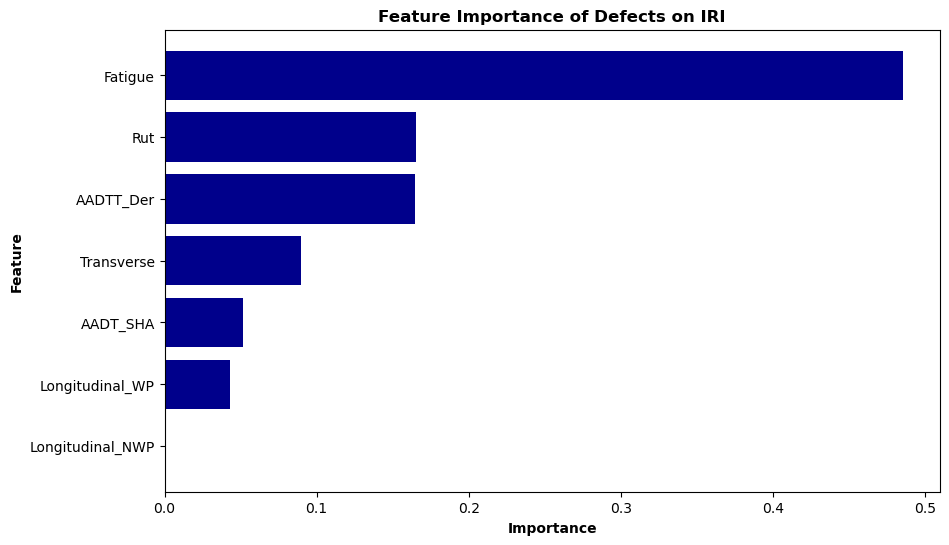

In [281]:
# Get feature importances
importances = model_iri.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print(feature_importances)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='darkblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance of Defects on IRI', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_IRI_Defects')
plt.show()

In [142]:
#Random Forest regression
# Assuming 'PRP' as predictor and 'IRI' as response
X = inventory[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
y = inventory['IRI']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model = RandomForestRegressor(n_estimators=100, random_state=0)
model.fit(X_train, y_train)

# Predict
y_pred = model.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.45032528789797777


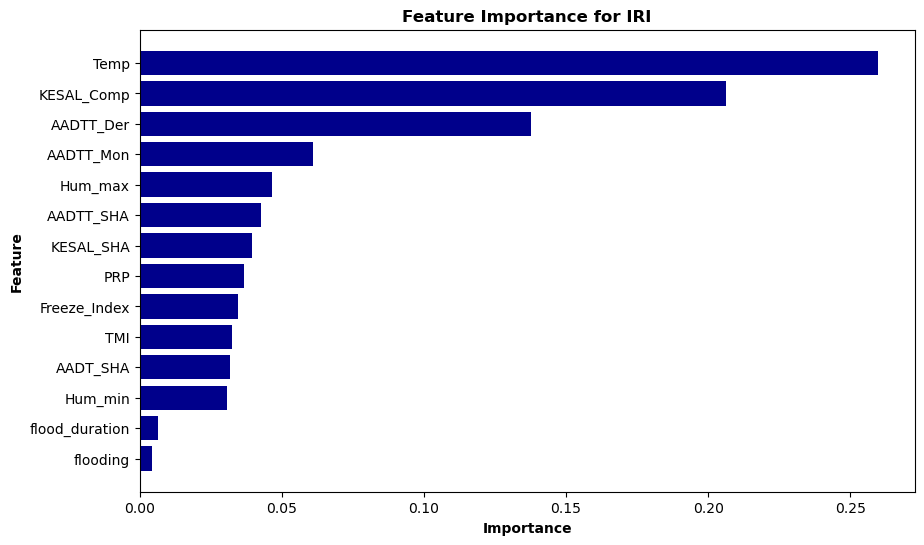

In [143]:

# Get feature importances
importances = model.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='darkblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for IRI', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

#plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_IRI')
plt.show()


### Fatigue cracking descriptive & correlation statistics

In [257]:
#Random Forest regression
inventory_fatigue = roads_inventory.dropna(subset=['Fatigue'])
# Assuming 'PRP' as predictor and 'IRI' as response
X = inventory_fatigue[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
y = inventory_fatigue['Fatigue']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_fat2 = RandomForestRegressor(n_estimators=100, random_state=0)
model_fat2.fit(X_train, y_train)

# Predict
y_pred = model_fat2.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.0002155850113702007


           feature  importance
12      KESAL_Comp    0.201128
2             Temp    0.200756
8        AADTT_SHA    0.085542
10       AADTT_Mon    0.084133
11       AADTT_Der    0.078730
0              PRP    0.072944
1              TMI    0.060977
4          Hum_max    0.055432
9        KESAL_SHA    0.040769
5         AADT_SHA    0.031562
7         AADT_SHA    0.030197
6     Freeze_Index    0.022737
3          Hum_min    0.018489
14  flood_duration    0.010985
13        flooding    0.005619


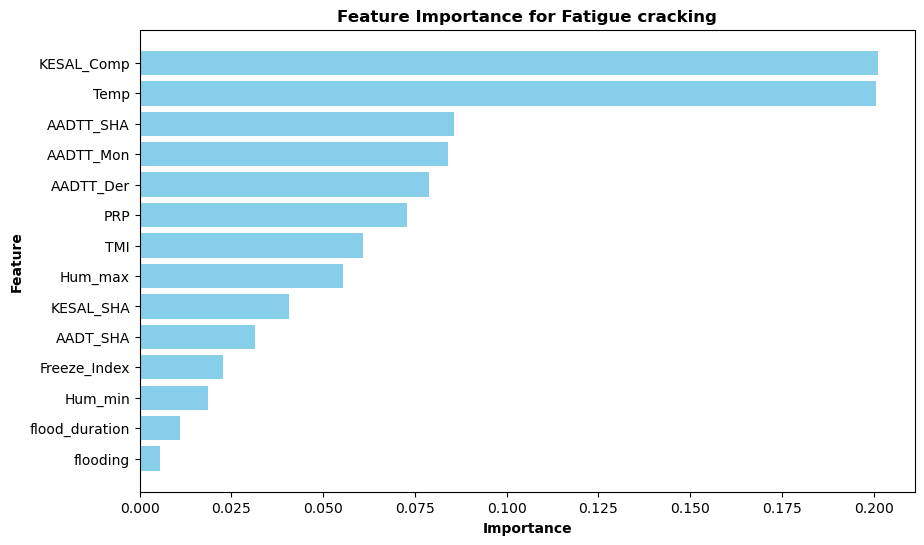

In [258]:
# Get feature importances
importances = model_fat2.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print(feature_importances)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='skyblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for Fatigue cracking', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_Fatigue')
plt.show()


### Rutting descriptive and correlation statistics

In [263]:
#Random Forest regression
# Assuming 'PRP' as predictor and 'IRI' as response
inventory_rut = roads_inventory.dropna(subset=['Rut'])
#X = inventory_rut[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
X = inventory_rut[['PRP', 'TMI', 'Temp', 'Hum_max','Freeze_Index', 'AADT_SHA','KESAL_SHA', 'AADTT_Der', 'flooding', 'flood_duration']]
y = inventory_rut['Rut']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_rut = RandomForestRegressor(n_estimators=100, random_state=0)
model_rut.fit(X_train, y_train)

# Predict
y_pred = model_rut.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.74811994525861


          feature  importance
6       KESAL_SHA    0.292679
7       AADTT_Der    0.209669
2            Temp    0.109818
5        AADT_SHA    0.099942
0             PRP    0.093112
3         Hum_max    0.084703
1             TMI    0.065160
4    Freeze_Index    0.028551
9  flood_duration    0.011919
8        flooding    0.004447


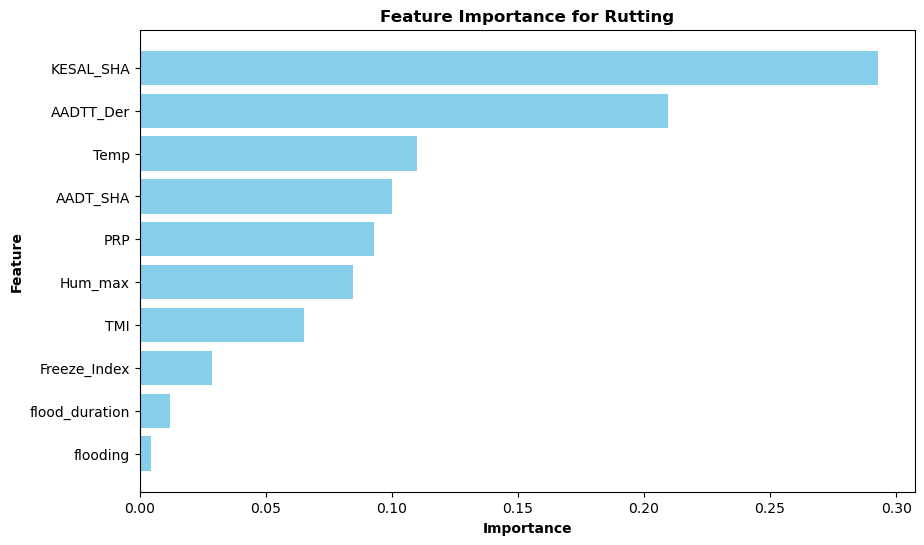

In [264]:
# Get feature importances
importances = model_rut.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print(feature_importances)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='skyblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for Rutting', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_rut')
plt.show()

### Transverse cracking

In [272]:
# Assuming 'PRP' as predictor and 'IRI' as response
inventory_tran = roads_inventory.dropna(subset=['Transverse'])
#X = inventory_tran[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
X = inventory_tran[['PRP', 'TMI', 'Temp', 'Hum_max', 'Freeze_Index', 'AADT_SHA', 'KESAL_SHA','AADTT_Der','flooding', 'flood_duration']]
y = inventory_tran['Transverse']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_tran = RandomForestRegressor(n_estimators=100, random_state=0)
model_tran.fit(X_train, y_train)

# Predict
y_pred = model_tran.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.49858116960244503


          feature  importance
3         Hum_max    0.277982
7       AADTT_Der    0.273521
6       KESAL_SHA    0.194372
2            Temp    0.077878
1             TMI    0.048280
0             PRP    0.048175
5        AADT_SHA    0.041828
4    Freeze_Index    0.031931
9  flood_duration    0.003844
8        flooding    0.002190


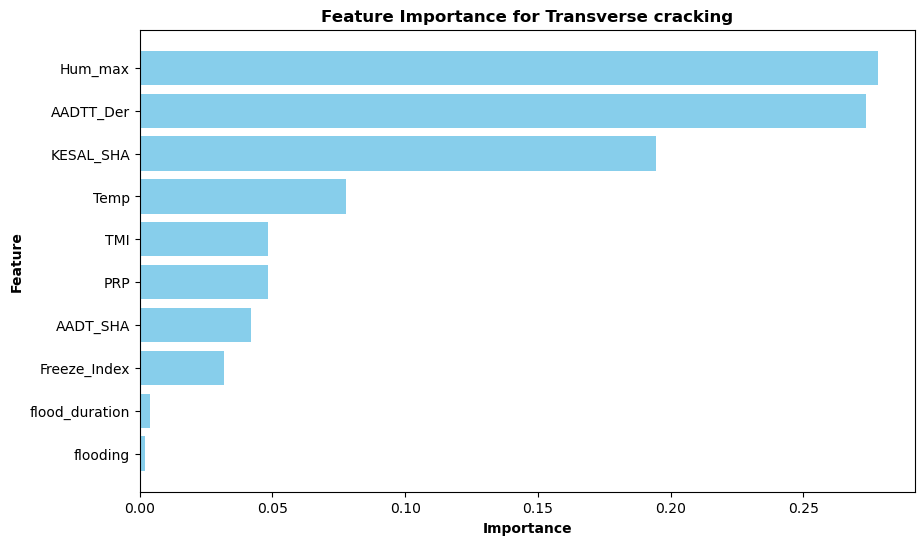

In [273]:
# Get feature importances
importances = model_tran.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print(feature_importances)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='skyblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for Transverse cracking', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_tran')
plt.show()

### Wheelpath Longitudinal cracking 

In [278]:
#Random Forest regression
# Assuming 'PRP' as predictor and 'IRI' as response
inventory_lonWP = roads_inventory.dropna(subset=['Longitudinal_WP'])

#Fix the error with a particular data point
inventory_lonWP[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory_lonWP['Longitudinal_WP'].str.split(',', expand = True)
inventory_lonWP['Longitudinal_WP'] = inventory_lonWP['Longitudinal_WP'].astype(float)
inventory_lonWP['Longitudinal_NWP'] = inventory_lonWP['Longitudinal_NWP'].astype(float)

#X = inventory_lonWP[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
X = inventory_lonWP[['PRP', 'TMI', 'Temp', 'Hum_max', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA','KESAL_Comp', 'flooding', 'flood_duration']]
y = inventory_lonWP['Longitudinal_WP']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_lonWP = RandomForestRegressor(n_estimators=100, random_state=0)
model_lonWP.fit(X_train, y_train)

# Predict
y_pred = model_lonWP.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

R-squared: 0.10387633683078545


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2820828671.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory_lonWP[['Longitudinal_WP', 'Longitudinal_NWP']] = inventory_lonWP['Longitudinal_WP'].str.split(',', expand = True)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2820828671.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inventory_lonWP['Longitudinal_WP'] = inventory_lonWP['Longitudinal_WP'].astype(float)
/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp

          feature  importance
7      KESAL_Comp    0.295678
3         Hum_max    0.200989
6       AADTT_SHA    0.192686
1             TMI    0.132633
0             PRP    0.063902
2            Temp    0.051670
4    Freeze_Index    0.030268
5        AADT_SHA    0.025598
9  flood_duration    0.003572
8        flooding    0.003005


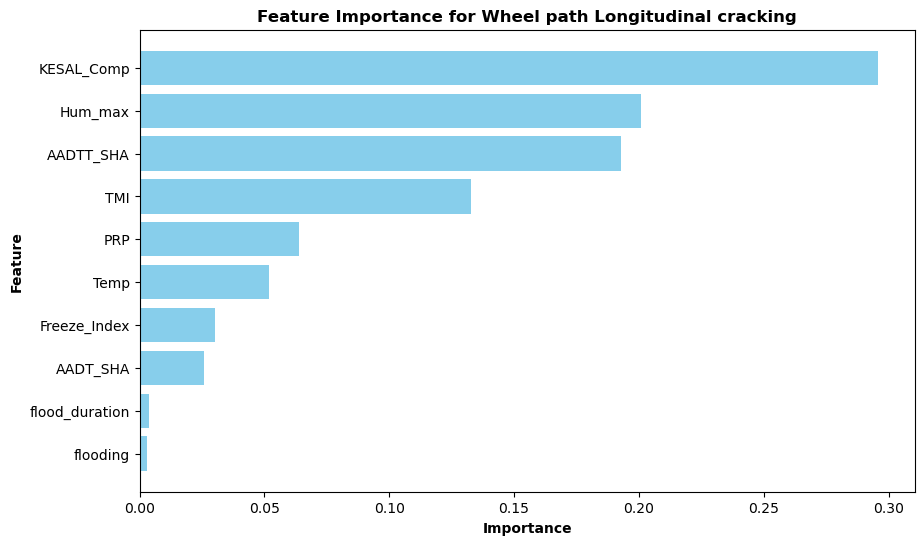

In [279]:
# Get feature importances
importances = model_lonWP.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

print(feature_importances)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='skyblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for Wheel path Longitudinal cracking', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_lonWP')
plt.show()

### Non-wheel path longitudinal cracking

In [ ]:
#Random Forest regression
# Assuming 'PRP' as predictor and 'IRI' as response
inventory_NlonWP = inventory_lonWP.dropna(subset=['Longitudinal_NWP'])
X = inventory_NlonWP[['PRP', 'TMI', 'Temp', 'Hum_min', 'Hum_max', 'AADT_SHA', 'Freeze_Index', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der','KESAL_Comp', 'flooding', 'flood_duration']]
    #'Layer', 'Thickness', 'Material', 'Extreme_heat'
y = inventory_NlonWP['Longitudinal_NWP']

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

# Create the model
model_NonLWP = RandomForestRegressor(n_estimators=100, random_state=0)
model_NonLWP.fit(X_train, y_train)

# Predict
y_pred = model_NonLWP.predict(X_test)

# Evaluate the model
print(f'R-squared: {r2_score(y_test, y_pred)}')

In [ ]:
# Get feature importances
importances = model_NonLWP.feature_importances_

# Convert the importances into a DataFrame for easier handling
feature_importances = pd.DataFrame({'feature': X_train.columns, 'importance': importances})

# Sort the features by importance
feature_importances = feature_importances.sort_values(by='importance', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
plt.barh(feature_importances['feature'], feature_importances['importance'], color='darkblue')
plt.xlabel('Importance', fontweight='bold')
plt.ylabel('Feature', fontweight='bold')
plt.title('Feature Importance for Non-Wheel path Longitudinal cracking', fontweight='bold')
plt.gca().invert_yaxis()  # Invert axis to have the most important at the top

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Importance_lonNWP')
plt.show()

# Graphical plots

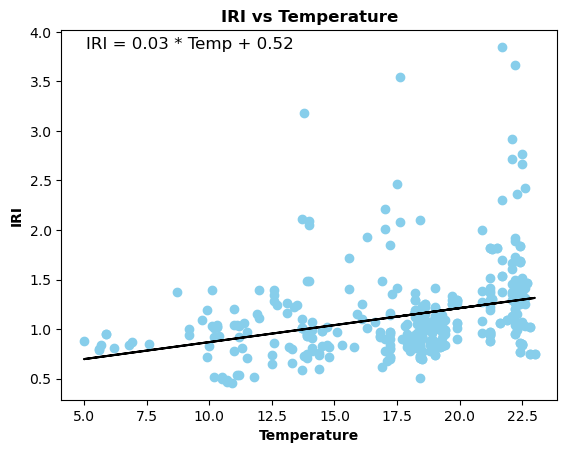

In [238]:
# Read the CSV file into a DataFrame
df = roads_inventory

# Remove rows with missing or invalid values in 'Temp' and 'IRI' columns
df = df.dropna(subset=['Temp', 'IRI'])

# Plot IRI against temperature with a scatter plot
plt.scatter(df['Temp'], df['IRI'], label='Data Points', color='skyblue')

# Fit a line to the data points using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(df['Temp'], df['IRI'])

# Create the line of best fit equation
line_eq = f'IRI = {slope:.2f} * Temp + {intercept:.2f}'

# Plot the line of best fit
plt.plot(df['Temp'], slope * df['Temp'] + intercept, color='black', label='Line of Best Fit')

# Annotate the plot with the line equation
plt.annotate(line_eq, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='black')

# Add labels and title
plt.xlabel('Temperature', fontweight='bold')
plt.ylabel('IRI', fontweight='bold')
plt.title('IRI vs Temperature', fontweight='bold')

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Scatter_IRI_temp')

# Show the plot
plt.show()

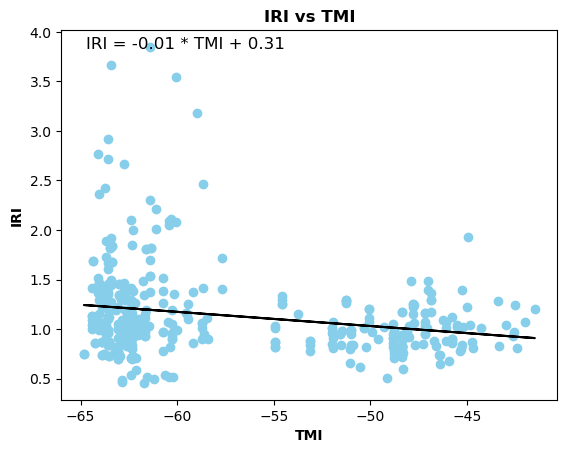

In [237]:

# Remove rows with missing or invalid values in 'Temp' and 'IRI' columns
df2 = df.dropna(subset=['TMI', 'IRI'])

# Plot IRI against temperature with a scatter plot
plt.scatter(df2['TMI'], df2['IRI'], label='Data Points', color='skyblue')

# Fit a line to the data points using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(df2['TMI'], df2['IRI'])

# Create the line of best fit equation
line_eq = f'IRI = {slope:.2f} * TMI + {intercept:.2f}'

# Plot the line of best fit
plt.plot(df2['TMI'], slope * df2['TMI'] + intercept, color='black', label='Line of Best Fit')

# Annotate the plot with the line equation
plt.annotate(line_eq, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='black')

# Add labels and title
plt.xlabel('TMI', fontweight='bold')
plt.ylabel('IRI', fontweight='bold')
plt.title('IRI vs TMI', fontweight='bold')

plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/Scatter_IRI_TMI')

# Show the plot
plt.show()

                            OLS Regression Results                            
Dep. Variable:                    IRI   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                  0.002914
Date:                Tue, 07 May 2024   Prob (F-statistic):              0.957
Time:                        15:27:06   Log-Likelihood:                -132.54
No. Observations:                 165   AIC:                             269.1
Df Residuals:                     163   BIC:                             275.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2058      0.057     21.078      0.0

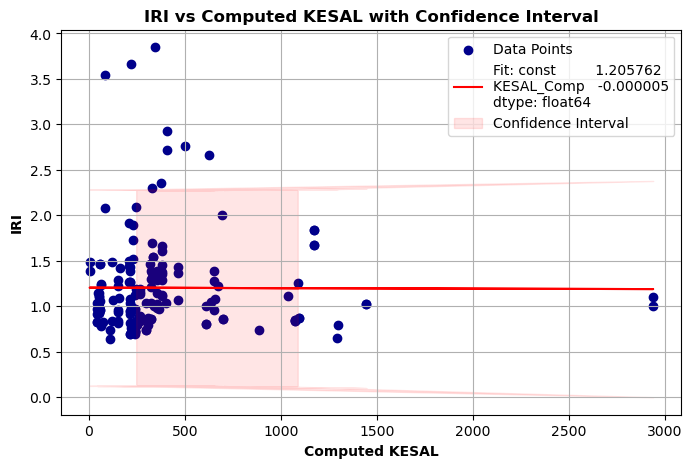

In [174]:
import statsmodels.api as sm
df_kesal = df.dropna(subset=['KESAL_Comp', 'IRI'])
# Assuming df_kesal is your DataFrame
X = sm.add_constant(df_kesal['KESAL_Comp'])  # Adds a constant term to the predictor
y = df_kesal['IRI']

model = sm.OLS(y, X).fit()
print(model.summary())  # Check detailed output

# Plotting
fig, ax = plt.subplots(figsize=(8, 5))
ax.scatter(df_kesal['KESAL_Comp'], y, color='darkblue', label='Data Points')
ax.plot(df_kesal['KESAL_Comp'], model.predict(X), color='red', label='Fit: '+ str(model.params))

# Confidence intervals
from statsmodels.sandbox.regression.predstd import wls_prediction_std
prstd, iv_l, iv_u = wls_prediction_std(model)

ax.fill_between(df_kesal['KESAL_Comp'], iv_l, iv_u, color='red', alpha=0.1, label='Confidence Interval')

ax.set_xlabel('Computed KESAL', fontweight='bold')
ax.set_ylabel('IRI', fontweight='bold')
ax.set_title('IRI vs Computed KESAL with Confidence Interval', fontweight='bold')
ax.legend()
plt.grid(True)
plt.show()



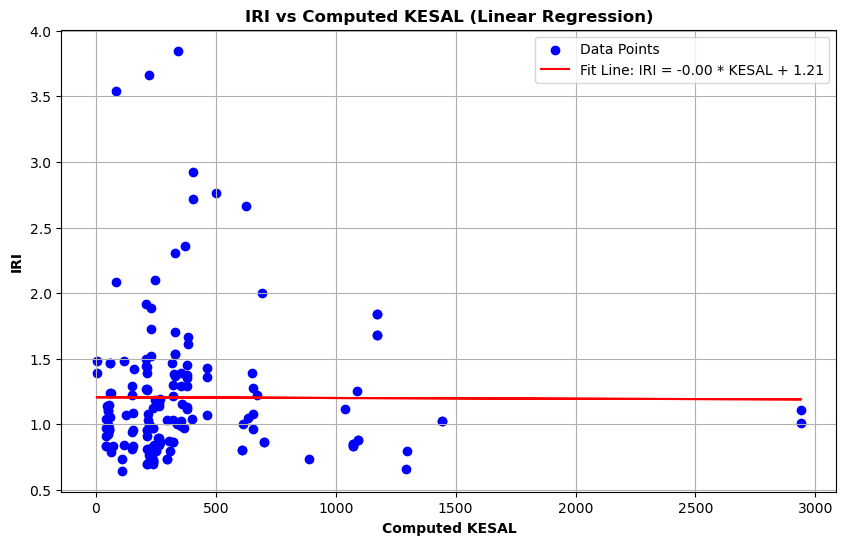

In [175]:

from scipy import stats


# Calculate linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(df_kesal['KESAL_Comp'], df_kesal['IRI'])

# Plotting the data
plt.figure(figsize=(10, 6))
plt.scatter(df_kesal['KESAL_Comp'], df_kesal['IRI'], color='blue', label='Data Points')
plt.plot(df_kesal['KESAL_Comp'], intercept + slope * df_kesal['KESAL_Comp'], color='red', label=f'Fit Line: IRI = {slope:.2f} * KESAL + {intercept:.2f}')

# Adding annotations and labels
plt.xlabel('Computed KESAL', fontweight='bold')
plt.ylabel('IRI', fontweight='bold')
plt.title('IRI vs Computed KESAL (Linear Regression)', fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_43609/2109055653.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_kesal['predicted_IRI'] = model.predict(X)


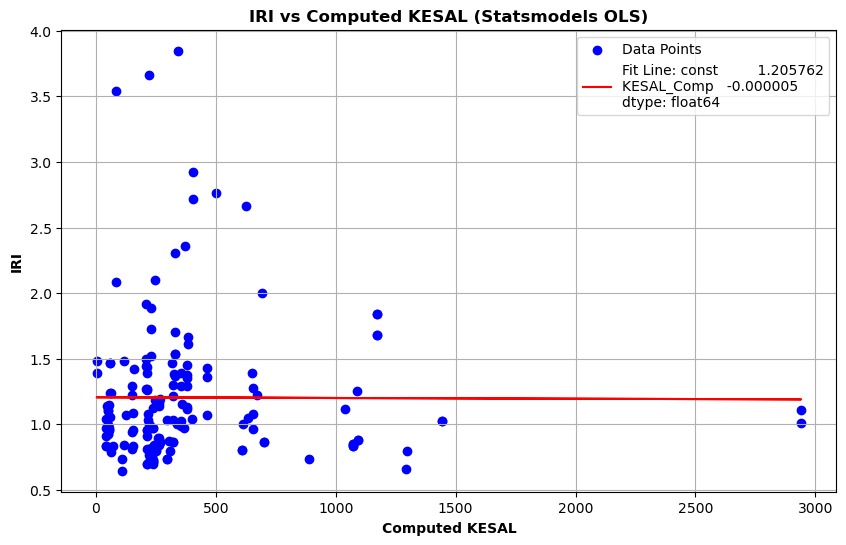

                            OLS Regression Results                            
Dep. Variable:                    IRI   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.006
Method:                 Least Squares   F-statistic:                  0.002914
Date:                Tue, 07 May 2024   Prob (F-statistic):              0.957
Time:                        15:31:27   Log-Likelihood:                -132.54
No. Observations:                 165   AIC:                             269.1
Df Residuals:                     163   BIC:                             275.3
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.2058      0.057     21.078      0.0

In [176]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Adding a constant for the intercept
X = sm.add_constant(df_kesal['KESAL_Comp'])  # Adds a constant term to the predictor
model = sm.OLS(df_kesal['IRI'], X).fit()

# Prediction for plotting
df_kesal['predicted_IRI'] = model.predict(X)

# Plotting the data and the fitted line
plt.figure(figsize=(10, 6))
plt.scatter(df_kesal['KESAL_Comp'], df_kesal['IRI'], color='blue', label='Data Points')
plt.plot(df_kesal['KESAL_Comp'], df_kesal['predicted_IRI'], color='red', label='Fit Line: ' + str(model.params))

# Adding annotations and labels
plt.xlabel('Computed KESAL', fontweight='bold')
plt.ylabel('IRI', fontweight='bold')
plt.title('IRI vs Computed KESAL (Statsmodels OLS)', fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()

# Output the summary of the regression
print(model.summary())


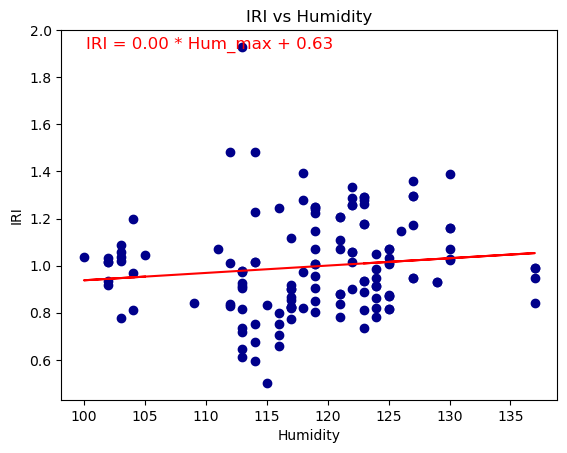

In [166]:
# Read the CSV file into a DataFrame
df = wet_nofreeze
df2 = dry_nofreeze

# Remove rows with missing or invalid values in 'Humidity' and 'IRI' columns
df = df.dropna(subset=['Hum_max', 'IRI'])

# Plot IRI against temperature with a scatter plot
plt.scatter(df['Hum_max'], df['IRI'], label='Data Points', color='darkblue')

# Fit a line to the data points using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(df['Hum_max'], df['IRI'])

# Create the line of best fit equation
line_eq = f'IRI = {slope:.2f} * Hum_max + {intercept:.2f}'

# Plot the line of best fit
plt.plot(df['Hum_max'], slope * df['Hum_max'] + intercept, color='red', label='Line of Best Fit')

# Annotate the plot with the line equation
plt.annotate(line_eq, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='red')

# Add labels and title
plt.xlabel('Maximum Humidity')
plt.ylabel('IRI')
plt.title('IRI vs Maximum Humidity')


# Show the plot
plt.show()

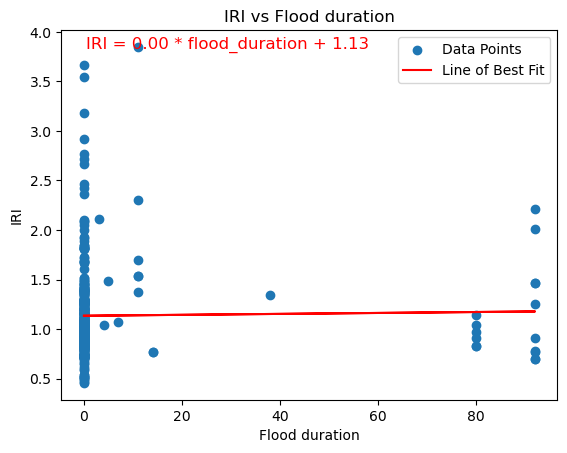

In [123]:
# Read the CSV file into a DataFrame
df = roads_inventory

# Remove rows with missing or invalid values in 'Temp' and 'IRI' columns
df = df.dropna(subset=['flood_duration', 'IRI'])

# Plot IRI against temperature with a scatter plot
plt.scatter(df['flood_duration'], df['IRI'], label='Data Points')

# Fit a line to the data points using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(df['flood_duration'], df['IRI'])

# Create the line of best fit equation
line_eq = f'IRI = {slope:.2f} * flood_duration + {intercept:.2f}'

# Plot the line of best fit
plt.plot(df['flood_duration'], slope * df['flood_duration'] + intercept, color='red', label='Line of Best Fit')

# Annotate the plot with the line equation
plt.annotate(line_eq, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='red')

# Add labels and title
plt.xlabel('Flood duration (days)')
plt.ylabel('IRI (m/km)')
plt.title('IRI vs Flood duration')

# Add legend
#plt.legend()

# Show the plot
plt.show()

In [29]:
# Create a new DataFrame containing only the data for 'wet no freeze' climate zone
wet_nofreeze = df[df['Clim_zone'] == 'Wet, No-Freeze']
dry_nofreeze = df[df['Clim_zone'] == 'Dry, No-Freeze']

,Year,Time,Road_name,GPS,Latitude,Longitude,PRP,Temp,Freeze_Index,Hum_min,...,Rut,Surv_IRI,IRI,Layer_no,Layer,Thickness,Material,Extreme_heat,flooding,TMI
257,1974.0,0.0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,1.0,Subgrade (untreated),NaN,265-Coarse-Grained Soil: Silty Gravel with Sand,0.0,1.0,NaN
258,1975.0,0.0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,Unbound (granular) base,23.4,307-Soil-Aggregate Mixture (Predominantly Fine...,0.0,1.0,NaN
259,1976.0,0.0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,3.0,Asphalt concrete layer,7.7,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,NaN
260,1977.0,0.0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,4.0,Asphalt concrete layer,0.0,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,NaN
261,1978.0,0.0,"Interstate-195 , Eastbound",41.65468 - -70.90181,41.65468,70.90181,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,5.0,Asphalt concrete layer,2.3,"1-Hot Mixed, Hot Laid AC, Dense Graded",0.0,1.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1713,2019.0,0.0,"U. S.-84 , Eastbound",31.24291 - -85.56363,31.24291,85.56363,938.7,20.4,0.0,21,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-55.17858093056685+0j)
1714,2020.0,0.0,"U. S.-84 , Eastbound",31.24291 - -85.56363,31.24291,85.56363,1202.1,19.9,0.0,24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-52.15001603947848+0j)
1715,2021.0,0.0,"U. S.-84 , Eastbound",31.24291 - -85.56363,31.24291,85.56363,1413.5,19.2,0.0,20,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-49.43980821366139+0j)
1716,2022.0,0.0,"U. S.-84 , Eastbound",31.24291 - -85.56363,31.24291,85.56363,938.4,19.8,3.0,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,1.0,(-54.92620841336635+0j)


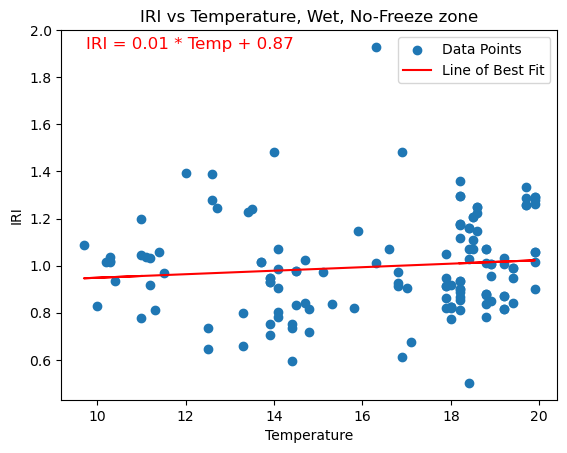

In [36]:
# Remove rows with missing or invalid values in 'Temp' and 'IRI' columns
wet_nofreeze = wet_nofreeze.dropna(subset=['Temp', 'IRI'])

# Plot IRI against temperature with a scatter plot
plt.scatter(wet_nofreeze['Temp'], wet_nofreeze['IRI'], label='Data Points')

# Fit a line to the data points using linear regression
slope, intercept, r_value, p_value, std_err = stats.linregress(wet_nofreeze['Temp'], wet_nofreeze['IRI'])

# Create the line of best fit equation
line_eq = f'IRI = {slope:.2f} * Temp + {intercept:.2f}'

# Plot the line of best fit
plt.plot(wet_nofreeze['Temp'], slope * wet_nofreeze['Temp'] + intercept, color='red', label='Line of Best Fit')

# Annotate the plot with the line equation
plt.annotate(line_eq, xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='red')

# Add labels and title
plt.xlabel('Temperature')
plt.ylabel('IRI')
plt.title('IRI vs Temperature, Wet, No-Freeze zone')

# Add legend
plt.legend()

# Show the plot
plt.show()

# DETERMINISTIC MODELS

In [ ]:
"""
Deterministic modelling shall be used to assess relationships (linear and non-linear) between independent and dependent variables.
Important to note that this assessment is limited to events or conditions presented in observed data. 
LTTP data may not capture cases of rapid deterioration as there are maintenance interventions implemented prior to this occuring.
"""

## Mechanistic-empirical model

## Linear regression model

In [2]:
import statsmodels.api as sm

In [3]:
roads_inventory = pd.read_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_31_05_24_Analyze.csv')

In [6]:
roads_inventory.columns

Index(['Unnamed: 0', 'Year', 'Time', 'Road_name', 'GPS', 'Latitude',
       'Longitude', 'PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max',
       'Road_class', 'Clim_zone', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue',
       'Longitudinal_WP', 'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI',
       'IRI', 'Layer_no', 'Layer', 'Thickness', 'Material', 'TMI', 'flooding',
       'flood_duration', 'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat',
       'PET', 'ETR', 'flood_area', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff',
       'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'Maint_no'],
      dtype='object')

In [4]:
# Dropping unnecessary columns and rows with missing values
df = roads_inventory.drop(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 
       'Road_class', 'Clim_zone','Surv_date', 'Maint', 'Surv_IRI', 'Layer_no', 'Layer', 
       'Thickness', 'Material', 'Flood_BEGAN', 'Flood_END', 'flood_area'
], axis=1)

df2 = df.dropna(subset=['IRI_diff', 'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der','TX35'])

In [381]:
df2

,PRP,Temp,Freeze_Index,Hum_min,Hum_max,AADT_SHA,AADTT_SHA,KESAL_SHA,AADTT_Mon,AADTT_Der,...,TX35,extreme_heat,PET,ETR,IRI_diff,Fatigue_diff,LongWP_diff,LongNWP_diff,transverse_diff,Rut_diff
18,1172.2,18.4,0.0,20.0,116.0,NaN,427.0,53.0,NaN,427.0,...,0.0,0,118.473697,0.101070,0.021000,0.0,0.0,0.0,0.0,1.5
19,1675.7,18.2,1.0,36.0,117.0,NaN,432.0,54.0,241.0,241.0,...,0.0,0,118.116895,0.070488,0.021000,0.0,0.0,0.0,0.0,1.5
20,1235.6,18.6,0.5,26.0,122.0,NaN,453.0,56.0,NaN,453.0,...,0.0,0,118.837009,0.096178,-0.002000,0.0,0.0,0.0,0.0,0.0
21,1393.6,17.9,15.0,31.0,124.0,NaN,467.0,58.0,NaN,467.0,...,0.0,0,117.594013,0.084381,-0.002000,0.0,0.0,0.0,1.0,0.0
22,1169.4,18.5,1.6,19.0,118.0,NaN,481.0,59.0,NaN,481.0,...,0.0,0,118.654543,0.101466,-0.016667,0.0,0.0,0.0,-0.5,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1926,1660.9,10.9,106.0,43.0,103.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0,110.340092,0.066434,0.000000,0.0,0.0,0.0,0.0,0.0
1927,1483.7,11.9,27.0,40.0,104.0,NaN,NaN,NaN,NaN,NaN,...,0.0,0,110.682224,0.074599,0.000000,0.0,0.0,0.0,0.0,0.0
1928,1236.1,11.9,61.0,43.0,102.0,NaN,NaN,NaN,NaN,NaN,...,NaN,0,110.682224,0.089541,0.000000,0.0,0.0,0.0,0.0,0.0
1929,1396.8,12.0,90.0,39.0,104.0,NaN,NaN,NaN,NaN,NaN,...,NaN,0,110.732031,0.079276,0.000000,0.0,0.0,0.0,0.0,0.0


In [390]:
nan_counts = df2.isna().sum()
#nan_counts

# Check for NaNs and Infs
nan_counts = df.isna().sum()
inf_counts = np.isinf(df).sum()

# Combine both counts
combined_counts = nan_counts + inf_counts

# Print columns with NaNs or Infs
columns_with_nan_or_inf = combined_counts[combined_counts > 0]
#columns_with_nan_or_inf
inf_counts


PRP                   0
Temp                  0
Freeze_Index          0
Hum_min               0
Hum_max               0
AADT_SHA              0
AADTT_SHA             0
KESAL_SHA             0
AADTT_Mon             0
AADTT_Der             0
KESAL_Comp            0
Fatigue               0
Longitudinal_WP       0
Longitudinal_NWP      0
Transverse            0
Rut                   0
IRI                   0
TMI                   0
flooding              0
flood_duration        0
TX35                  0
extreme_heat          0
PET                   0
ETR                   0
IRI_diff            182
Fatigue_diff        143
LongWP_diff         161
LongNWP_diff        160
transverse_diff     174
Rut_diff            199
dtype: int64

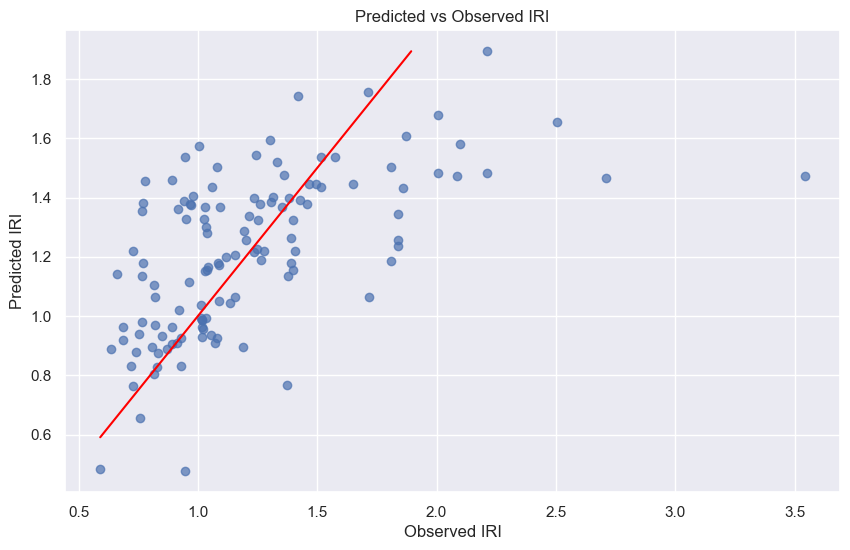

                            OLS Regression Results                            
Dep. Variable:                    IRI   R-squared:                       0.339
Model:                            OLS   Adj. R-squared:                  0.203
Method:                 Least Squares   F-statistic:                     2.493
Date:                Fri, 31 May 2024   Prob (F-statistic):            0.00128
Time:                        21:37:37   Log-Likelihood:                -53.393
No. Observations:                 124   AIC:                             150.8
Df Residuals:                     102   BIC:                             212.8
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              18.4813     14.020     

In [392]:
#predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 
              #'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 
              #'Transverse', 'Rut', 'IRI', 'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 
              #'PET', 'ETR', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 
              #'Rut_diff']

predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der', 
              'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 'PET', 'ETR', 'IRI_diff', 
              'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff']

# Drop rows with NaN or inf values in the predictors
df2_clean = df2[predictors + ['IRI']].replace([np.inf, -np.inf], np.nan).dropna()

# Adding a constant for the intercept
X = sm.add_constant(df2_clean[predictors])

# Define the response variable
y = df2_clean['IRI']

# Fit the OLS model
model = sm.OLS(y, X).fit()

# Prediction for plotting
df2_clean['predicted_IRI'] = model.predict(X)

# Plot predicted vs observed values
plt.figure(figsize=(10, 6))
plt.scatter(df2_clean['IRI'], df2_clean['predicted_IRI'], alpha=0.7)
plt.plot([df2_clean['IRI'].min(), df2_clean['predicted_IRI'].max()],
         [df2_clean['IRI'].min(), df2_clean['predicted_IRI'].max()],
         color='red', linestyle='-')
plt.xlabel('Observed IRI')
plt.ylabel('Predicted IRI')
plt.title('Predicted vs Observed IRI')
plt.grid(True)
plt.show()

# Display the summary of the model
print(model.summary())


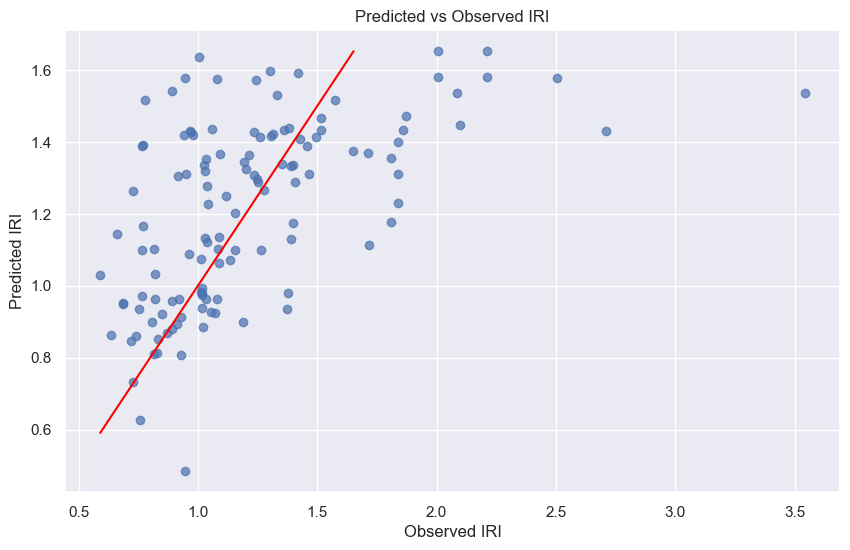

                            OLS Regression Results                            
Dep. Variable:                    IRI   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.171
Method:                 Least Squares   F-statistic:                     2.270
Date:                Fri, 31 May 2024   Prob (F-statistic):            0.00402
Time:                        21:49:30   Log-Likelihood:                -56.435
No. Observations:                 124   AIC:                             154.9
Df Residuals:                     103   BIC:                             214.1
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                      coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------
const              18.5380     14.298     

In [395]:
#predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 
              #'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 
              #'Transverse', 'Rut', 'IRI', 'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 
              #'PET', 'ETR', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 
              #'Rut_diff']

predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der', 
              'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 'PET', 'ETR', 
              'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff']

# Drop rows with NaN or inf values in the predictors
df2_clean = df2[predictors + ['IRI']].replace([np.inf, -np.inf], np.nan).dropna()

# Adding a constant for the intercept
X = sm.add_constant(df2_clean[predictors])

# Define the response variable
y = df2_clean['IRI']

# Fit the OLS model
model = sm.OLS(y, X).fit()

# Prediction for plotting
df2_clean['predicted_IRI'] = model.predict(X)

# Plot predicted vs observed values
plt.figure(figsize=(10, 6))
plt.scatter(df2_clean['IRI'], df2_clean['predicted_IRI'], alpha=0.7)
plt.plot([df2_clean['IRI'].min(), df2_clean['predicted_IRI'].max()],
         [df2_clean['IRI'].min(), df2_clean['predicted_IRI'].max()],
         color='red', linestyle='-')
plt.xlabel('Observed IRI')
plt.ylabel('Predicted IRI')
plt.title('Predicted vs Observed IRI')
plt.grid(True)
plt.show()

# Display the summary of the model
print(model.summary())


###  Regularize regression

#### Ridge regression

In [5]:
import statsmodels.api as sm
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.datasets import make_regression
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler

In [397]:
df2_clean.columns

Index(['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA',
       'KESAL_SHA', 'AADTT_Der', 'TMI', 'flooding', 'flood_duration', 'TX35',
       'extreme_heat', 'PET', 'ETR', 'Fatigue_diff', 'LongWP_diff',
       'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'IRI', 'predicted_IRI'],
      dtype='object')

In [398]:
#df = roads_inventory.drop(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 
      # 'Road_class', 'Clim_zone','Surv_date', 'Maint', 'Surv_IRI', 'Layer_no', 'Layer', 
      # 'Thickness', 'Material', 'Flood_BEGAN', 'Flood_END', 'flood_area', 'Maint_no', 
       #'IRI_diff', 'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 
      # 'Rut_diff'
#], axis=1).dropna()

drop = ['IRI', 'predicted_IRI']
X = df2_clean.drop(drop, axis=1) 
y = df2_clean['IRI']
scaler = StandardScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42) 
X_train = scaler.fit_transform(X_train) 
X_test = scaler.transform(X_test)

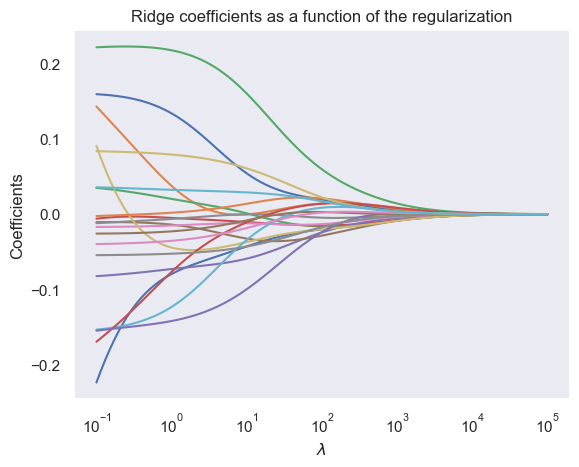

In [399]:
n_alphas = 100
alphas = np.logspace(-1, 5, n_alphas)

coefs = []
for a in alphas:
    ridge = linear_model.Ridge(alpha=a)
    results = ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)

ax = plt.gca()

ax.plot(alphas, coefs)
plt.xlabel("$\lambda$")
ax.set_xscale("log")
plt.ylabel("Coefficients")
plt.title("Ridge coefficients as a function of the regularization")
plt.axis("tight")
plt.grid()
plt.show()

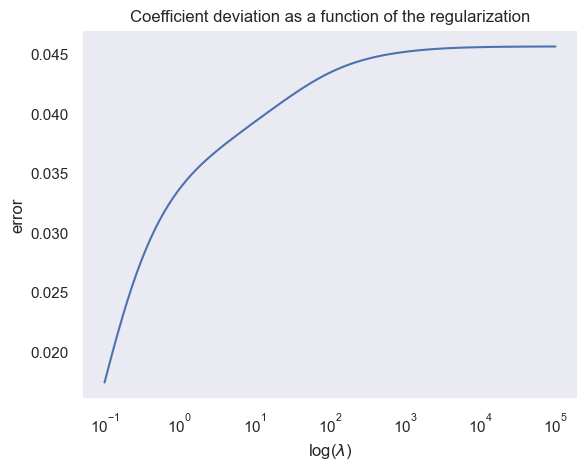

In [400]:
reg_coeff = linear_model.LinearRegression().fit(X_train, y_train)

errors = []
for a in alphas:
    ridge = linear_model.Ridge(alpha=a)
    results = ridge.fit(X_train, y_train)
    errors.append(mean_squared_error(ridge.coef_, reg_coeff.coef_))

ax = plt.gca()
ax.plot(alphas, errors)
ax.set_xscale("log")
plt.xlabel("log($\lambda$)")
plt.ylabel("error")
plt.title("Coefficient deviation as a function of the regularization")
plt.axis("tight")
plt.grid()
plt.show()

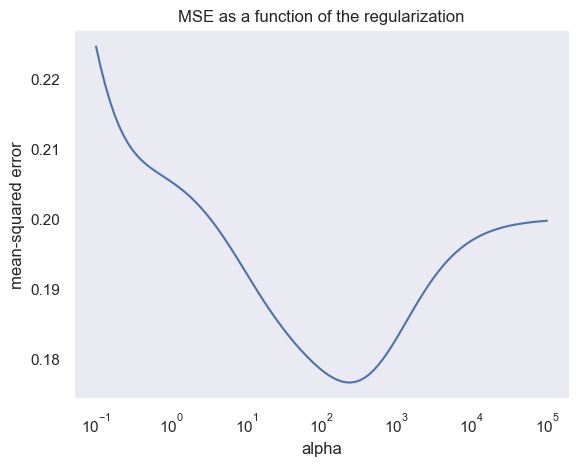

In [401]:
reg = linear_model.RidgeCV(alphas=alphas, store_cv_values=True)
reg = reg.fit(X_train, y_train)

ax = plt.gca()
ax.plot(alphas, np.mean(reg.cv_values_, axis=0))
ax.set_xscale("log")
plt.xlabel("alpha")
plt.ylabel("mean-squared error")
plt.title("MSE as a function of the regularization")
plt.axis("tight")
plt.grid()
plt.show()

In [402]:
print("Best score:", reg.best_score_)
print("Estimated regularization parameter alpha:", reg.alpha_)
print("Training score:", reg.score(X_train, y_train))
print("Test score:", reg.score(X_test, y_test))

Best score: -0.1766191069711265
Estimated regularization parameter alpha: 247.70763559917114
Training score: 0.19647472389990994
Test score: 0.10497799265399277


In [7]:
from sklearn.linear_model import Ridge
from sklearn.preprocessing import PolynomialFeatures

In [11]:
df.columns

Index(['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA',
       'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp',
       'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 'Transverse', 'Rut',
       'IRI', 'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat',
       'PET', 'ETR'],
      dtype='object')

/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:243: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:241: LinAlgWarning: Ill-conditioned matrix (rcond=5.41329e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


                   rss intercept  coef_x_1  coef_x_2  coef_x_3  coef_x_4  \
alpha_1e-15   1.086477  1.403963 -0.004867  0.002574 -0.013884  0.005574   
alpha_1e-10   1.086599  1.404379 -0.004892  0.002573 -0.013922  0.005573   
alpha_1e-08   1.086474  1.403956 -0.004869  0.002573 -0.013884  0.005574   
alpha_0.0001  1.086474  1.403952  -0.00487  0.002574 -0.013884  0.005573   
alpha_0.001   1.086474  1.403931 -0.004877  0.002576 -0.013883   0.00557   
alpha_0.01    1.086491  1.403692 -0.004946  0.002602 -0.013875  0.005533   
alpha_1        1.17507  1.355791 -0.008853  0.003071 -0.012152  0.002417   
alpha_5        1.69358  1.300385 -0.011359  0.002878 -0.010049 -0.001676   
alpha_10      2.130073  1.289805 -0.010783  0.002741 -0.009325 -0.003006   
alpha_20       2.69724  1.286506 -0.009411  0.002732 -0.008592 -0.003834   

              coef_x_5  coef_x_6  coef_x_7  coef_x_8  ... coef_x_1761  \
alpha_1e-15  -0.012509 -0.018801 -0.012584  0.040549  ...    0.011346   
alpha_1e-10  -0.0

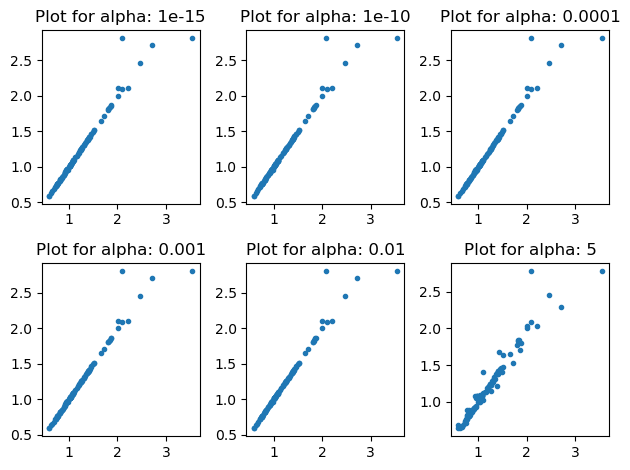

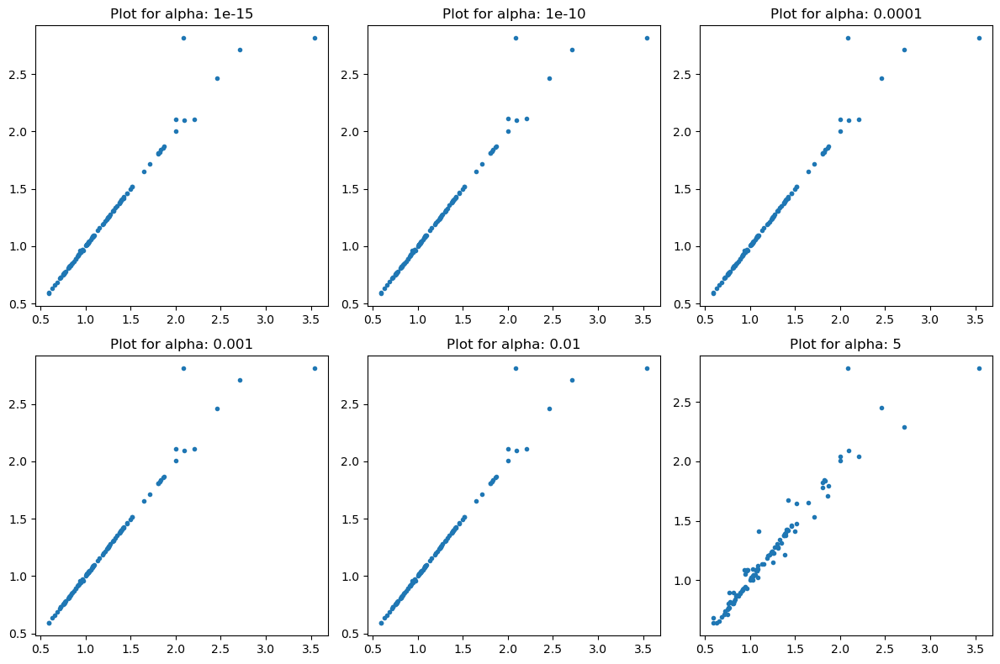

In [12]:
# Define predictors and drop rows with NaN or inf values
predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der', 
              'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 'PET', 'ETR', 
              'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff']

df3 = df[predictors + ['IRI']].replace([np.inf, -np.inf], np.nan).dropna()

def ridge_regression(X, y, alpha, models_to_plot={}):
    # Fit the model
    ridgereg = Ridge(alpha=alpha)
    ridgereg.fit(X, y)
    y_pred = ridgereg.predict(X)
    
    # Check if a plot is to be made for the entered alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.tight_layout()
        plt.plot(y, y_pred, '.')
        plt.title('Plot for alpha: %.3g' % alpha)
    
    # Return the result in pre-defined format
    rss = sum((y_pred - y) ** 2)
    ret = [rss]
    ret.extend([ridgereg.intercept_])
    ret.extend(ridgereg.coef_)
    return ret

# Prepare data
drop = ['IRI']
X = df3.drop(drop, axis=1)
y = df3['IRI']
scaler = StandardScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Add polynomial features up to degree 3 (start with lower degree)
poly = PolynomialFeatures(degree=3, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Set the different values of alpha to be tested
alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]

# Initialize the dataframe for storing coefficients.
col = ['rss', 'intercept'] + ['coef_x_%d' % i for i in range(1, X_train_poly.shape[1] + 1)]
ind = ['alpha_%.2g' % alpha_ridge[i] for i in range(len(alpha_ridge))]
coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

# Dictionary to determine the plots to be made
models_to_plot = {1e-15: 231, 1e-10: 232, 1e-4: 233, 1e-3: 234, 1e-2: 235, 5: 236}

# Perform ridge regression for each alpha
for i in range(len(alpha_ridge)):
    coef_matrix_ridge.iloc[i, :] = ridge_regression(X_train_poly, y_train, alpha_ridge[i], models_to_plot)

# Display the dataframe of coefficients
print(coef_matrix_ridge)

# Plot the results
plt.figure(figsize=(12, 8))
for alpha in models_to_plot:
    plt.subplot(models_to_plot[alpha])
    plt.plot(y_train, coef_matrix_ridge.loc['alpha_%.2g' % alpha, 'intercept'] + np.dot(X_train_poly, coef_matrix_ridge.loc['alpha_%.2g' % alpha, 'coef_x_1':].values), '.')
    plt.title(f'Plot for alpha: {alpha:.2g}')
plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/RidgeRegression.png')
plt.show()


/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:243: UserWarning: Singular matrix in solving dual problem. Using least-squares solution instead.
  warnings.warn(
/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/sklearn/linear_model/_ridge.py:241: LinAlgWarning: Ill-conditioned matrix (rcond=5.41329e-17): result may not be accurate.
  dual_coef = linalg.solve(K, y, assume_a="pos", overwrite_a=False)


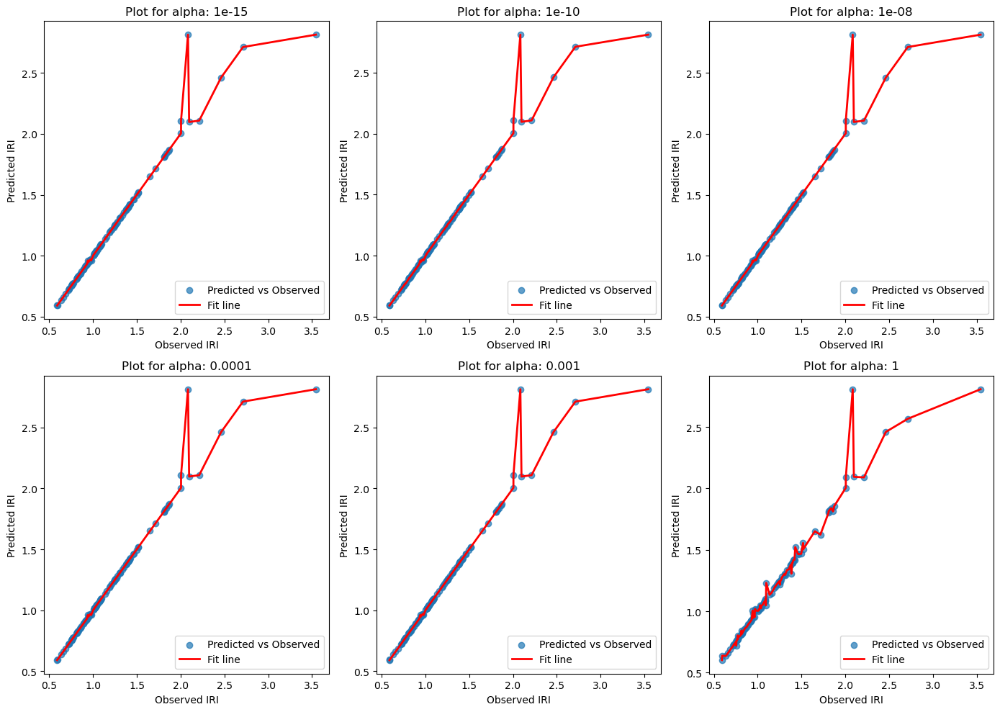

                   rss intercept  coef_x_1  coef_x_2  coef_x_3  coef_x_4  \
alpha_1e-15   1.086477  1.403963 -0.004867  0.002574 -0.013884  0.005574   
alpha_1e-10   1.086599  1.404379 -0.004892  0.002573 -0.013922  0.005573   
alpha_1e-08   1.086474  1.403956 -0.004869  0.002573 -0.013884  0.005574   
alpha_0.0001  1.086474  1.403952  -0.00487  0.002574 -0.013884  0.005573   
alpha_0.001   1.086474  1.403931 -0.004877  0.002576 -0.013883   0.00557   
alpha_0.01    1.086491  1.403692 -0.004946  0.002602 -0.013875  0.005533   
alpha_1        1.17507  1.355791 -0.008853  0.003071 -0.012152  0.002417   
alpha_5        1.69358  1.300385 -0.011359  0.002878 -0.010049 -0.001676   
alpha_10      2.130073  1.289805 -0.010783  0.002741 -0.009325 -0.003006   
alpha_20       2.69724  1.286506 -0.009411  0.002732 -0.008592 -0.003834   

              coef_x_5  coef_x_6  coef_x_7  coef_x_8  ... coef_x_1761  \
alpha_1e-15  -0.012509 -0.018801 -0.012584  0.040549  ...    0.011346   
alpha_1e-10  -0.0

In [17]:
# Define predictors and drop rows with NaN or inf values
predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der', 
              'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 'PET', 'ETR', 
              'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff']

df3 = df[predictors + ['IRI']].replace([np.inf, -np.inf], np.nan).dropna()

def ridge_regression(X, y, alpha, models_to_plot={}):
    # Fit the model
    ridgereg = Ridge(alpha=alpha)
    ridgereg.fit(X, y)
    y_pred = ridgereg.predict(X)
    
    # Return the predicted values and the model
    return y_pred, ridgereg

# Prepare data
drop = ['IRI']
X = df3.drop(drop, axis=1)
y = df3['IRI']
scaler = StandardScaler()
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Add polynomial features up to degree 3 (start with lower degree)
poly = PolynomialFeatures(degree=3, include_bias=False)
X_train_poly = poly.fit_transform(X_train)
X_test_poly = poly.transform(X_test)

# Set the different values of alpha to be tested
alpha_ridge = [1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20]

# Initialize the dataframe for storing coefficients.
col = ['rss', 'intercept'] + ['coef_x_%d' % i for i in range(1, X_train_poly.shape[1] + 1)]
ind = ['alpha_%.2g' % alpha_ridge[i] for i in range(len(alpha_ridge))]
coef_matrix_ridge = pd.DataFrame(index=ind, columns=col)

# Dictionary to determine the plots to be made
models_to_plot = {1e-15: 231, 1e-10: 232, 1e-8: 233, 1e-4: 234, 1e-3: 235, 1: 236}

# Plot the results
plt.figure(figsize=(14, 10))
for i, alpha in enumerate(alpha_ridge):
    y_pred, model = ridge_regression(X_train_poly, y_train, alpha)
    rss = sum((y_pred - y_train) ** 2)
    coef_matrix_ridge.iloc[i, 0] = rss
    coef_matrix_ridge.iloc[i, 1] = model.intercept_
    coef_matrix_ridge.iloc[i, 2:] = model.coef_

    # Subplot for each alpha
    if alpha in models_to_plot:
        plt.subplot(models_to_plot[alpha])
        plt.tight_layout()
        
        # Scatter plot of observed vs predicted IRI
        plt.scatter(y_train, y_pred, alpha=0.7, label='Predicted vs Observed')
        
        # Polynomial regression line
        sorted_idx = np.argsort(y_train)
        y_train_sorted = y_train.iloc[sorted_idx]
        y_pred_sorted = y_pred[sorted_idx]
        plt.plot(y_train_sorted, y_pred_sorted, color='red', linewidth=2, label='Fit line')
        
        plt.xlabel('Observed IRI')
        plt.ylabel('Predicted IRI')
        plt.title(f'Plot for alpha: {alpha:.2g}')
        plt.legend()

plt.tight_layout()
plt.show()

# Display the dataframe of coefficients
print(coef_matrix_ridge)


In [ ]:
#Initialize a dataframe to store the results:
col = ['rss','intercept'] + ['coef_x_%d'%i for i in range(1,16)]
ind = ['model_pow_%d'%i for i in range(1,16)]
coef_matrix_simple = pd.DataFrame(index=ind, columns=col)

#Define the powers for which a plot is required:
models_to_plot = {1:231,3:232,6:233,9:234,12:235,15:236}

#Iterate through all powers and assimilate results
for i in range(1,16):
    coef_matrix_simple.iloc[i-1,0:i+2] = linear_regression(data, power=i, models_to_plot=models_to_plot)


## Lasso regression

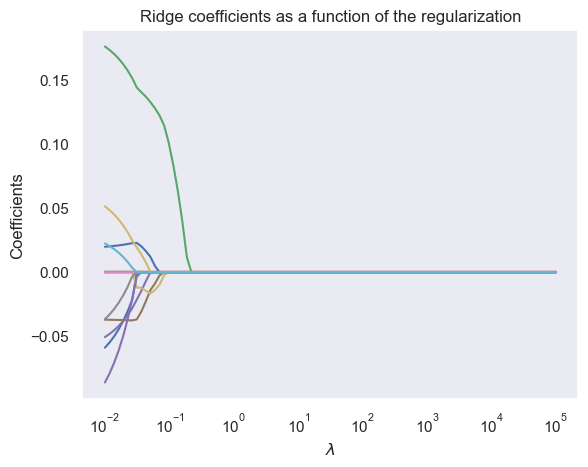

In [403]:
#Lasso regression
n_alphas = 100
alphas = np.logspace(-2, 5, n_alphas)

coefs = []
for a in alphas:
    ridge = linear_model.Lasso(alpha=a)
    results = ridge.fit(X_train, y_train)
    coefs.append(ridge.coef_)

ax = plt.gca()

ax.plot(alphas, coefs, )
plt.xlabel("$\lambda$")
ax.set_xscale("log")
plt.ylabel("Coefficients")
plt.title("Ridge coefficients as a function of the regularization")
plt.axis("tight")
plt.grid()
plt.show()

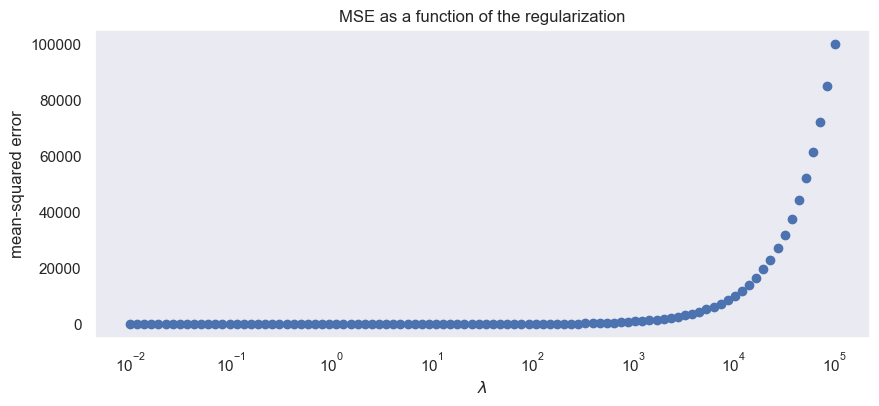

In [404]:
reg = linear_model.LassoCV(alphas=alphas, cv=10)
reg = reg.fit(X_train, y_train)

_, ax = plt.subplots(figsize=(10,4))
ax.scatter(alphas, reg.alphas)
ax.set_xscale("log")
plt.xlabel("$\lambda$")
plt.ylabel("mean-squared error")
plt.title("MSE as a function of the regularization")
plt.axis("tight")
plt.grid()
plt.show()

In [405]:
print("Best score:", reg.alpha_)
print("Estimated regularization parameter alpha:", reg.alpha_)
print("Training score:", reg.score(X_train, y_train))
print("Test score:", reg.score(X_test, y_test))

Best score: 0.08302175681319744
Estimated regularization parameter alpha: 0.08302175681319744
Training score: 0.16769831018400871
Test score: 0.054903521909602904


In [408]:
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split, cross_val_score

Estimated regularization parameter alpha: 2.898695901602828
Best score (cross-validation): -0.5144525878884505
Training score: 0.1335672088560116
Test score: 0.028273303917384696


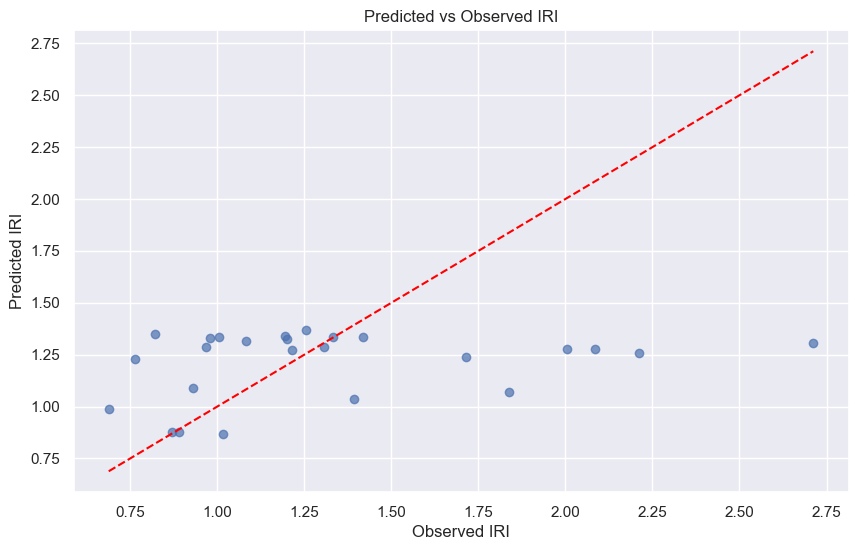

In [409]:
## Delete DELETE DELETE
# Define predictors and response variable
predictors = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'KESAL_SHA', 'AADTT_Der', 
              'TMI', 'flooding', 'flood_duration', 'TX35', 'extreme_heat', 'PET', 'ETR',  
              'Fatigue_diff', 'LongWP_diff', 'LongNWP_diff', 'transverse_diff', 'Rut_diff']
X = df2_clean[predictors]
y = df2_clean['IRI']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Lasso regression with cross-validation
lasso_cv = LassoCV(cv=5, random_state=42).fit(X_train, y_train)

# Best alpha value found
best_alpha = lasso_cv.alpha_
print(f"Estimated regularization parameter alpha: {best_alpha}")

# Scores
train_score = lasso_cv.score(X_train, y_train)
test_score = lasso_cv.score(X_test, y_test)
cross_val_scores = cross_val_score(lasso_cv, X, y, cv=5)

print(f"Best score (cross-validation): {cross_val_scores.mean()}")
print(f"Training score: {train_score}")
print(f"Test score: {test_score}")

# Plot predicted vs observed values
y_pred = lasso_cv.predict(X_test)
df2_clean['predicted_IRI'] = lasso_cv.predict(X)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
plt.xlabel('Observed IRI')
plt.ylabel('Predicted IRI')
plt.title('Predicted vs Observed IRI')
plt.grid(True)
plt.show()


## Generalized Additive Model (GAM)

In [39]:
from pygam import LinearGAM, s, f

In [40]:

# Assume 'Time' is a continuous predictor, 'Temp' as continuous, and 'Road_class' as a categorical predictor
# Let's say 'IRI' is your response variable indicating road deterioration

# Ensure no missing values in these columns
data = roads_inventory.dropna(subset=['Time', 'AADT_SHA', 'Road_class', 'IRI'])

# Convert categorical data to coded integers if not already
if data['Road_class'].dtype == 'object':
    data['Road_class'] = data['Road_class'].astype('category').cat.codes

# Set up the GAM with splines for continuous variables and a factor for the categorical variable
gam = LinearGAM(s(0) + s(1) + f(2)).fit(data[['Time', 'AADT_SHA', 'Road_class']], data['IRI'])

# Where s(0) and s(1) are spline terms for 'Time' and 'Temp', respectively, and f(2) is a factor term for 'Road_class'


/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_71824/1914628004.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Road_class'] = data['Road_class'].astype('category').cat.codes


In [41]:
# Print model statistics
print(gam.summary())

# Generate predictions
predicted_IRI = gam.predict(data[['Time', 'AADT_SHA', 'Road_class']])


LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                      17.879
Link Function:                     IdentityLink Log Likelihood:                                  -257.1066
Number of Samples:                          118 AIC:                                              551.9712
                                                AICc:                                             559.6208
                                                GCV:                                                0.1749
                                                Scale:                                              0.1279
                                                Pseudo R-Squared:                                   0.3408
Feature Function                  Lam

/var/folders/8b/nhg5twvs5mxd82lh6j5h6ty40000gp/T/ipykernel_71824/2044228068.py:2: UserWarning: KNOWN BUG: p-values computed in this summary are likely much smaller than they should be. 
 
Please do not make inferences based on these values! 

Collaborate on a solution, and stay up to date at: 
github.com/dswah/pyGAM/issues/163 

  print(gam.summary())


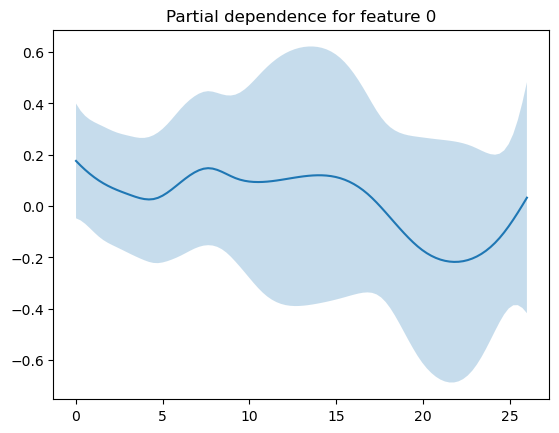

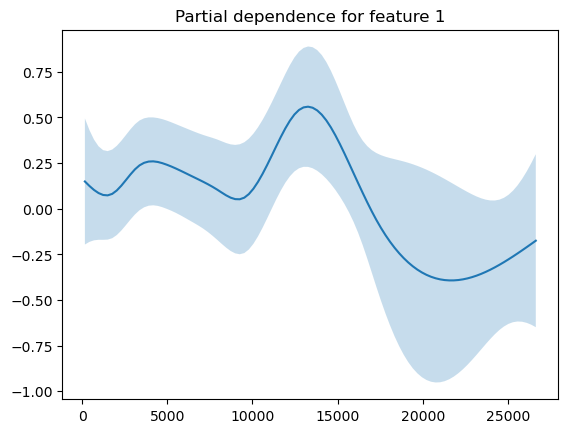

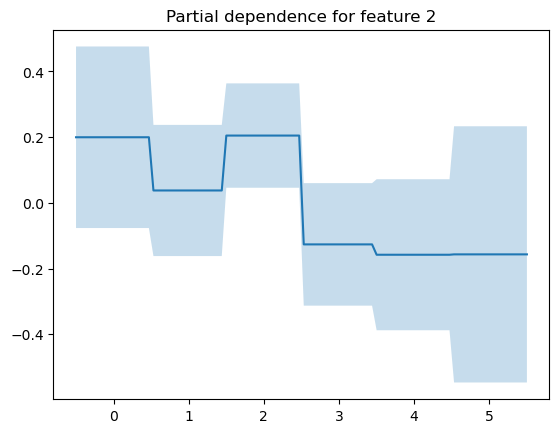

In [42]:
# Plot the partial dependence for each predictor
for i, term in enumerate(gam.terms):
    if term.isintercept:
        continue
    XX = gam.generate_X_grid(term=i)
    pdep, confi = gam.partial_dependence(term=i, X=XX, width=0.95)
    
    plt.figure()
    plt.plot(XX[:, i], pdep)
    plt.fill_between(XX[:, i], confi[:, 0], confi[:, 1], alpha=0.25)
    plt.title(f'Partial dependence for feature {i}')
    plt.show()


In [333]:
from pygam import LinearGAM, s

# Setting a random seed for reproducibility
np.random.seed(42)

# Generating arbitrary data
years = np.arange(2000, 2020)  # 20 years from 2000 to 2019
aadt = np.random.normal(loc=1450, scale=5, size=len(years))  # Average temperature of 20C with some variation
iri_initial = np.random.normal(loc=1, scale=0.5, size=len(years))  # Random initial IRI values

# Create a DataFrame
data = pd.DataFrame({
    'Year': years,
    'AADT_SHA': aadt,
    'IRI': iri_initial,
    'Road_class': 'Rural Principal Arterial - Interstate'  # All entries as 'Rural'
})

# Assuming 'Year' and 'Temp' were used to train the GAM
# First, simulate training the GAM with the initial data (this should ideally be separate and realistic training data)
gam = LinearGAM(s(0) + s(1)).gridsearch(data[['Year', 'AADT_SHA']].values, data['IRI'])

# Predict IRI using the same model (normally you would use new/different data for predictions)
data['Predicted_IRI'] = gam.predict(data[['Year', 'AADT_SHA']])

# Show the first few rows of the data to verify
print(data.head())


100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:000:00


   Year     AADT_SHA       IRI                             Road_class  \
0  2000  1452.483571  1.732824  Rural Principal Arterial - Interstate   
1  2001  1449.308678  0.887112  Rural Principal Arterial - Interstate   
2  2002  1453.238443  1.033764  Rural Principal Arterial - Interstate   
3  2003  1457.615149  0.287626  Rural Principal Arterial - Interstate   
4  2004  1448.829233  0.727809  Rural Principal Arterial - Interstate   

   Predicted_IRI  
0       1.725248  
1       0.889421  
2       1.046630  
3       0.259941  
4       0.768544  


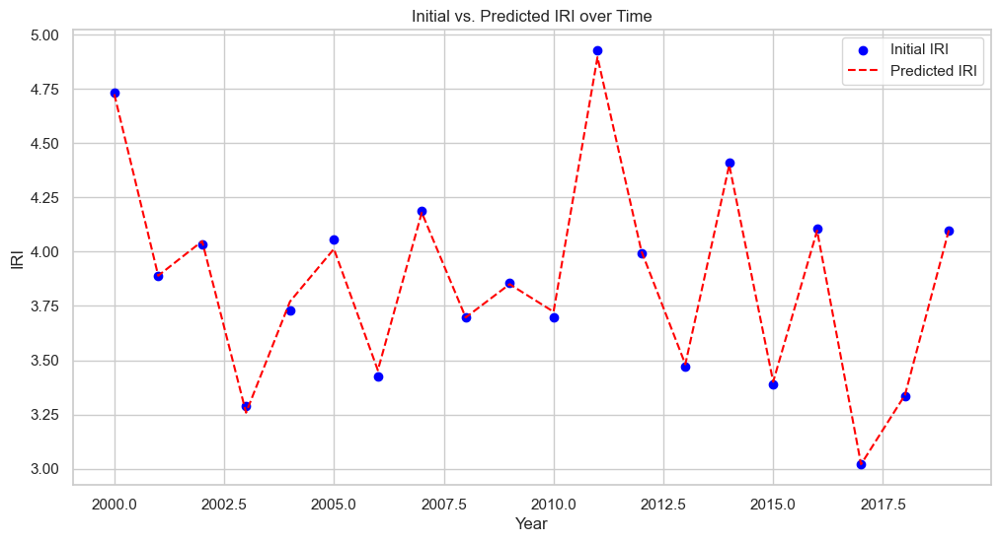

In [332]:
#Visualize the prediction
plt.figure(figsize=(12, 6))
plt.scatter(data['Year'], data['IRI'], color='blue', label='Initial IRI')
plt.plot(data['Year'], data['Predicted_IRI'], color='red', label='Predicted IRI', linestyle='--')
plt.title('Initial vs. Predicted IRI over Time')
plt.xlabel('Year')
plt.ylabel('IRI')
plt.legend()
plt.grid(True)
plt.show()


# STOCHASTIC MODELS

In [ ]:
"""
Stochastic models will be preferred for the following situations: (1) Rapid deterioration event/point (Tipping point), (2)Uncertainty 
inclusion of future climates.
"""

## Survival curves/ analysis

In [ ]:
"""
Survival time analysis is one of the most popular methods for estimating the remaining service life of pavements. 
The survival analysis models the survival time of an event and quantifies the effect of predictors (independent variables) on the survival 
time. 
The survival analysis will also assess the impact of maintenance interventions on the failure of the pavement.
Using continuous probability functions. These functions will help to estimate the probability of an event occuring:
1. Crack initiation
2. Commencement of rapid deterioration
3. Time to rut failure

Examples:
Log-logistic proportional hazard model evaluated crack initiation (Loizos and Karlaftis, 2005)
Weibull proportional hazard model evaluated time to rutting failure (Auiar-Moya et al., 2010)

STEPS (Eltahan et al.1999):
1. Determine type of data (Not censored, Right censored, Left censored, Interval censored) (Hatoum et al., 2022)
    a. Not censored: Failure occurs during the study observation period
    b. Right censored: Right-censored occurs when the failure time doesn’t occur during the observation time but after.
    c: Left censored: Left-censored occurs when the exact time of failure is unknown and the occurrence of failure happens between time 0 
        and t before the beginning of study or observation.
    d. Interval censored: Interval-censored occurs when the pavement under study failed within a certain specified time interval but 
        the exact time of occurrence is unknown.
2. Define the performance failure criteria. E.g
    a. IRI: Poor (2.68m/km)
    b. Alligator/Fatigue cracking: 20% lane area (Hatoum et al., 2022a)
    c. Longitudinal cracking: 132.6m/km (Hatoum et al., 2022a)
    d. Transverse cracking" 132.6m/km (Hatoum et al., 2022a)
    e. Rut depth: 12.7mm (Hatoum et al., 2022b: https://doi.org/10.54729/CUBR7851)
3. Identification of  the survival time of each pavement section (time from construction to failure).
4. Identification of survival time of each pavement section after maintenance intervention (time from maintenance to failure).
5. Calculate probability of survival (number of sections that do not fail at survival time)
6. Calculate failure probability = 1 - survival probability
7. Plot failure curves (failure probability vs time)
8. Compare failure probabilities at time = t1 for different pavement conditions

Note:
The survival time is not the life expectancy of the pavement, but it is an estimate of that life at a given level of failure probability
"""

In [304]:
from lifelines import KaplanMeierFitter, NelsonAalenFitter

Not Censored: 3.42%
Right Censored: 96.58%


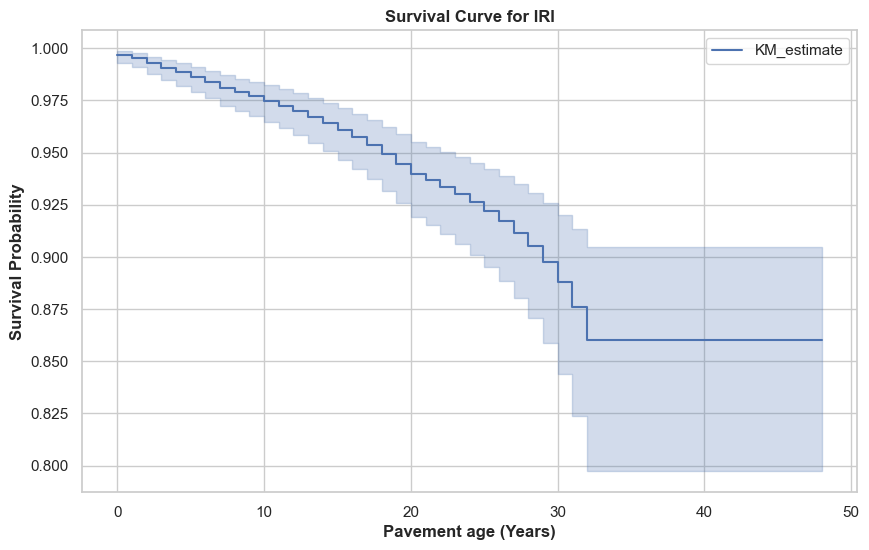

In [307]:
#Fatigue cracking
# Define the threshold
threshold = 2.68

roads_inventory['IRI'] = roads_inventory['IRI'].astype(float)
# Determine censoring
roads_inventory['IRI'] = roads_inventory['IRI'] >= threshold

# Calculate percentages for censoring
total_count = len(roads_inventory)
not_censored = roads_inventory['IRI'].sum()
right_censored = total_count - not_censored

# Print percentages
print(f"Not Censored: {not_censored / total_count * 100:.2f}%")
print(f"Right Censored: {right_censored / total_count * 100:.2f}%")

# Initialize KaplanMeierFitter
kmf = KaplanMeierFitter()

# Fit the data
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['IRI'])

# Plot survival function
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.title('Survival Curve for IRI', fontweight='bold')
plt.xlabel('Pavement age (Years)', fontweight='bold')
plt.ylabel('Survival Probability', fontweight='bold')
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Survival_IRI.png')
plt.show()


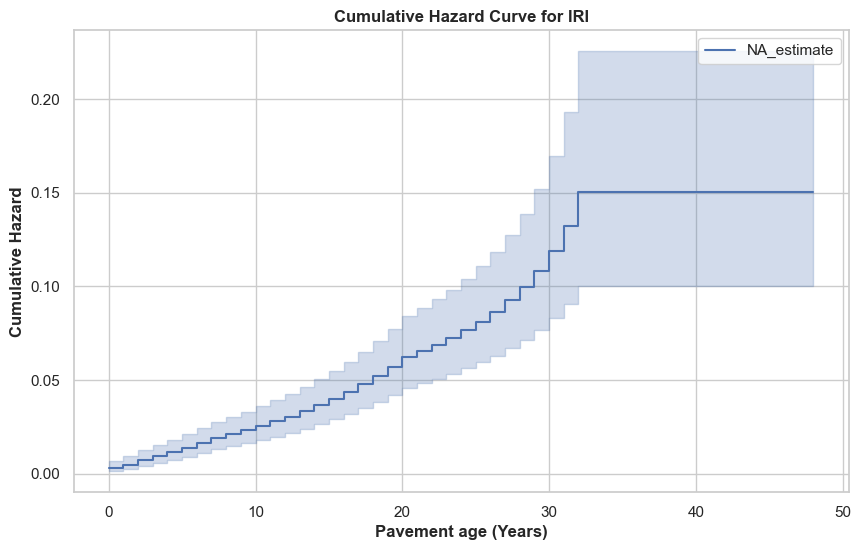

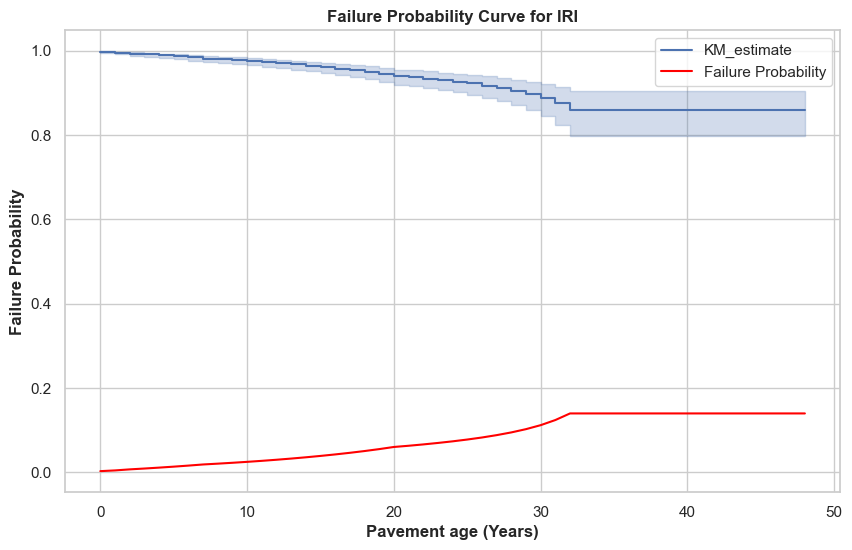

In [308]:
"""
Plot failure probability curves for the different performance and defect indicators.
"""
inventory_failure = roads_inventory.dropna(subset=['IRI'])

# Initialize NelsonAalenFitter
naf = NelsonAalenFitter()

# Fit the data for cumulative hazard function
naf.fit(durations=inventory_failure['Time'], event_observed=inventory_failure['IRI'])

# Plot cumulative hazard function
plt.figure(figsize=(10, 6))
naf.plot_cumulative_hazard()
plt.title('Cumulative Hazard Curve for IRI', fontweight='bold')
plt.xlabel('Pavement age (Years)', fontweight='bold')
plt.ylabel('Cumulative Hazard', fontweight='bold')
plt.show()

# Plot failure probability (1 - survival function)
plt.figure(figsize=(10, 6))
kmf.plot_survival_function()
plt.plot(kmf.survival_function_.index, 1 - kmf.survival_function_['KM_estimate'], color='red', label='Failure Probability')
plt.title('Failure Probability Curve for IRI', fontweight='bold')
plt.xlabel('Pavement age (Years)', fontweight='bold')
plt.ylabel('Failure Probability', fontweight='bold')
plt.legend()
plt.grid(True)
plt.show()


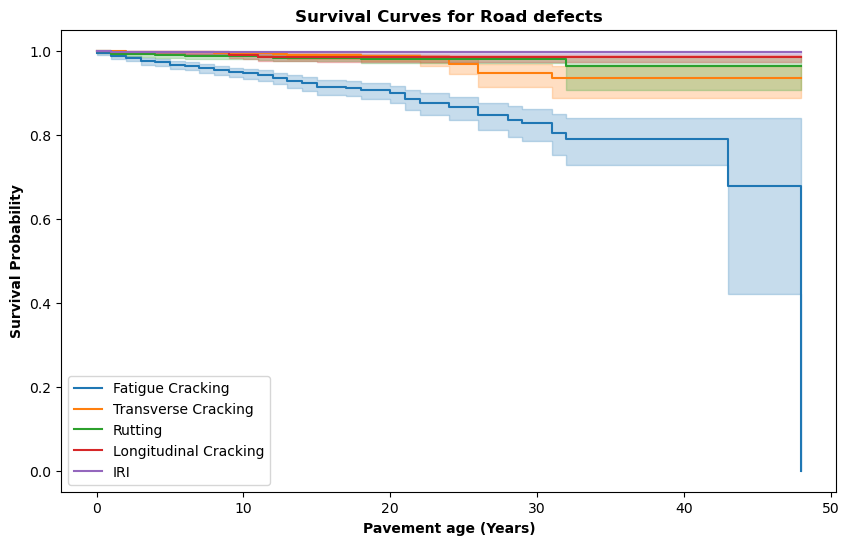

In [108]:
# Define thresholds for each type of cracking
threshold_fatigue = 20
threshold_transverse = 132.6
threshold_rutting = 12.7
threshold_longitudinal = 132.6
threshold_IRI = 2.68 #(m/km) or 170 inches per mile

# Convert to float
roads_inventory['Fatigue'] = roads_inventory['Fatigue'].astype(float)
roads_inventory['Transverse'] = roads_inventory['Transverse'].astype(float)
roads_inventory['Rut'] = roads_inventory['Rut'].astype(float)
roads_inventory['Longitudinal_WP'] = roads_inventory['Longitudinal_WP'].astype(float)
roads_inventory['IRI'] = roads_inventory['IRI'].astype(float)

# Determine censoring for each type of cracking
roads_inventory['Fatigue_observed'] = roads_inventory['Fatigue'] >= threshold_fatigue
roads_inventory['Transverse_observed'] = roads_inventory['Transverse'] >= threshold_transverse
roads_inventory['Rutting_observed'] = roads_inventory['Rut'] >= threshold_rutting
roads_inventory['Longitudinal_observed'] = roads_inventory['Longitudinal_WP'] >= threshold_longitudinal
roads_inventory['IRI_observed'] = roads_inventory['IRI'] >= threshold_IRI

# Initialize KaplanMeierFitter
kmf = KaplanMeierFitter()

# Plot all survival functions
plt.figure(figsize=(10, 6))

# Fit and plot for Fatigue cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Fatigue_observed'], label='Fatigue Cracking')
kmf.plot_survival_function()

# Fit and plot for Transverse cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Transverse_observed'], label='Transverse Cracking')
kmf.plot_survival_function()

# Fit and plot for Rutting
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Rutting_observed'], label='Rutting')
kmf.plot_survival_function()

# Fit and plot for Longitudinal cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Longitudinal_observed'], label='Longitudinal Cracking')
kmf.plot_survival_function()

# Fit and plot for Longitudinal cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['IRI_observed'], label='IRI')
kmf.plot_survival_function()

# Add titles and labels
plt.title('Survival Curves for Road defects', fontweight='bold')
plt.xlabel('Pavement age (Years)', fontweight='bold')
plt.ylabel('Survival Probability', fontweight='bold')

# Save the plot
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Survival_all_cracking_types.png')

# Show the plot
plt.show()


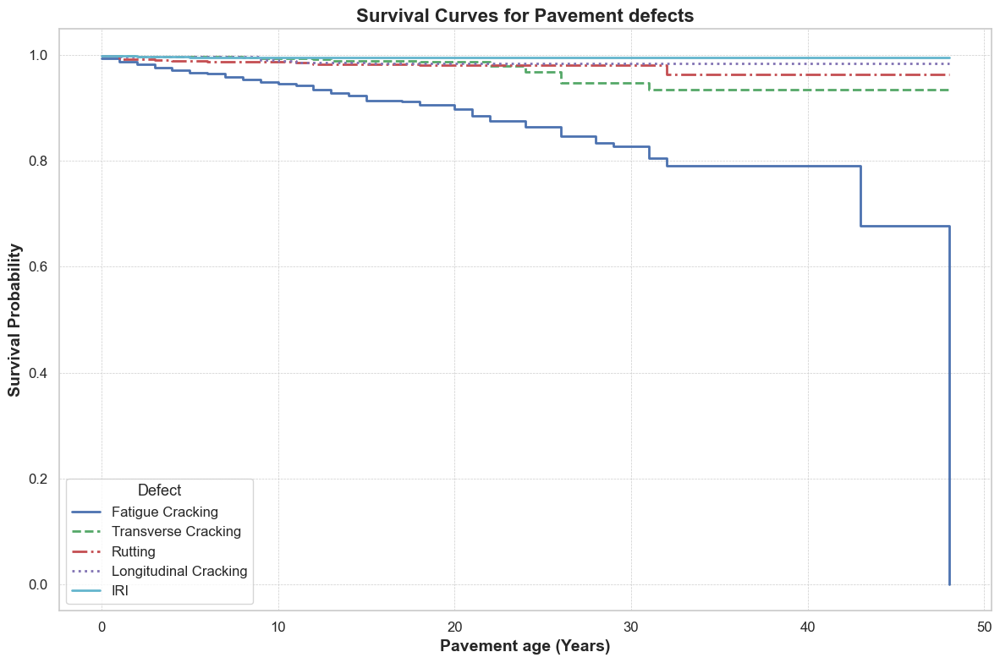

In [120]:
#Develop survival curves for the pavement defects
"""
Consider % of not-censored, right and left censored data to determine if data is representative of failure modes.
Develop singular survival curves using historical data.
Introduce uncertainty in the survival curves by considering uncertainty in future climate 
"""

# Use seaborn style for better aesthetics
sns.set(style='whitegrid')

# Define thresholds for each type of cracking
threshold_fatigue = 20 #20% of lane area. Note fatigue cracking is given as area of cracked sections m2
threshold_transverse = 132.6 # m/km. Note data presents this as length of cracking (m)
threshold_rutting = 12.7 #mm
threshold_longitudinal = 132.6 #m/km. Note data presents this as length of cracking (m)
threshold_IRI = 2.68 #(m/km) or 170 inches per mile

# Convert to float
roads_inventory['Fatigue'] = roads_inventory['Fatigue'].astype(float)
roads_inventory['Transverse'] = roads_inventory['Transverse'].astype(float)
roads_inventory['Rut'] = roads_inventory['Rut'].astype(float)
roads_inventory['Longitudinal_WP'] = roads_inventory['Longitudinal_WP'].astype(float)
roads_inventory['IRI'] = roads_inventory['IRI'].astype(float)

# Determine censoring for each type of cracking
roads_inventory['Fatigue_observed'] = roads_inventory['Fatigue'] >= threshold_fatigue
roads_inventory['Transverse_observed'] = roads_inventory['Transverse'] >= threshold_transverse
roads_inventory['Rutting_observed'] = roads_inventory['Rut'] >= threshold_rutting
roads_inventory['Longitudinal_observed'] = roads_inventory['Longitudinal_WP'] >= threshold_longitudinal
roads_inventory['IRI_observed'] = roads_inventory['IRI'] >= threshold_IRI

# Initialize KaplanMeierFitter
kmf = KaplanMeierFitter()

# Plot all survival functions
plt.figure(figsize=(12, 8))

# Define line styles and colors
line_styles = ['-', '--', '-.', ':', '-']
colors = ['b', 'g', 'r', 'm', 'c']

# Fit and plot for Fatigue cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Fatigue_observed'], label='Fatigue Cracking')
kmf.plot_survival_function(ci_show=False, linestyle=line_styles[0], color=colors[0], linewidth=2)

# Fit and plot for Transverse cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Transverse_observed'], label='Transverse Cracking')
kmf.plot_survival_function(ci_show=False, linestyle=line_styles[1], color=colors[1], linewidth=2)

# Fit and plot for Rutting
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Rutting_observed'], label='Rutting')
kmf.plot_survival_function(ci_show=False, linestyle=line_styles[2], color=colors[2], linewidth=2)

# Fit and plot for Longitudinal cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['Longitudinal_observed'], label='Longitudinal Cracking')
kmf.plot_survival_function(ci_show=False, linestyle=line_styles[3], color=colors[3], linewidth=2)

# Fit and plot for Longitudinal cracking
kmf.fit(durations=roads_inventory['Time'], event_observed=roads_inventory['IRI_observed'], label='IRI')
kmf.plot_survival_function(ci_show=False, linestyle=line_styles[4], color=colors[4], linewidth=2)

# Customize the plot
plt.title('Survival Curves for Pavement defects', fontsize=16, fontweight='bold')
plt.xlabel('Pavement age (Years)', fontsize=14, fontweight='bold')
plt.ylabel('Survival Probability', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(title='Defect', title_fontsize='13', fontsize='12')
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Save the plot
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Survival_all.png', dpi=300)

# Show the plot
plt.show()


## Monte Carlo simulation

In [ ]:
"""
Monte Carlo simulations have been used to estimate uncertainty of prediction of dependent variables. These have been applied where 
sound deterministic model from sufficient observational data have been developed (Martin and Kadar, 2012). 
1. Perform diagnostics to decide which model is best to be used with the monte carlo simulation
2. 
"""

#### Diagnostic tests for Monte Carlo simulation

###### Linear regression tests

In [179]:
print(roads_inventory.columns)

Index(['Year', 'Time', 'Road_name', 'GPS', 'Latitude', 'Longitude', 'PRP',
       'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'Road_class', 'Clim_zone',
       'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der',
       'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue', 'Longitudinal_WP',
       'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI', 'IRI', 'Layer_no',
       'Layer', 'Thickness', 'Material', 'TMI', 'flooding', 'flood_duration',
       'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat'],
      dtype='object')


In [190]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, StackingRegressor
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.impute import SimpleImputer
import xgboost as xgb
from catboost import CatBoostRegressor
import statsmodels.api as sm
from statsmodels.stats.diagnostic import het_breuschpagan
from statsmodels.stats.stattools import durbin_watson
import lightgbm as lgb

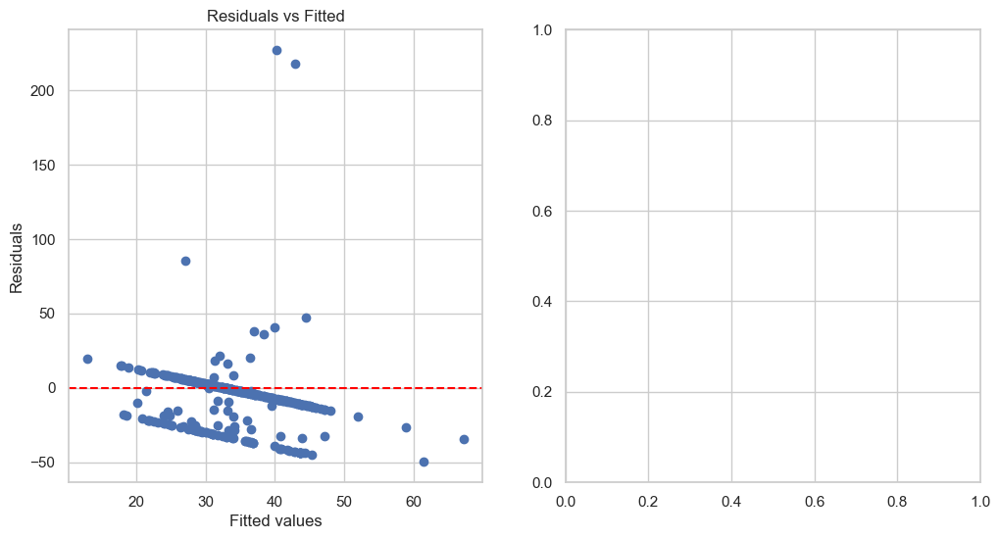

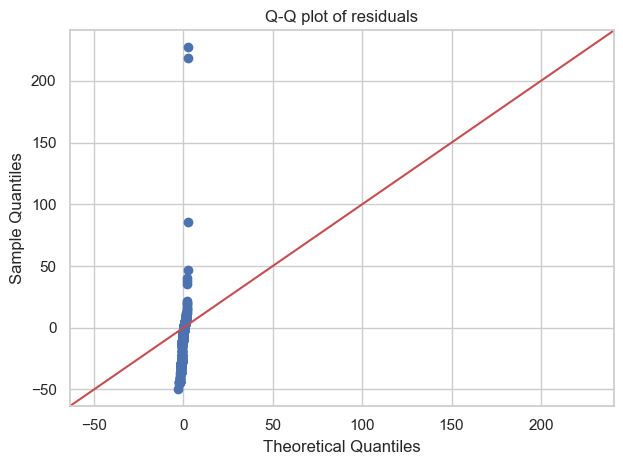

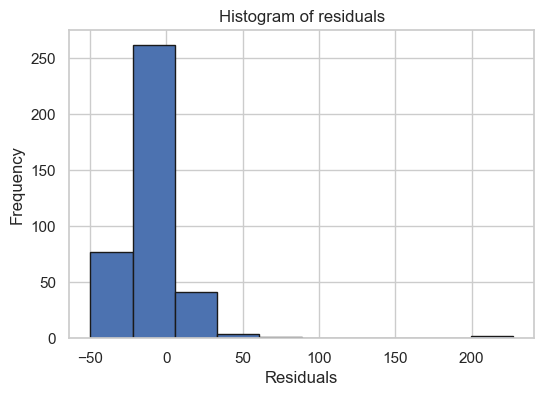

Durbin-Watson statistic: 1.8400544020391587
Breusch-Pagan p-value: 0.8716743518425957
Linear Regression R^2: -0.09852016249072015
Linear Regression RMSE: 23.891668816893716
Polynomial Regression R^2: -0.4254494680915277
Polynomial Regression RMSE: 27.21562942736595
SVR R^2: -0.043306720940847754
SVR RMSE: 23.283511141426356
Random Forest R^2: 0.03256395057675787
Random Forest RMSE: 22.42092897650346
Random Forest CV RMSE: 47.67237191955181 ± 7.129145238785878
XGBoost R^2: 0.01000306052840172
XGBoost RMSE: 22.680853622548476


In [180]:
# Define features and target
features = ['Time', 'KESAL_Comp', 'PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max',
            'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 
            'Layer_no', 'Thickness', 'TMI', 'flooding', 'flood_duration', 
            'TX35', 'extreme_heat']
X = roads_inventory[features]
y_fatigue = roads_inventory['Fatigue']

# Handle missing values
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)
y_fatigue = imputer.fit_transform(y_fatigue.values.reshape(-1, 1)).ravel()

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y_fatigue, test_size=0.2, random_state=42)

# Fit linear regression model
lr_model = LinearRegression().fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

# Residual analysis
residuals = y_test - y_pred_lr

plt.figure(figsize=(12, 6))

# Residuals vs Fitted
plt.subplot(1, 2, 1)
plt.scatter(y_pred_lr, residuals)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel('Fitted values')
plt.ylabel('Residuals')
plt.title('Residuals vs Fitted')

# Q-Q plot
plt.subplot(1, 2, 2)
sm.qqplot(residuals, line='45')
plt.title('Q-Q plot of residuals')

plt.tight_layout()
plt.show()

# Histogram of residuals
plt.figure(figsize=(6, 4))
plt.hist(residuals, bins=10, edgecolor='k')
plt.title('Histogram of residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Durbin-Watson test for autocorrelation
dw_stat = durbin_watson(residuals)
print(f'Durbin-Watson statistic: {dw_stat}')

# Add a constant to X_test for Breusch-Pagan test
X_test_with_const = sm.add_constant(X_test)

# Breusch-Pagan test for heteroscedasticity
_, pval, __, f_pval = het_breuschpagan(residuals, X_test_with_const)
print(f'Breusch-Pagan p-value: {pval}')

# Evaluate linear regression model
print(f'Linear Regression R^2: {r2_score(y_test, y_pred_lr)}')
print(f'Linear Regression RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_lr))}')

# Polynomial Regression
poly_features = PolynomialFeatures(degree=2)
X_poly_train = poly_features.fit_transform(X_train)
X_poly_test = poly_features.transform(X_test)

poly_model = LinearRegression().fit(X_poly_train, y_train)
y_pred_poly = poly_model.predict(X_poly_test)

print(f'Polynomial Regression R^2: {r2_score(y_test, y_pred_poly)}')
print(f'Polynomial Regression RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_poly))}')

# Support Vector Regression (SVR)
svr = SVR()
param_grid = {'C': [0.1, 1, 10], 'epsilon': [0.01, 0.1, 1]}
svr_model = GridSearchCV(svr, param_grid, cv=5)
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

print(f'SVR R^2: {r2_score(y_test, y_pred_svr)}')
print(f'SVR RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_svr))}')

# Fit Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

# Evaluate Random Forest model
print(f'Random Forest R^2: {r2_score(y_test, y_pred_rf)}')
print(f'Random Forest RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf))}')

# Cross-validation for Random Forest
cv_scores = cross_val_score(rf_model, X, y_fatigue, cv=5, scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_scores)
print(f'Random Forest CV RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}')

# Fit XGBoost model
xgb_model = xgb.XGBRegressor(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7]
}
xgb_grid = GridSearchCV(xgb_model, param_grid, cv=5, scoring='neg_mean_squared_error')
xgb_grid.fit(X_train, y_train)

best_xgb_model = xgb_grid.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test)

print(f'XGBoost R^2: {r2_score(y_test, y_pred_xgb)}')
print(f'XGBoost RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb))}')



In [192]:
# Ensemble of models
# Define features and target
features = ['Time', 'KESAL_Comp', 'PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max',
            'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA', 'AADTT_Mon', 'AADTT_Der', 
            'Layer_no', 'Thickness', 'TMI', 'flooding', 'flood_duration', 
            'TX35', 'extreme_heat']
X = roads_inventory[features]
y_fatigue = roads_inventory['Fatigue']

# Handle missing values
imputer = SimpleImputer(strategy='mean')
X = imputer.fit_transform(X)
y_fatigue = imputer.fit_transform(y_fatigue.values.reshape(-1, 1)).ravel()

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y_fatigue, test_size=0.2, random_state=42)

# Linear Regression
lr_model = LinearRegression().fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)

print(f'Linear Regression R^2: {r2_score(y_test, y_pred_lr)}')
print(f'Linear Regression RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_lr))}')

# Polynomial Regression
poly_features = PolynomialFeatures(degree=2)
X_poly_train = poly_features.fit_transform(X_train)
X_poly_test = poly_features.transform(X_test)

poly_model = LinearRegression().fit(X_poly_train, y_train)
y_pred_poly = poly_model.predict(X_poly_test)

print(f'Polynomial Regression R^2: {r2_score(y_test, y_pred_poly)}')
print(f'Polynomial Regression RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_poly))}')

# Support Vector Regression (SVR)
svr = SVR()
param_grid = {'C': [0.1, 1, 10], 'epsilon': [0.01, 0.1, 1]}
svr_model = GridSearchCV(svr, param_grid, cv=5)
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

print(f'SVR R^2: {r2_score(y_test, y_pred_svr)}')
print(f'SVR RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_svr))}')

# Fit Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)

# Evaluate Random Forest model
print(f'Random Forest R^2: {r2_score(y_test, y_pred_rf)}')
print(f'Random Forest RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_rf))}')

# Cross-validation for Random Forest
cv_scores = cross_val_score(rf_model, X, y_fatigue, cv=5, scoring='neg_mean_squared_error')
cv_rmse = np.sqrt(-cv_scores)
print(f'Random Forest CV RMSE: {cv_rmse.mean()} ± {cv_rmse.std()}')

# Fit XGBoost model
xgb_model = xgb.XGBRegressor(random_state=42)
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7]
}
xgb_grid = GridSearchCV(xgb_model, param_grid, cv=5, scoring='neg_mean_squared_error')
xgb_grid.fit(X_train, y_train)

best_xgb_model = xgb_grid.best_estimator_
y_pred_xgb = best_xgb_model.predict(X_test)

print(f'XGBoost R^2: {r2_score(y_test, y_pred_xgb)}')
print(f'XGBoost RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb))}')

# Fit LightGBM model
lgb_model = lgb.LGBMRegressor(random_state=42)
param_grid = {
    'num_leaves': [31, 50, 100],
    'learning_rate': [0.01, 0.1, 0.3],
    'n_estimators': [50, 100, 200]
}

grid_search_lgb = GridSearchCV(estimator=lgb_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_lgb.fit(X_train, y_train)

best_lgb_model = grid_search_lgb.best_estimator_
y_pred_lgb = best_lgb_model.predict(X_test)

print(f'LightGBM R^2: {r2_score(y_test, y_pred_lgb)}')
print(f'LightGBM RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_lgb))}')

# Fit CatBoost model
cat_model = CatBoostRegressor(random_state=42, silent=True)
param_grid = {
    'depth': [6, 8, 10],
    'learning_rate': [0.01, 0.1, 0.3],
    'iterations': [100, 200, 300]
}

grid_search_cat = GridSearchCV(estimator=cat_model, param_grid=param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search_cat.fit(X_train, y_train)

best_cat_model = grid_search_cat.best_estimator_
y_pred_cat = best_cat_model.predict(X_test)

print(f'CatBoost R^2: {r2_score(y_test, y_pred_cat)}')
print(f'CatBoost RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_cat))}')

# Ensemble Model
# Define base models
base_models = [
    ('lr', LinearRegression()),
    ('rf', RandomForestRegressor(random_state=42)),
    ('xgb', xgb.XGBRegressor(random_state=42)),
    ('lgb', best_lgb_model),
    ('cat', best_cat_model)
]

# Define stacking ensemble model
stacking_model = StackingRegressor(estimators=base_models, final_estimator=LinearRegression())
stacking_model.fit(X_train, y_train)
y_pred_stacking = stacking_model.predict(X_test)

print(f'Stacking Ensemble R^2: {r2_score(y_test, y_pred_stacking)}')
print(f'Stacking Ensemble RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_stacking))}')


Linear Regression R^2: -0.09852016249072015
Linear Regression RMSE: 23.891668816893716
Polynomial Regression R^2: -0.4254494680915277
Polynomial Regression RMSE: 27.21562942736595
SVR R^2: -0.043306720940847754
SVR RMSE: 23.283511141426356
Random Forest R^2: 0.03256395057675787
Random Forest RMSE: 22.42092897650346
Random Forest CV RMSE: 47.67237191955181 ± 7.129145238785878
XGBoost R^2: 0.01000306052840172
XGBoost RMSE: 22.680853622548476
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001168 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1647
[LightGBM] [Info] Number of data points in the train set: 1235, number of used features: 19
[LightGBM] [Info] Start training from score 34.382318
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_row_wise=true` to remove th

###### Polynomial regression tests

In [176]:
from sklearn.ensemble import VotingRegressor

# Ensemble of different models
ensemble_model = VotingRegressor(
    estimators=[
        ('lr', LinearRegression()),
        ('rf', RandomForestRegressor(random_state=42)),
        ('xgb', xgb.XGBRegressor(random_state=42))
    ]
)
ensemble_model.fit(X_train, y_train)
y_pred_ensemble = ensemble_model.predict(X_test)

print(f'Ensemble R^2: {r2_score(y_test, y_pred_ensemble)}')
print(f'Ensemble RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_ensemble))}')


Ensemble R^2: 0.01005229252176354
Ensemble RMSE: 22.680289662462805


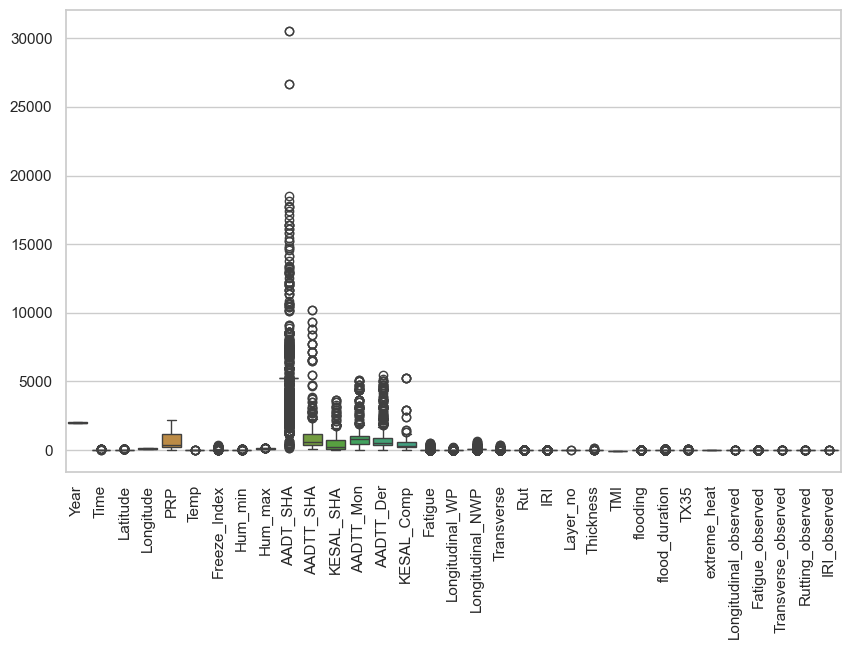

ValueError: could not convert string to float: 'Interstate-10 , Westbound'

In [164]:
#Exploratory Data analysis
# EDA: Visualize relationships
sns.pairplot(roads_inventory)
plt.show()

# Boxplot to identify outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=roads_inventory)
plt.xticks(rotation=90)
plt.show()

# Correlation matrix
corr_matrix = roads_inventory.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


In [165]:
#Time series
import statsmodels.api as sm

# Assuming 'Time' is a regular time series index
y = roads_inventory.set_index('Time')['Fatigue']

# Fit ARIMA model
arima_model = sm.tsa.ARIMA(y, order=(1, 1, 1)).fit()
print(arima_model.summary())

# Forecast
forecast = arima_model.forecast(steps=10)
print(forecast)


                               SARIMAX Results                                
Dep. Variable:                Fatigue   No. Observations:                 1931
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -9827.032
Date:                Thu, 23 May 2024   AIC                          19660.064
Time:                        13:44:11   BIC                          19676.760
Sample:                             0   HQIC                         19666.205
                               - 1931                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1286      0.010    -12.347      0.000      -0.149      -0.108
ma.L1         -0.7699      0.006   -120.115      0.000      -0.782      -0.757
sigma2      1548.0842     10.730    144.283      0.0

/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/pamelaacheng/micromamba/envs/landslides/lib/python3.11/site-packages/statsmodels/tsa/base/tsa_model.py:836: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
/Users/pamelaach

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.71512D+00    |proj g|=  1.48271D-01

At iterate    5    f=  4.67745D+00    |proj g|=  4.57666D-02

At iterate   10    f=  4.66935D+00    |proj g|=  6.12068D-03

At iterate   15    f=  4.66774D+00    |proj g|=  2.80526D-03

At iterate   20    f=  4.66737D+00    |proj g|=  5.26401D-04

At iterate   25    f=  4.66732D+00    |proj g|=  6.86994D-05

At iterate   30    f=  4.66732D+00    |proj g|=  1.41734D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nac

 This problem is unconstrained.


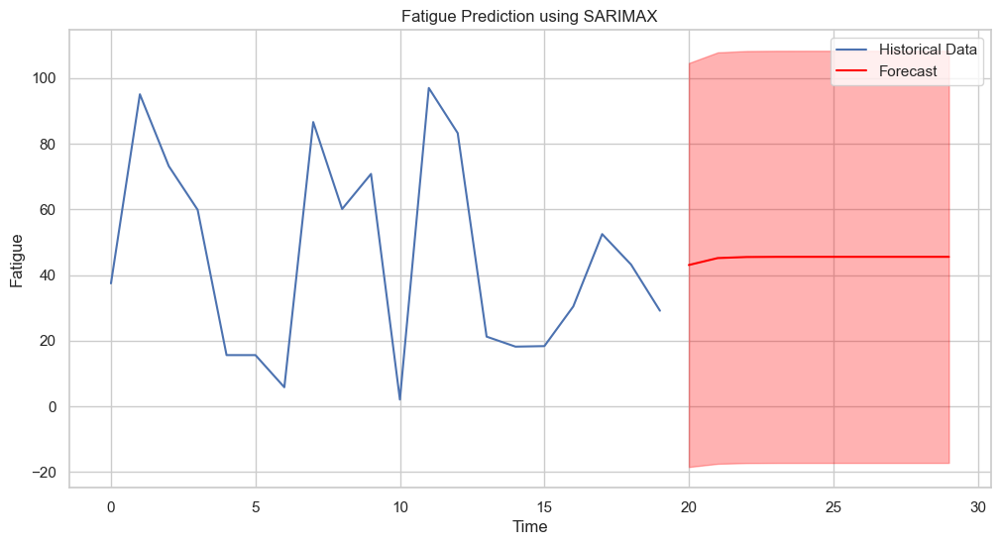

In [193]:
# Sample data preparation
np.random.seed(42)
n = 20
roads_inventory = pd.DataFrame({
    'Time': np.arange(n),
    'Fatigue': np.random.uniform(0, 100, n),
    'PRP': np.random.uniform(0, 100, n),
    'Temp': np.random.uniform(0, 100, n),
    'Freeze_Index': np.random.uniform(0, 100, n),
    'Hum_min': np.random.uniform(0, 20, n),
    'Hum_max': np.random.uniform(0, 120, n),
    'AADT_SHA': np.random.uniform(0, 1000, n),
    'KESAL_Comp': np.random.uniform(1000, 5000, n),
    #Introduce other variables....remove defects other than fatigue 
})

# Fit SARIMAX model
y = roads_inventory['Fatigue']
model = sm.tsa.SARIMAX(y, order=(1, 1, 1))
results = model.fit()

# Forecast the next 10 steps
forecast = results.get_forecast(steps=10)
forecast_index = np.arange(n, n+10)
forecast_values = forecast.predicted_mean
forecast_conf_int = forecast.conf_int()

# Plotting the results
plt.figure(figsize=(12, 6))
plt.plot(roads_inventory['Time'], y, label='Historical Data')
plt.plot(forecast_index, forecast_values, label='Forecast', color='red')
plt.fill_between(forecast_index, 
                 forecast_conf_int.iloc[:, 0], 
                 forecast_conf_int.iloc[:, 1], 
                 color='red', alpha=0.3)
plt.title('Fatigue Prediction using SARIMAX')
plt.xlabel('Time')
plt.ylabel('Fatigue')
plt.legend()
plt.show()


#### Polynomial regression

In [156]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV

In [157]:
# Polynomial Regression
poly = PolynomialFeatures(degree=2)  # You can adjust the degree
X_poly = poly.fit_transform(X)

poly_model = LinearRegression().fit(X_poly, y_fatigue)
y_pred_poly = poly_model.predict(poly.transform(X_test))

print(f'Polynomial Regression R^2: {r2_score(y_test, y_pred_poly)}')
print(f'Polynomial Regression RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_poly))}')

# Support Vector Regression
svr = SVR()
param_grid = {'C': [0.1, 1, 10], 'epsilon': [0.01, 0.1, 1]}
svr_model = GridSearchCV(svr, param_grid, cv=5)
svr_model.fit(X_train, y_train)
y_pred_svr = svr_model.predict(X_test)

print(f'SVR R^2: {r2_score(y_test, y_pred_svr)}')
print(f'SVR RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_svr))}')


Polynomial Regression R^2: -0.028148378304941213
Polynomial Regression RMSE: 23.113747635145266
SVR R^2: -0.05040640570639887
SVR RMSE: 23.36259877376016


###### Gradient Boosting with XGBoost

In [159]:
import xgboost as xgb
from sklearn.model_selection import GridSearchCV

In [160]:
# Define the model
xgb_model = xgb.XGBRegressor(random_state=42)

# Define the parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.3],
    'max_depth': [3, 5, 7]
}

# Perform GridSearchCV
xgb_grid = GridSearchCV(xgb_model, param_grid, cv=5, scoring='neg_mean_squared_error')
xgb_grid.fit(X_train, y_train)

# Best model
best_xgb_model = xgb_grid.best_estimator_

# Predictions
y_pred_xgb = best_xgb_model.predict(X_test)

# Evaluation
print(f'XGBoost R^2: {r2_score(y_test, y_pred_xgb)}')
print(f'XGBoost RMSE: {np.sqrt(mean_squared_error(y_test, y_pred_xgb))}')


XGBoost R^2: -0.01828075151763131
XGBoost RMSE: 23.002563430209335


#### Perform Monte Carlo simulation

In [133]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer

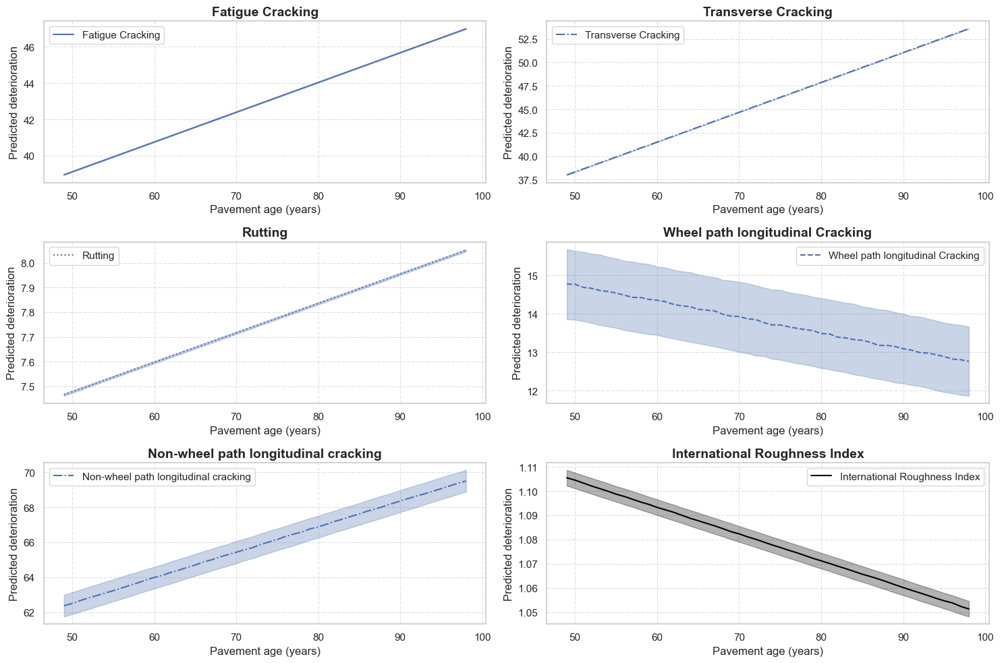

In [151]:
# Define the number of simulations and the number of years to predict
num_simulations = 1000
num_years = 50

# Impute missing values using the mean
imputer = SimpleImputer(strategy='mean')
roads_inventory[['Time', 'Fatigue', 'Transverse', 'Rut', 'Longitudinal_WP', 'AADT_SHA', 'IRI', 'Longitudinal_NWP']] = imputer.fit_transform(
    roads_inventory[['Time', 'Fatigue', 'Transverse', 'Rut', 'Longitudinal_WP', 'AADT_SHA', 'IRI', 'Longitudinal_NWP']]
)

# Define the deterioration model (e.g., linear regression for simplicity)
X = roads_inventory[['Time', 'AADT_SHA']]
y_iri = roads_inventory['IRI']
y_fatigue = roads_inventory['Fatigue']
y_transverse = roads_inventory['Transverse']
y_rutting = roads_inventory['Rut']
y_longitudinal = roads_inventory['Longitudinal_WP']
y_longitudinalnwp = roads_inventory['Longitudinal_NWP']

# Fit linear regression models
model_iri = LinearRegression().fit(X, y_iri)
model_fatigue = LinearRegression().fit(X, y_fatigue)
model_transverse = LinearRegression().fit(X, y_transverse)
model_rutting = LinearRegression().fit(X, y_rutting)
model_longitudinal = LinearRegression().fit(X, y_longitudinal)
model_longitudinalnwp = LinearRegression().fit(X, y_longitudinalnwp)

# Function to perform Monte Carlo simulation
def monte_carlo_simulation(model, X, num_simulations, num_years):
    predictions = []
    for _ in range(num_simulations):
        future_years = np.arange(X['Time'].max() + 1, X['Time'].max() + 1 + num_years)
        future_traffic = np.random.uniform(1000, 5000, num_years)
        future_data = pd.DataFrame({'Time': future_years, 'AADT_SHA': future_traffic})
        preds = model.predict(future_data)
        predictions.append(preds)
    return np.array(predictions)

# Perform Monte Carlo simulations for each type of defect
iri_predictions = monte_carlo_simulation(model_iri, X, num_simulations, num_years)
fatigue_predictions = monte_carlo_simulation(model_fatigue, X, num_simulations, num_years)
transverse_predictions = monte_carlo_simulation(model_transverse, X, num_simulations, num_years)
rutting_predictions = monte_carlo_simulation(model_rutting, X, num_simulations, num_years)
longitudinal_predictions = monte_carlo_simulation(model_longitudinal, X, num_simulations, num_years)
longitudinalnwp_predictions = monte_carlo_simulation(model_longitudinalnwp, X, num_simulations, num_years)

# Calculate mean and confidence intervals for each type of cracking
def calculate_statistics(predictions):
    mean_preds = predictions.mean(axis=0)
    ci_lower = np.percentile(predictions, 2.5, axis=0)
    ci_upper = np.percentile(predictions, 97.5, axis=0)
    return mean_preds, ci_lower, ci_upper

iri_mean, iri_ci_lower, iri_ci_upper = calculate_statistics(iri_predictions)
fatigue_mean, fatigue_ci_lower, fatigue_ci_upper = calculate_statistics(fatigue_predictions)
transverse_mean, transverse_ci_lower, transverse_ci_upper = calculate_statistics(transverse_predictions)
rutting_mean, rutting_ci_lower, rutting_ci_upper = calculate_statistics(rutting_predictions)
longitudinal_mean, longitudinal_ci_lower, longitudinal_ci_upper = calculate_statistics(longitudinal_predictions)
longitudinalnwp_mean, longitudinalnwp_ci_lower, longitudinalnwp_ci_upper = calculate_statistics(longitudinalnwp_predictions)

# Create subplots
fig, axs = plt.subplots(3, 2, figsize=(15, 10))

future_years = np.arange(X['Time'].max() + 1, X['Time'].max() + 1 + num_years)

# Plot fatigue cracking
axs[0, 0].plot(future_years, fatigue_mean, label='Fatigue Cracking', color='b', linestyle='-')
axs[0, 0].fill_between(future_years, fatigue_ci_lower, fatigue_ci_upper, color='b', alpha=0.3)
axs[0, 0].set_title('Fatigue Cracking', fontsize=14, fontweight='bold')
axs[0, 0].set_xlabel('Pavement age (years)', fontsize=12)
axs[0, 0].set_ylabel('Predicted deterioration', fontsize=12)
axs[0, 0].legend()
axs[0, 0].grid(True, which='both', linestyle='-.', linewidth=0.5)

# Plot transverse cracking
axs[0, 1].plot(future_years, transverse_mean, label='Transverse Cracking', color='b', linestyle='-.')
axs[0, 1].fill_between(future_years, transverse_ci_lower, transverse_ci_upper, color='b', alpha=0.3)
axs[0, 1].set_title('Transverse Cracking', fontsize=14, fontweight='bold')
axs[0, 1].set_xlabel('Pavement age (years)', fontsize=12)
axs[0, 1].set_ylabel('Predicted deterioration', fontsize=12)
axs[0, 1].legend()
axs[0, 1].grid(True, which='both', linestyle='-.', linewidth=0.5)

# Plot rutting
axs[1, 0].plot(future_years, rutting_mean, label='Rutting', color='b', linestyle=':')
axs[1, 0].fill_between(future_years, rutting_ci_lower, rutting_ci_upper, color='b', alpha=0.3)
axs[1, 0].set_title('Rutting', fontsize=14, fontweight='bold')
axs[1, 0].set_xlabel('Pavement age (years)', fontsize=12)
axs[1, 0].set_ylabel('Predicted deterioration', fontsize=12)
axs[1, 0].legend()
axs[1, 0].grid(True, which='both', linestyle='-.', linewidth=0.5)

# Plot longitudinal cracking
axs[1, 1].plot(future_years, longitudinal_mean, label='Wheel path longitudinal Cracking', color='b', linestyle='--')
axs[1, 1].fill_between(future_years, longitudinal_ci_lower, longitudinal_ci_upper, color='b', alpha=0.3)
axs[1, 1].set_title('Wheel path longitudinal Cracking', fontsize=14, fontweight='bold')
axs[1, 1].set_xlabel('Pavement age (years)', fontsize=12)
axs[1, 1].set_ylabel('Predicted deterioration', fontsize=12)
axs[1, 1].legend()
axs[1, 1].grid(True, which='both', linestyle='-.', linewidth=0.5)

# Plot Non-wheel path longitudinal cracking
axs[2, 0].plot(future_years, longitudinalnwp_mean, label='Non-wheel path longitudinal cracking', color='b', linestyle='-.')
axs[2, 0].fill_between(future_years, longitudinalnwp_ci_lower, longitudinalnwp_ci_upper, color='b', alpha=0.3)
axs[2, 0].set_title('Non-wheel path longitudinal cracking', fontsize=14, fontweight='bold')
axs[2, 0].set_xlabel('Pavement age (years)', fontsize=12)
axs[2, 0].set_ylabel('Predicted deterioration', fontsize=12)
axs[2, 0].legend()
axs[2, 0].grid(True, which='both', linestyle='-.', linewidth=0.5)

# Plot IRI
axs[2, 1].plot(future_years, iri_mean, label='International Roughness Index', color='black')
axs[2, 1].fill_between(future_years, iri_ci_lower, iri_ci_upper, color='black', alpha=0.3)
axs[2, 1].set_title('International Roughness Index', fontsize=14, fontweight='bold')
axs[2, 1].set_xlabel('Pavement age (years)', fontsize=12)
axs[2, 1].set_ylabel('Predicted deterioration', fontsize=12)
axs[2, 1].legend()
axs[2, 1].grid(True, which='both', linestyle='-.', linewidth=0.5)

plt.tight_layout()
plt.savefig('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Figures/LTTP/Monte_Carlo_Pavement_Deterioration_Subplots.png', dpi=300)
plt.show()


## Linear regression probabilistic model

# MACHINE LEARNING

## Gradient Boosting model

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier #Decision tree visualization 
from sklearn import tree
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

In [20]:
# Check for NaN values in each column
nan_counts = roads_inventory.isna().sum()
# Print columns with NaN counts
print(nan_counts)


Unnamed: 0             0
Year                   0
Time                   0
Road_name              0
GPS                    0
Latitude               0
Longitude              0
PRP                  122
Temp                 122
Freeze_Index         122
Hum_min              122
Hum_max              122
Road_class             0
Clim_zone              0
AADT_SHA            1256
AADTT_SHA           1028
KESAL_SHA           1028
AADTT_Mon           1396
AADTT_Der            656
KESAL_Comp          1623
Surv_date           1298
Maint               1847
Fatigue              429
Longitudinal_WP      433
Longitudinal_NWP     429
Transverse           433
Rut                  453
Surv_IRI            1529
IRI                  518
Layer_no            1683
Layer               1683
Thickness           1719
Material            1683
TMI                  122
flooding               0
flood_duration         0
Flood_BEGAN         1706
Flood_END           1706
TX35                 216
extreme_heat           0


In [21]:
roads_inventory.columns

Index(['Unnamed: 0', 'Year', 'Time', 'Road_name', 'GPS', 'Latitude',
       'Longitude', 'PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max',
       'Road_class', 'Clim_zone', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue',
       'Longitudinal_WP', 'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI',
       'IRI', 'Layer_no', 'Layer', 'Thickness', 'Material', 'TMI', 'flooding',
       'flood_duration', 'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat',
       'PET', 'ETR', 'flood_area', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff',
       'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'Maint_no'],
      dtype='object')

In [41]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.impute import SimpleImputer

Missing values in each column:
PRP                  122
Temp                 122
Freeze_Index         122
Hum_min              122
Hum_max              122
AADT_SHA            1256
AADTT_SHA           1028
KESAL_SHA           1028
AADTT_Mon           1396
AADTT_Der            656
KESAL_Comp          1623
Fatigue              429
Longitudinal_WP      433
Longitudinal_NWP     429
Transverse           433
Rut                  453
Thickness           1719
TMI                  122
flooding               0
flood_duration         0
TX35                 216
extreme_heat           0
PET                  122
ETR                  122
Maint_no               0
IRI                  518
dtype: int64

Infinite values in each column (counted as NaN):
PRP                 0
Temp                0
Freeze_Index        0
Hum_min             0
Hum_max             0
AADT_SHA            0
AADTT_SHA           0
KESAL_SHA           0
AADTT_Mon           0
AADTT_Der           0
KESAL_Comp          0
Fatigue       

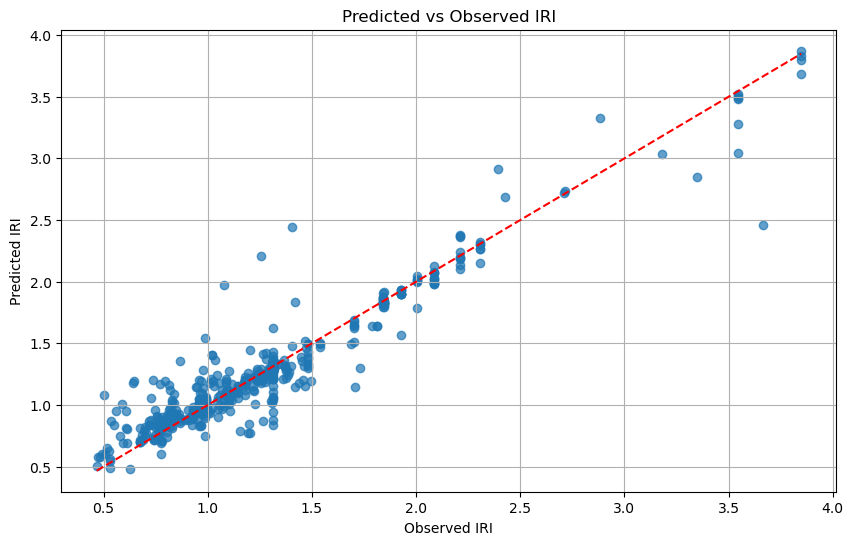

In [49]:
# Ensure the target variable is numeric
training = roads_inventory.copy()
training['IRI'] = pd.to_numeric(training['IRI'], errors='coerce')

# Define the independent variables
columns_independent = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
                       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 
                       'Transverse', 'Rut', 'Thickness', 'TMI', 'flooding', 'flood_duration', 'TX35',
                       'extreme_heat', 'PET', 'ETR', 'Maint_no']

# Convert all independent columns to numeric, forcing errors to NaN
for column in columns_independent:
    training[column] = pd.to_numeric(training[column], errors='coerce')

# Replace infinite values with NaN
training.replace([np.inf, -np.inf], np.nan, inplace=True)

# Check for missing values
missing_values = training[columns_independent + ['IRI']].isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Check for infinite values by converting to numeric and forcing errors to NaN
infinite_values = training[columns_independent + ['IRI']].isnull().sum() - missing_values
print("\nInfinite values in each column (counted as NaN):")
print(infinite_values)

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
training_imputed = imputer.fit_transform(training[columns_independent + ['IRI']])
training_imputed_df = pd.DataFrame(training_imputed, columns=columns_independent + ['IRI'])

# Drop rows with a high number of missing values
training_filtered = training_imputed_df.dropna(thresh=int(len(training_imputed_df.columns) * 0.8))

print("Shape of training_filtered:", training_filtered.shape)

# Check if we have enough data
if training_filtered.shape[0] < 5:
    print("Not enough data after preprocessing. Please check the data and preprocessing steps.")
else:
    # Independent variables (features)
    independent = training_filtered[columns_independent]

    # Dependent variable (target)
    dependent = training_filtered['IRI']

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(independent, dependent, test_size=0.3, random_state=42)

    # Scaling features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize Gradient Boosting Regressor
    gbr = GradientBoostingRegressor(random_state=42)

    # Hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'learning_rate': [0.01, 0.1, 0.2],
        'max_depth': [3, 4, 5]
    }
    grid_search = GridSearchCV(gbr, param_grid, cv=2, scoring='neg_mean_squared_error', n_jobs=-1)  # Use cv=2 for initial testing
    grid_search.fit(X_train_scaled, y_train)

    # Best model from grid search
    best_gbr = grid_search.best_estimator_

    # Predicting the Test set results
    y_pred = best_gbr.predict(X_test_scaled)

    # Evaluate performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Best Parameters:", grid_search.best_params_)
    print("Mean Squared Error:", mse)
    print("R-Squared:", r2)

    # Optional: Plotting predicted vs observed values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.7)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--')
    plt.xlabel('Observed IRI')
    plt.ylabel('Predicted IRI')
    plt.title('Predicted vs Observed IRI')
    plt.grid(True)
    plt.show()


In [25]:
import seaborn as sns
import matplotlib.colors as mcolors

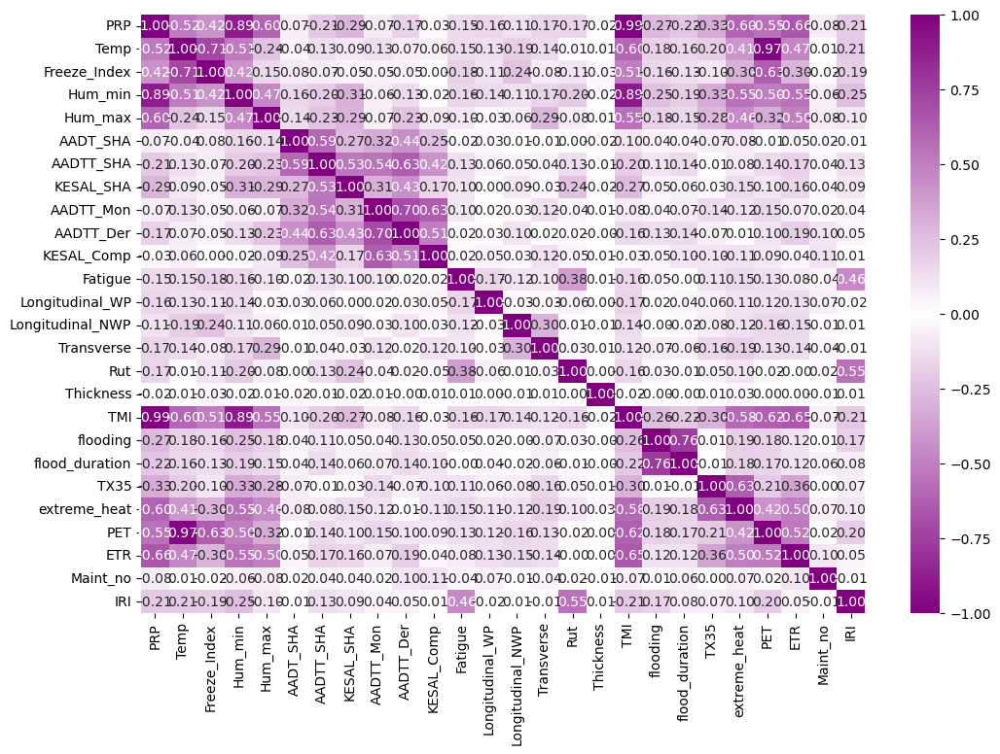

In [53]:
independent = training_filtered.drop(columns_independent, axis=1)
dependent = training_filtered['IRI'].astype(int)

numeric_cols = training_filtered.select_dtypes(include=[np.number])
correlation_matrix = numeric_cols.corr()

# Define a custom diverging colormap
cmap = mcolors.LinearSegmentedColormap.from_list("", ["purple", "white", "purple"])

# Plotting the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap=cmap, vmin=-1, vmax=1)

#Save as a .png
#output_file = '/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/Landslides/Data/Landslide Hazard modelling/Correlation111223chirps.png'
#plt.savefig(output_file, dpi=300, bbox_inches='tight')

plt.show()

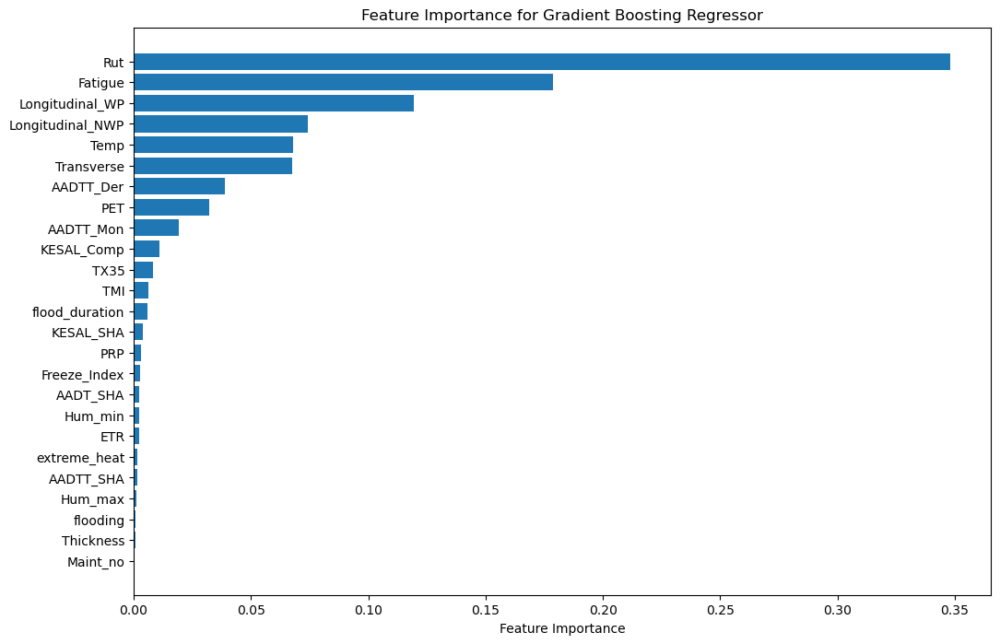

In [59]:
# Plot feature importances
feature_importances = best_gbr.feature_importances_
sorted_idx = np.argsort(feature_importances)
plt.figure(figsize=(12, 8))
plt.barh(np.array(columns_independent)[sorted_idx], feature_importances[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Gradient Boosting Regressor')
plt.show()

### Random Forest model

In [54]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
from sklearn.impute import SimpleImputer

Missing values in each column:
PRP                  122
Temp                 122
Freeze_Index         122
Hum_min              122
Hum_max              122
AADT_SHA            1256
AADTT_SHA           1028
KESAL_SHA           1028
AADTT_Mon           1396
AADTT_Der            656
KESAL_Comp          1623
Fatigue              429
Longitudinal_WP      433
Longitudinal_NWP     429
Transverse           433
Rut                  453
Thickness           1719
TMI                  122
flooding               0
flood_duration         0
TX35                 216
extreme_heat           0
PET                  122
ETR                  122
Maint_no               0
IRI                  518
dtype: int64

Infinite values in each column (counted as NaN):
PRP                 0
Temp                0
Freeze_Index        0
Hum_min             0
Hum_max             0
AADT_SHA            0
AADTT_SHA           0
KESAL_SHA           0
AADTT_Mon           0
AADTT_Der           0
KESAL_Comp          0
Fatigue       

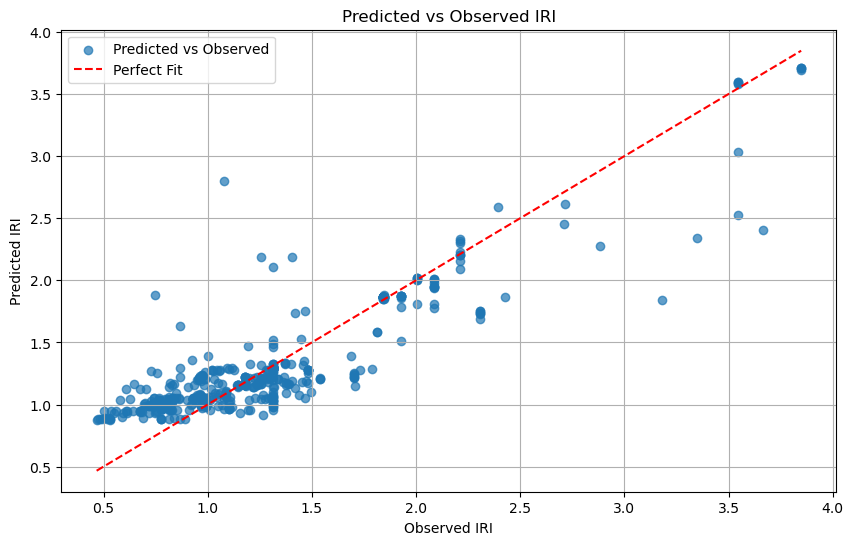

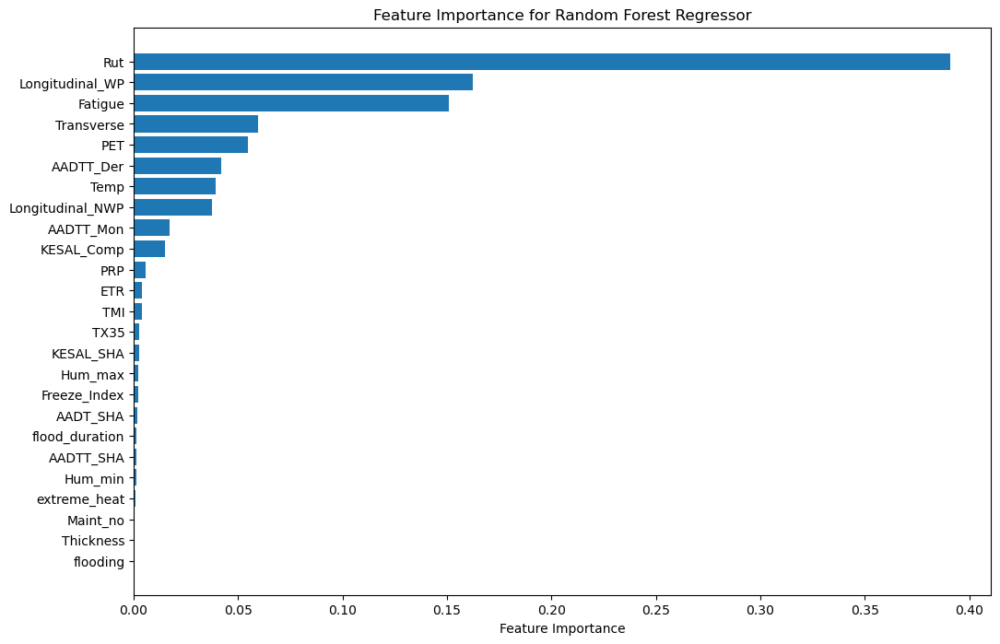

In [62]:
# Ensure the target variable is numeric
training = roads_inventory.copy()
training['IRI'] = pd.to_numeric(training['IRI'], errors='coerce')

# Define the independent variables
columns_independent = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
                       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 
                       'Transverse', 'Rut', 'Thickness', 'TMI', 'flooding', 'flood_duration', 'TX35',
                       'extreme_heat', 'PET', 'ETR', 'Maint_no']

# Convert all independent columns to numeric, forcing errors to NaN
for column in columns_independent:
    training[column] = pd.to_numeric(training[column], errors='coerce')

# Replace infinite values with NaN
training.replace([np.inf, -np.inf], np.nan, inplace=True)

# Check for missing values
missing_values = training[columns_independent + ['IRI']].isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Check for infinite values by converting to numeric and forcing errors to NaN
infinite_values = training[columns_independent + ['IRI']].isnull().sum() - missing_values
print("\nInfinite values in each column (counted as NaN):")
print(infinite_values)

# Impute missing values with the mean 
imputer = SimpleImputer(strategy='mean') # For IRI, mean may be misleading.
training_imputed = imputer.fit_transform(training[columns_independent + ['IRI']])
training_imputed_df = pd.DataFrame(training_imputed, columns=columns_independent + ['IRI'])

# Drop rows with a high number of missing values
training_filtered = training_imputed_df.dropna(thresh=int(len(training_imputed_df.columns) * 0.8))

print("Shape of training_filtered:", training_filtered.shape)

# Check if we have enough data
if training_filtered.shape[0] < 5:
    print("Not enough data after preprocessing. Please check the data and preprocessing steps.")
else:
    # Independent variables (features)
    independent = training_filtered[columns_independent]

    # Dependent variable (target)
    dependent = training_filtered['IRI']

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(independent, dependent, test_size=0.3, random_state=42)

    # Scaling features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize Random Forest Regressor
    rf = RandomForestRegressor(random_state=42)

    # Hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [3, 4, 5],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
    grid_search = GridSearchCV(rf, param_grid, cv=2, scoring='neg_mean_squared_error', n_jobs=-1)  # Use cv=2 for initial testing
    grid_search.fit(X_train_scaled, y_train)

    # Best model from grid search
    best_rf = grid_search.best_estimator_

    # Predicting the Test set results
    y_pred = best_rf.predict(X_test_scaled)

    # Evaluate performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Best Parameters:", grid_search.best_params_)
    print("Mean Squared Error:", mse)
    print("R-Squared:", r2)

    # Plotting predicted vs observed values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs Observed')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Observed IRI')
    plt.ylabel('Predicted IRI')
    plt.title('Predicted vs Observed IRI')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot feature importances
    feature_importances = best_rf.feature_importances_
    sorted_idx = np.argsort(feature_importances)
    plt.figure(figsize=(12, 8))
    plt.barh(np.array(columns_independent)[sorted_idx], feature_importances[sorted_idx])
    plt.xlabel('Feature Importance')
    plt.title('Feature Importance for Random Forest Regressor')
    plt.show()

In [60]:
roads_inventory.columns

Index(['Unnamed: 0', 'Year', 'Time', 'Road_name', 'GPS', 'Latitude',
       'Longitude', 'PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max',
       'Road_class', 'Clim_zone', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Surv_date', 'Maint', 'Fatigue',
       'Longitudinal_WP', 'Longitudinal_NWP', 'Transverse', 'Rut', 'Surv_IRI',
       'IRI', 'Layer_no', 'Layer', 'Thickness', 'Material', 'TMI', 'flooding',
       'flood_duration', 'Flood_BEGAN', 'Flood_END', 'TX35', 'extreme_heat',
       'PET', 'ETR', 'flood_area', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff',
       'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'Maint_no'],
      dtype='object')

Missing values in each column:
PRP                  122
Temp                 122
Freeze_Index         122
Hum_min              122
Hum_max              122
AADT_SHA            1256
AADTT_SHA           1028
KESAL_SHA           1028
AADTT_Mon           1396
AADTT_Der            656
KESAL_Comp          1623
Fatigue              429
Longitudinal_WP      433
Longitudinal_NWP     429
Transverse           433
Rut                  453
Thickness           1719
TMI                  122
flooding               0
flood_duration         0
TX35                 216
extreme_heat           0
PET                  122
ETR                  122
Maint_no               0
IRI_diff             913
Fatigue_diff         869
LongWP_diff          869
LongNWP_diff         869
transverse_diff      869
Rut_diff             883
Time                   0
IRI_diff             913
dtype: int64

Infinite values in each column (counted as NaN):
PRP                 0
Temp                0
Freeze_Index        0
Hum_min        

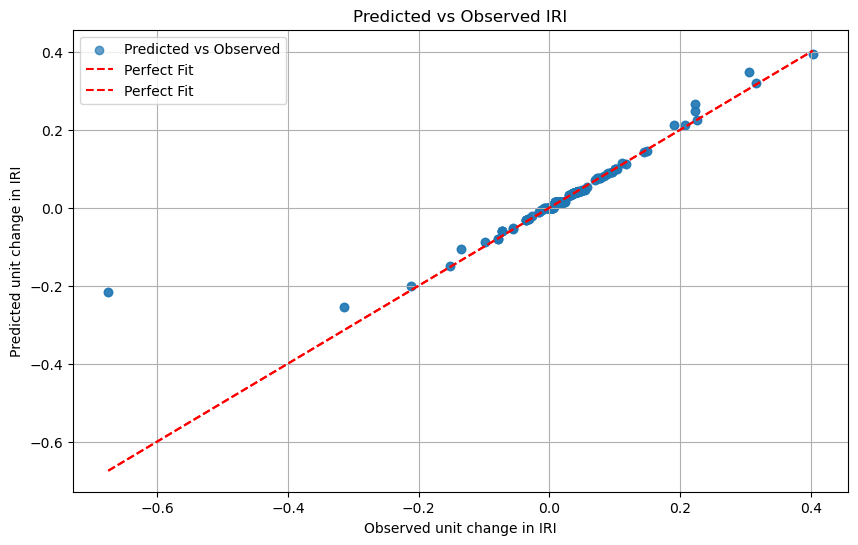

IndexError: index 32 is out of bounds for axis 0 with size 32

<Figure size 1200x800 with 0 Axes>

In [63]:
#Use IRI_diff 
# Ensure the target variable is numeric
training = roads_inventory.copy()
training['IRI'] = pd.to_numeric(training['IRI'], errors='coerce')

# Define the independent variables
columns_independent = ['PRP', 'Temp', 'Freeze_Index', 'Hum_min', 'Hum_max', 'AADT_SHA', 'AADTT_SHA', 'KESAL_SHA',
                       'AADTT_Mon', 'AADTT_Der', 'KESAL_Comp', 'Fatigue', 'Longitudinal_WP', 'Longitudinal_NWP', 
                       'Transverse', 'Rut', 'Thickness', 'TMI', 'flooding', 'flood_duration', 'TX35',
                       'extreme_heat', 'PET', 'ETR', 'Maint_no', 'IRI_diff', 'Fatigue_diff', 'LongWP_diff',
                       'LongNWP_diff', 'transverse_diff', 'Rut_diff', 'Time' ]

# Convert all independent columns to numeric, forcing errors to NaN
for column in columns_independent:
    training[column] = pd.to_numeric(training[column], errors='coerce')

# Replace infinite values with NaN
training.replace([np.inf, -np.inf], np.nan, inplace=True)

# Check for missing values
missing_values = training[columns_independent + ['IRI_diff']].isnull().sum()
print("Missing values in each column:")
print(missing_values)

# Check for infinite values by converting to numeric and forcing errors to NaN
infinite_values = training[columns_independent + ['IRI_diff']].isnull().sum() - missing_values
print("\nInfinite values in each column (counted as NaN):")
print(infinite_values)

# Impute missing values with the mean 
imputer = SimpleImputer(strategy='mean') # For IRI, mean may be misleading.
training_imputed = imputer.fit_transform(training[columns_independent + ['IRI_diff']])
training_imputed_df = pd.DataFrame(training_imputed, columns=columns_independent + ['IRI_diff'])

# Drop rows with a high number of missing values
training_filtered = training_imputed_df.dropna(thresh=int(len(training_imputed_df.columns) * 0.8))

print("Shape of training_filtered:", training_filtered.shape)

# Check if we have enough data
if training_filtered.shape[0] < 5:
    print("Not enough data after preprocessing. Please check the data and preprocessing steps.")
else:
    # Independent variables (features)
    independent = training_filtered[columns_independent]

    # Dependent variable (target)
    dependent = training_filtered['IRI_diff']

    # Splitting the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(independent, dependent, test_size=0.3, random_state=42)

    # Scaling features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initialize Random Forest Regressor
    rf = RandomForestRegressor(random_state=42)

    # Hyperparameter tuning
    param_grid = {
        'n_estimators': [100, 200],
        'max_depth': [3, 4, 5],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 4]
    }
    grid_search = GridSearchCV(rf, param_grid, cv=2, scoring='neg_mean_squared_error', n_jobs=-1)  # Use cv=2 for initial testing
    grid_search.fit(X_train_scaled, y_train)

    # Best model from grid search
    best_rf_df = grid_search.best_estimator_

    # Predicting the Test set results
    y_pred = best_rf_df.predict(X_test_scaled)

    # Evaluate performance
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print("Best Parameters:", grid_search.best_params_)
    print("Mean Squared Error:", mse)
    print("R-Squared:", r2)

    # Plotting predicted vs observed values
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.7, label='Predicted vs Observed')
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Perfect Fit')
    plt.xlabel('Observed unit change in IRI')
    plt.ylabel('Predicted unit change in IRI')
    plt.title('Predicted vs Observed IRI')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Plot feature importances
    feature_importances = best_rf_df.feature_importances_
    sorted_idx = np.argsort(feature_importances)
    plt.figure(figsize=(12, 8))
    plt.barh(np.array(columns_independent)[sorted_idx], feature_importances[sorted_idx])
    plt.xlabel('Feature Importance')
    plt.title('Feature Importance for Random Forest Regressor')
    plt.show()

In [ ]:
#Save trained model
import joblib

# After training the model
joblib.dump(rf_model, 'rf_model.pkl')


In [376]:
roads_inventory.to_csv('/Users/pamelaacheng/Library/CloudStorage/OneDrive-Nexus365/DPhil/2022/HDM4/Data/Road condition/LTTP/Flexible_Pavement_road_condition_02_06_24_Analyze.csv', index=False)